In [1]:
######### Importing Libraries in One Go #########
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from wela.MIdecoding import estimate_MI, plot_MI
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import LinearRegression
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
from sklearn.metrics import mean_squared_error, mean_absolute_error
import time

# Imputation:
## Interpolation alone
This is ***expected to produce an error*** due to NaN values that are still not filled after imputation.

Processing transcription factor: mig1
Number of NaN for a_data is 1
Number of NaN for b_data is 5
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


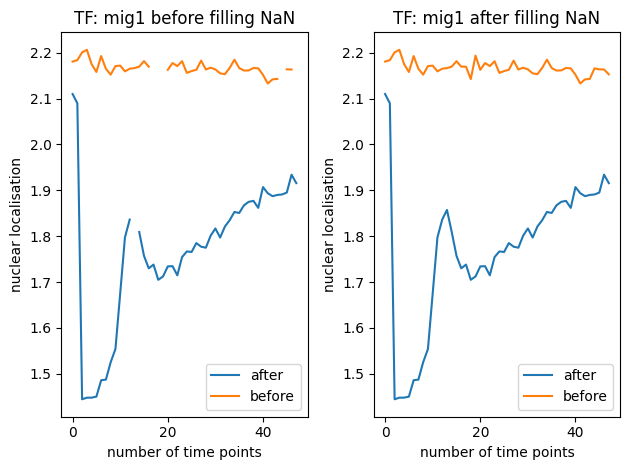

Processing transcription factor: mig2
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


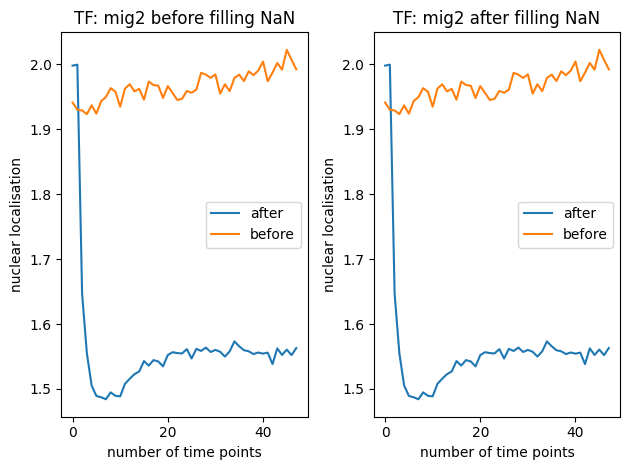

Processing transcription factor: msn2
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


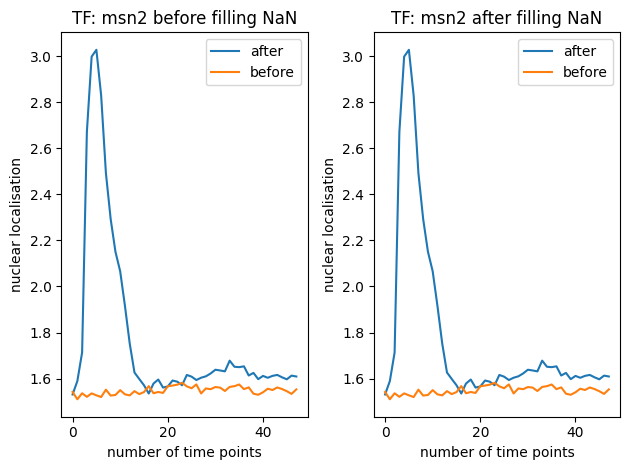

Processing transcription factor: msn4
Number of NaN for a_data is 0
Number of NaN for b_data is 1
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


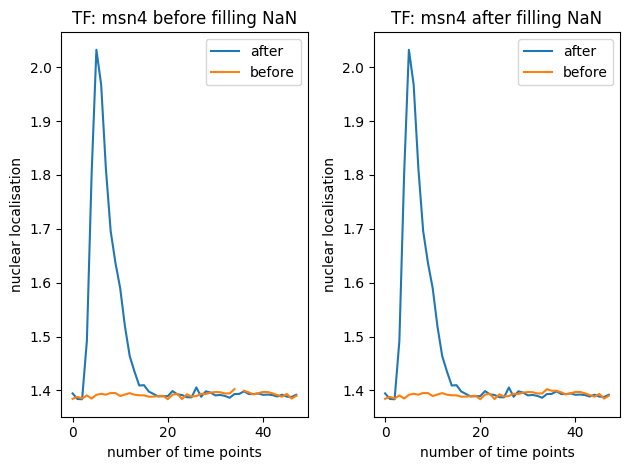

Processing transcription factor: dot6
Number of NaN for a_data is 0
Number of NaN for b_data is 10
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 10


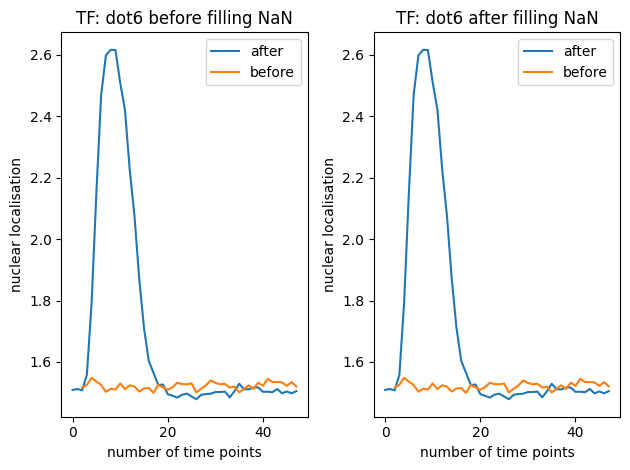

Processing transcription factor: sfp1
Number of NaN for a_data is 0
Number of NaN for b_data is 1
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 1


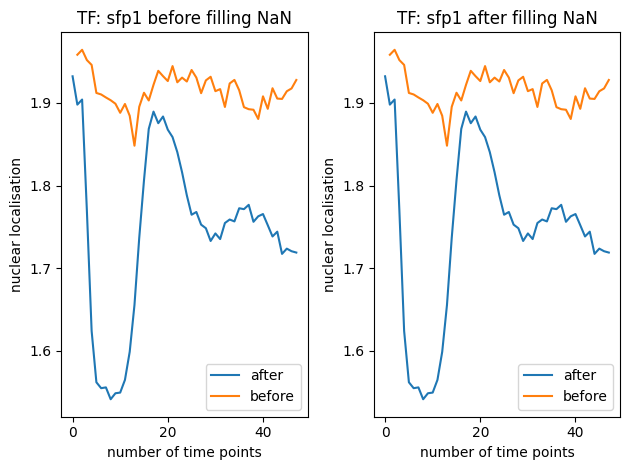

Processing transcription factor: maf1
Number of NaN for a_data is 0
Number of NaN for b_data is 4
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 4


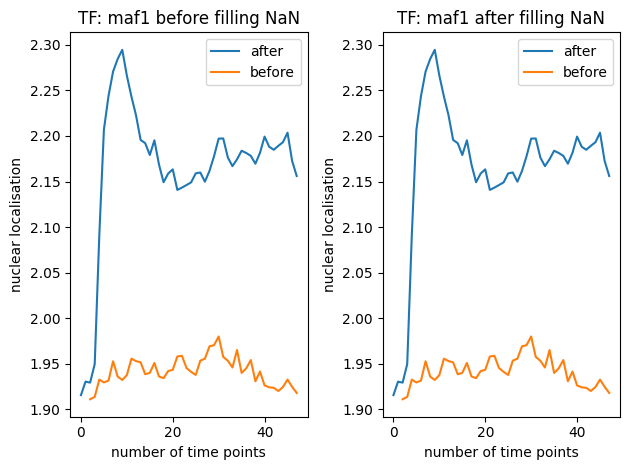

Processing transcription factor: tod6
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


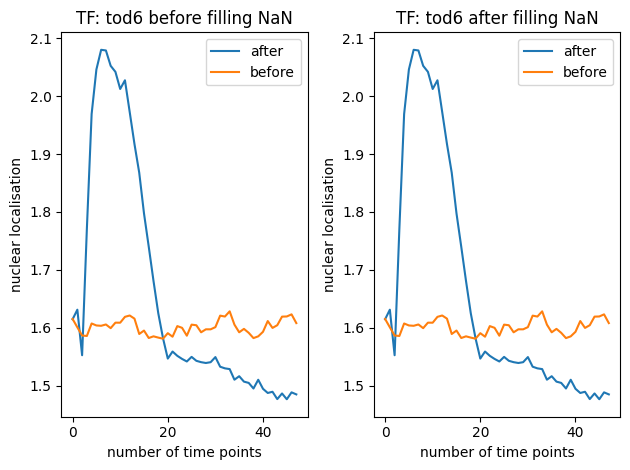

Processing transcription factor: hog1
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


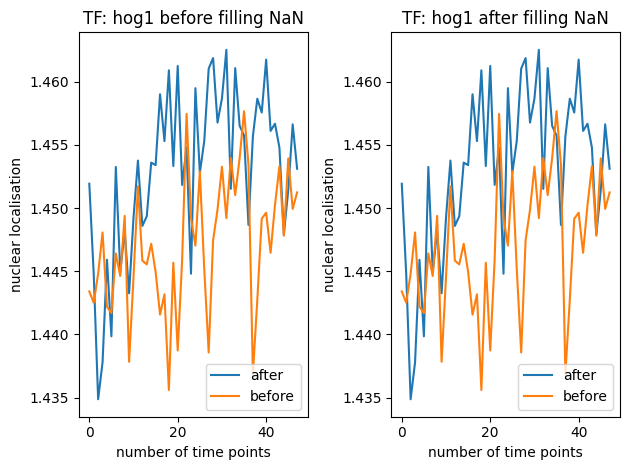

Processing transcription factor: yap1
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


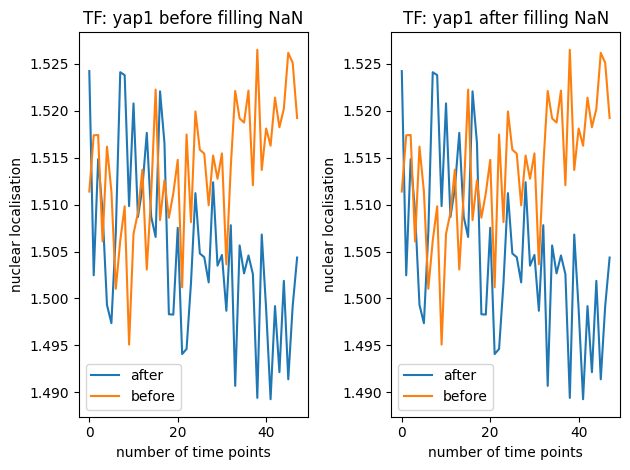

Best parameters for mig1: C=1.0, gamma=0.01
Time taken to estimate MI for mig1: 37.93 seconds
Best parameters for mig2: C=0.01, gamma=0.01
Time taken to estimate MI for mig2: 29.79 seconds
Best parameters for msn2: C=100.0, gamma=0.01
Time taken to estimate MI for msn2: 36.46 seconds
Best parameters for msn4: C=1.0, gamma=1.0
Time taken to estimate MI for msn4: 34.24 seconds


/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/home/ianyang/micromamba/envs/wela/lib/python3.10

ValueError: Input X contains NaN.
SVC does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

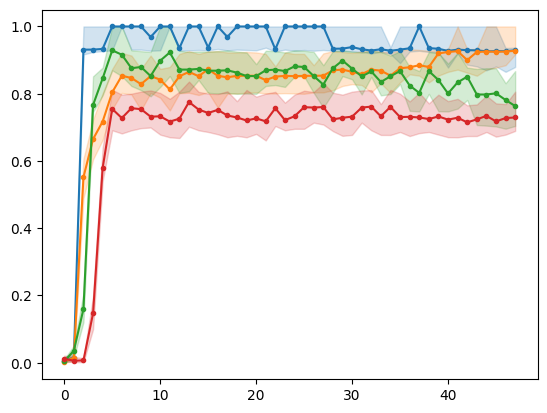

In [ ]:
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from wela.MIdecoding import estimate_MI, plot_MI
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
import time

# Load data and define parameters
fname = "./DS_10283_2901/fig2_stress_type_expts.json"
transcription_factors = ["mig1", "mig2", "msn2", "msn4", "dot6", "sfp1", "maf1", "tod6", "hog1", "yap1"]
stress = "gluc"
param_grid = {
    'C': np.logspace(-2, 2, 5),
    'gamma': np.logspace(-2, 2, 5)
}

try:
    with open(fname, "r") as f:
        expts = json.load(f)

    b_data_all = []
    a_data_all = []
    # Loop through each transcription factor and plot means before and after filling NaN
    for transcription_factor in transcription_factors:
        print(f"Processing transcription factor: {transcription_factor}")
        
        # Load data for the transcription factor
        data = np.array(expts[transcription_factor][stress]["GFP"]["nucLoc"]).astype("float")
        t = np.array(expts[transcription_factor][stress]["general"]["times"]).astype("float")
        b_data = data[:, t[0, :] < 0]
        a_data = data[:, t[0, :] >= 0]
        minlen = np.min([b_data.shape[1], a_data.shape[1]])
        b_data = b_data[:, -minlen:]
        a_data = a_data[:, :minlen]

        print(f"Number of NaN for a_data is {np.sum(np.isnan(a_data))}")
        print(f"Number of NaN for b_data is {np.sum(np.isnan(b_data))}")
        
        fig = plt.figure()
        # plot means before filling NaN
        plt.subplot(1, 2, 1)
        plt.plot(np.mean(a_data, axis=0), label="after")
        plt.plot(np.mean(b_data, axis=0), label="before")
        plt.xlabel("number of time points")
        plt.ylabel("nuclear localisation")
        plt.title(f"TF: {transcription_factor} before filling NaN")
        plt.legend()

        # Impute missing values using 1) Forward and backward filling to fill gaps at the beginning or end of the series. 2) Interpolation fills in missing values based on neighbouring data. 
        print("Filling NaN...\n")
        a_data = pd.DataFrame(a_data).interpolate(axis=1).to_numpy()
        b_data = pd.DataFrame(b_data).interpolate(axis=1).to_numpy()
        print(f"Number of nan for a_data after filling NaN is {np.sum(np.isnan(a_data))}")
        print(f"Number of nan for b_data after filling NaN is {np.sum(np.isnan(b_data))}")

        # append data so that it can be used for MI estimation in the next step
        b_data_all.append(b_data)
        a_data_all.append(a_data)
        
        # plot means after filling NaN
        plt.subplot(1, 2, 2)
        plt.plot(np.mean(a_data, axis=0), label="after")
        plt.plot(np.mean(b_data, axis=0), label="before")
        plt.xlabel("number of time points")
        plt.ylabel("nuclear localisation")
        plt.title(f"TF: {transcription_factor} after filling NaN")
        plt.legend()
        plt.tight_layout()
        plt.show(block=False)

    plt.figure()
    # Loop through each transcription factor and find optimal SVM parameters
    for transcription_factor, b_data, a_data in zip(transcription_factors, b_data_all, a_data_all):
        # Prepare data for SVM tuning
        X = np.concatenate((b_data, a_data), axis=1).T  # Transpose for (samples, features) shape
        y = np.array([0] * b_data.shape[1] + [1] * a_data.shape[1])

        # Grid search for best SVM parameters
        svc = SVC()
        grid_search = GridSearchCV(svc, param_grid, cv=3, n_jobs=-1, scoring='accuracy')
        grid_search.fit(X, y)
        
        best_params = grid_search.best_params_
        print(f"Best parameters for {transcription_factor}: C={best_params['C']}, gamma={best_params['gamma']}")

        # Time the MI estimation
        start_time = time.time()
        res = estimate_MI([b_data, a_data], verbose=False, overtime=True,
                          Crange=[best_params['C']],
                          gammarange=[best_params['gamma']])
        end_time = time.time()
        estimation_time = end_time - start_time
        print(f"Time taken to estimate MI for {transcription_factor}: {estimation_time:.2f} seconds")
        
        # Plot MI result for each transcription factor
        plot_MI(res, label=transcription_factor, color=plt.cm.tab10(transcription_factors.index(transcription_factor) % 10))

    # Customize plot
    plt.xlabel("Response duration (min)")
    plt.ylabel("Mutual Information (bits)")
    plt.legend(loc="best")
    plt.show(block=False)

except FileNotFoundError:
    print("You need to download test data")
    print(f"\t{fname}")
    print("from https://doi.org/10.1073/pnas.1716659115")


## Interpolation + forward/backward filling
 Check for any NaN values in each TF time series whilst using imputation (interpolation + forward/backward filling)
Here, we impute missing values using a combination of:
 1) Forward and backward filling to fill gaps at the beginning or end of the series. 
 2) Interpolation fills in missing values based on neighbouring data. 

Processing transcription factor: mig1
Number of NaN for a_data is 1
Number of NaN for b_data is 5
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


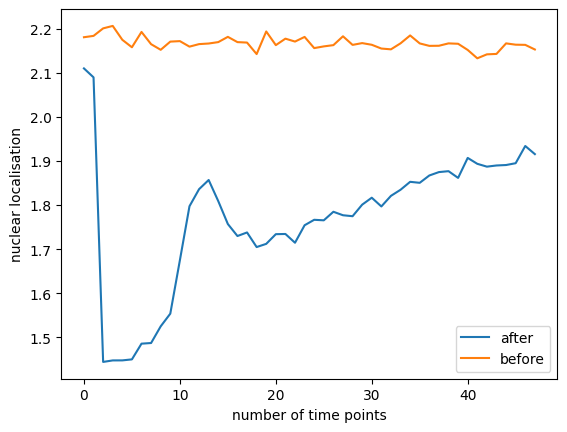

Best parameters for mig1: C=1.0, gamma=0.01
Time taken to estimate MI for mig1: 36.49 seconds


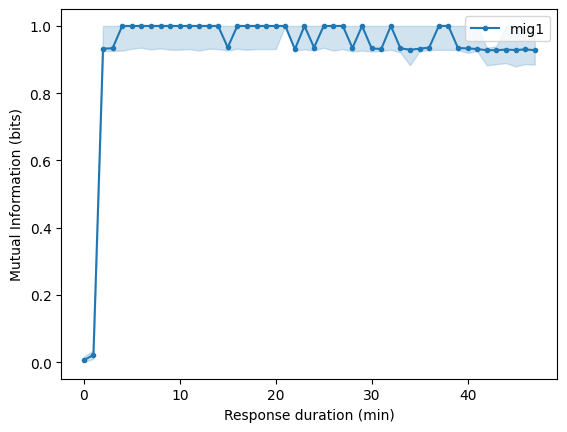

Processing transcription factor: mig2
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


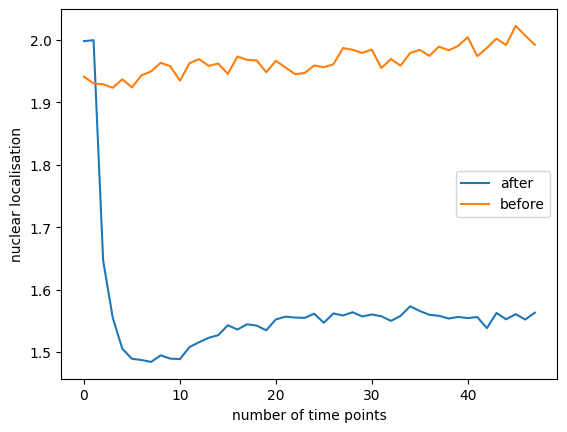

Best parameters for mig2: C=0.01, gamma=0.01
Time taken to estimate MI for mig2: 27.84 seconds


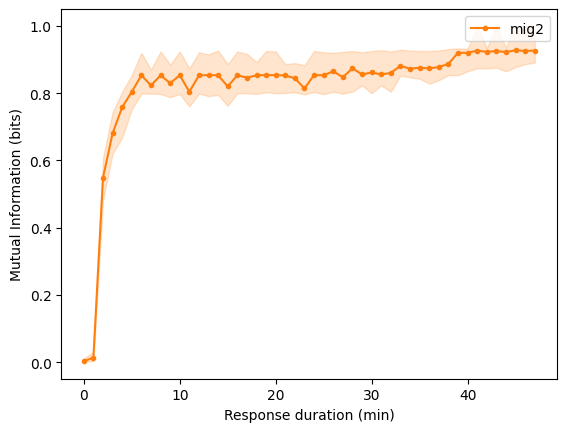

Processing transcription factor: msn2
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


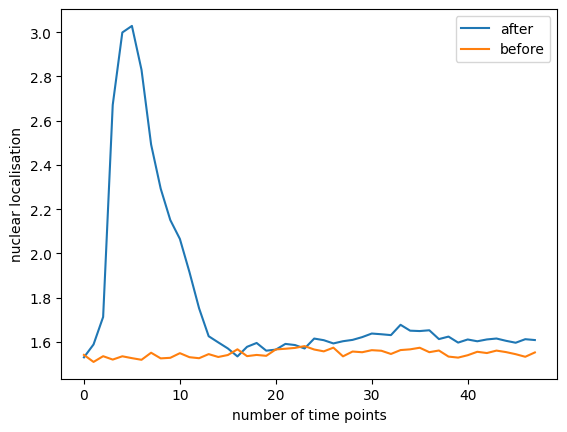

Best parameters for msn2: C=100.0, gamma=0.01
Time taken to estimate MI for msn2: 33.58 seconds


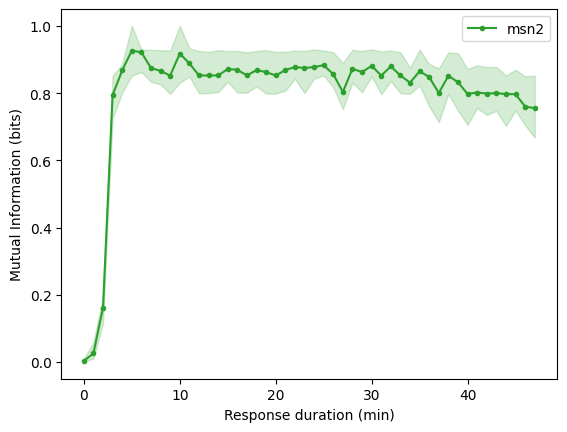

Processing transcription factor: msn4
Number of NaN for a_data is 0
Number of NaN for b_data is 1
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


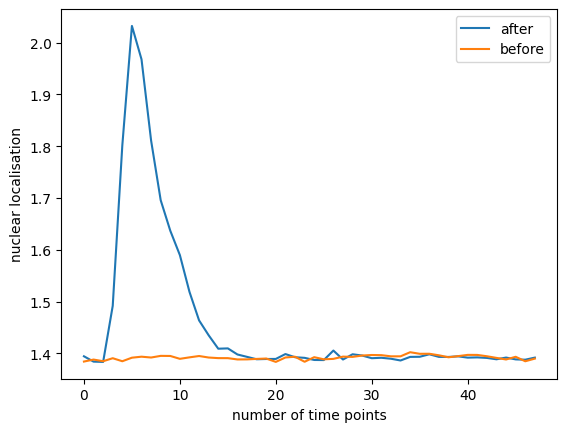

Best parameters for msn4: C=1.0, gamma=1.0
Time taken to estimate MI for msn4: 30.23 seconds


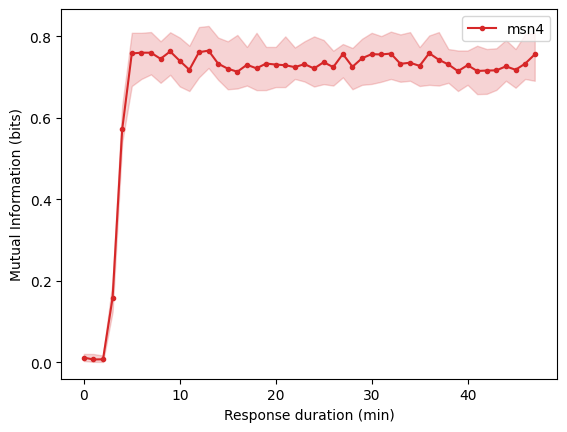

Processing transcription factor: dot6
Number of NaN for a_data is 0
Number of NaN for b_data is 10
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


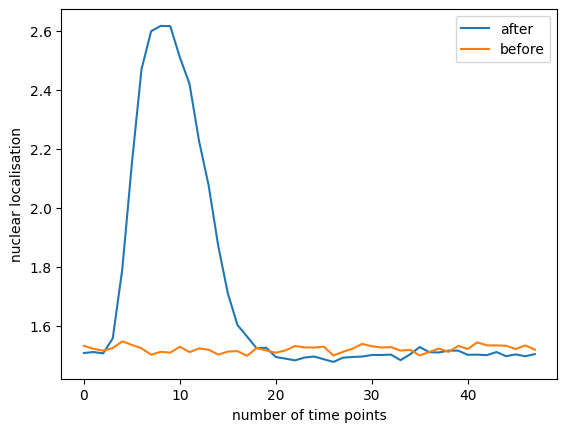

Best parameters for dot6: C=1.0, gamma=1.0
Time taken to estimate MI for dot6: 31.72 seconds


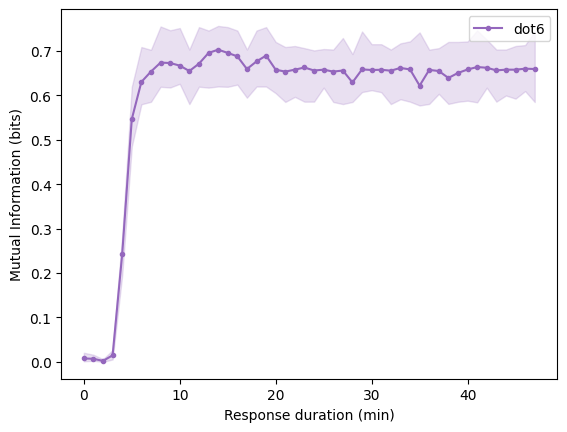

Processing transcription factor: sfp1
Number of NaN for a_data is 0
Number of NaN for b_data is 1
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


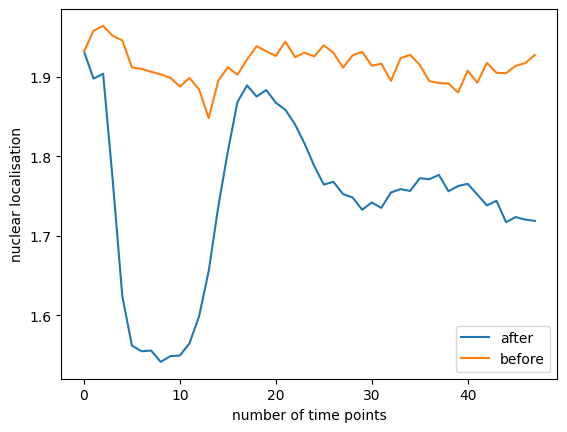

Best parameters for sfp1: C=0.01, gamma=0.1
Time taken to estimate MI for sfp1: 27.75 seconds


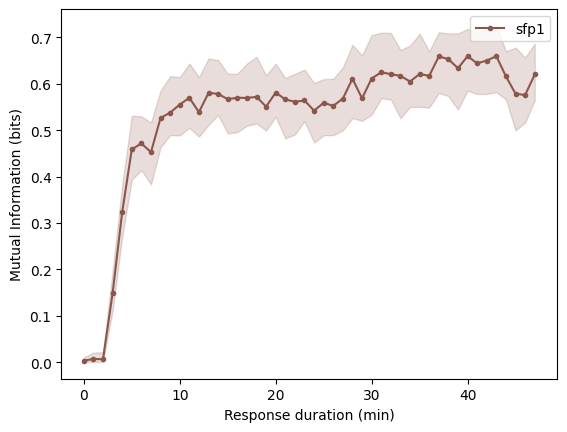

Processing transcription factor: maf1
Number of NaN for a_data is 0
Number of NaN for b_data is 4
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


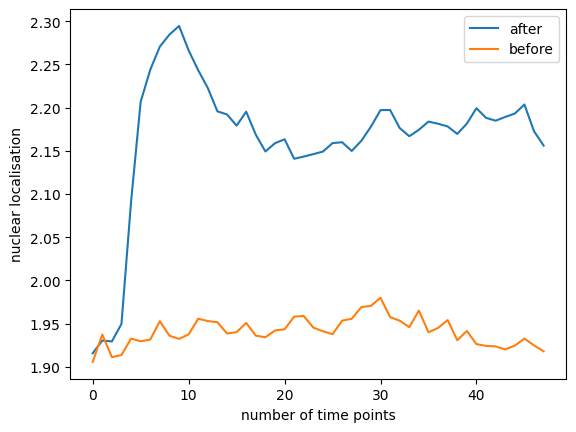

Best parameters for maf1: C=0.01, gamma=0.01
Time taken to estimate MI for maf1: 44.49 seconds


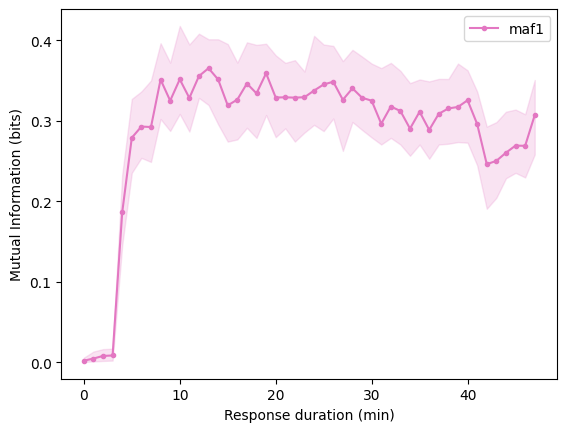

Processing transcription factor: tod6
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


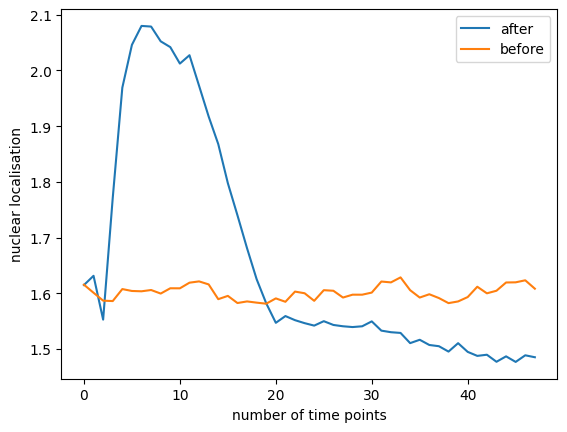

Best parameters for tod6: C=10.0, gamma=0.01
Time taken to estimate MI for tod6: 30.55 seconds


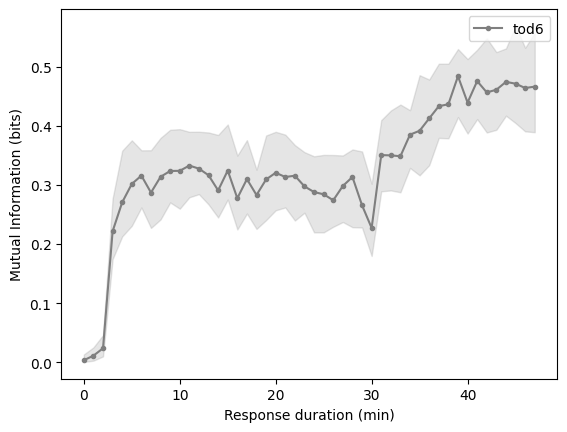

Processing transcription factor: hog1
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


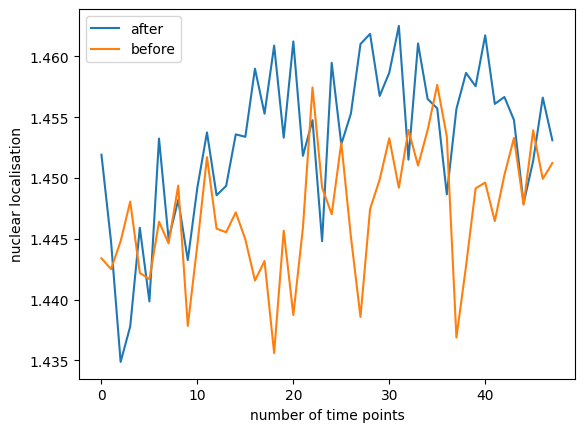

Best parameters for hog1: C=1.0, gamma=1.0
Time taken to estimate MI for hog1: 62.19 seconds


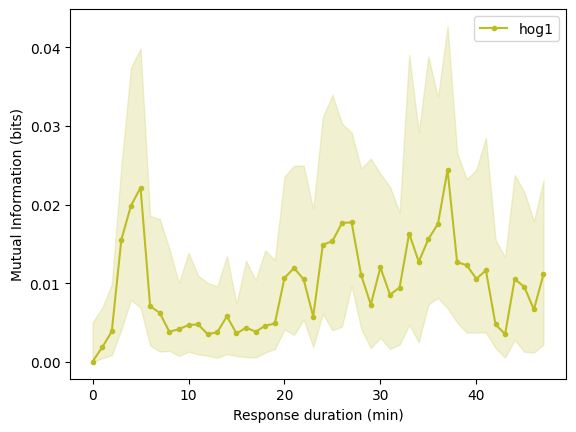

Processing transcription factor: yap1
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


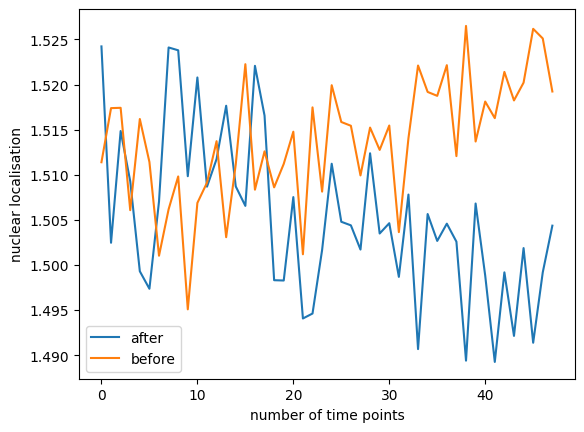

Best parameters for yap1: C=10.0, gamma=0.1
Time taken to estimate MI for yap1: 59.36 seconds


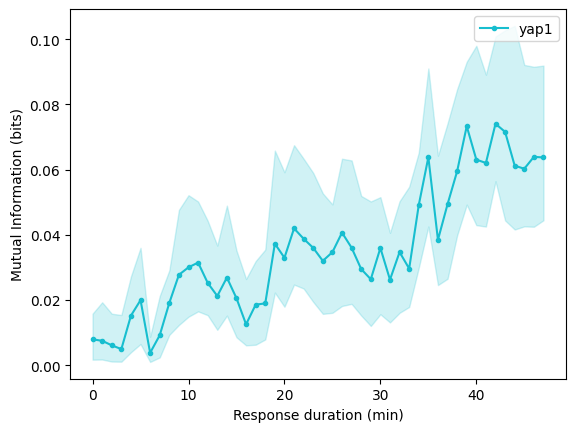

In [ ]:
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from wela.MIdecoding import estimate_MI, plot_MI
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
import time

# Load data and define parameters
fname = "./DS_10283_2901/fig2_stress_type_expts.json"
transcription_factors = ["mig1", "mig2", "msn2", "msn4", "dot6", "sfp1", "maf1", "tod6", "hog1", "yap1"]
stress = "gluc"
param_grid = {
    'C': np.logspace(-2, 2, 5),
    'gamma': np.logspace(-2, 2, 5)
}

try:
    with open(fname, "r") as f:
        expts = json.load(f)

    # plt.figure()

    # Loop through each transcription factor and find optimal SVM parameters
    for transcription_factor in transcription_factors:
        print(f"Processing transcription factor: {transcription_factor}")
        
        # Load data for the transcription factor
        data = np.array(expts[transcription_factor][stress]["GFP"]["nucLoc"]).astype("float")
        t = np.array(expts[transcription_factor][stress]["general"]["times"]).astype("float")
        b_data = data[:, t[0, :] < 0]
        a_data = data[:, t[0, :] >= 0]
        minlen = np.min([b_data.shape[1], a_data.shape[1]])
        b_data = b_data[:, -minlen:]
        a_data = a_data[:, :minlen]

        print(f"Number of NaN for a_data is {np.sum(np.isnan(a_data))}")
        print(f"Number of NaN for b_data is {np.sum(np.isnan(b_data))}")
        print("Filling NaN...\n")
        
        ### Impute missing values using 
        ''' 
        1) Forward and backward filling to fill gaps at the beginning or end of the series. 
        2) Interpolation fills in missing values based on neighbouring data.
        '''
        a_data = pd.DataFrame(a_data).fillna(method='ffill', axis=1).fillna(method='bfill', axis=1).interpolate(axis=1).to_numpy()
        b_data = pd.DataFrame(b_data).fillna(method='ffill', axis=1).fillna(method='bfill', axis=1).interpolate(axis=1).to_numpy()
        
        print(f"Number of nan for a_data after filling NaN is {np.sum(np.isnan(a_data))}")
        print(f"Number of nan for b_data after filling NaN is {np.sum(np.isnan(b_data))}")
        
        # plot means
        plt.figure()
        plt.plot(np.mean(a_data, axis=0), label="after")
        plt.plot(np.mean(b_data, axis=0), label="before")
        plt.xlabel("number of time points")
        plt.ylabel("nuclear localisation")
        plt.legend()
        plt.show(block=False)

        # Prepare data for SVM tuning
        X = np.concatenate((b_data, a_data), axis=1).T  # Transpose for (samples, features) shape
        y = np.array([0] * b_data.shape[1] + [1] * a_data.shape[1])

        # Grid search for best SVM parameters
        svc = SVC()
        grid_search = GridSearchCV(svc, param_grid, cv=3, n_jobs=-1, scoring='accuracy')
        grid_search.fit(X, y)
        
        best_params = grid_search.best_params_
        print(f"Best parameters for {transcription_factor}: C={best_params['C']}, gamma={best_params['gamma']}")

        # Time the MI estimation
        start_time = time.time()
        res = estimate_MI([b_data, a_data], verbose=False, overtime=True,
                          Crange=[best_params['C']],
                          gammarange=[best_params['gamma']])
        end_time = time.time()
        estimation_time = end_time - start_time
        print(f"Time taken to estimate MI for {transcription_factor}: {estimation_time:.2f} seconds")
        
        # Plot MI result for each transcription factor
        plt.figure()
        plot_MI(res, label=transcription_factor, color=plt.cm.tab10(transcription_factors.index(transcription_factor) % 10))
        # Customize plot
        plt.xlabel("Response duration (min)")
        plt.ylabel("Mutual Information (bits)")
        plt.legend(loc="best")
        plt.show(block=False)

except FileNotFoundError:
    print("You need to download test data")
    print(f"\t{fname}")
    print("from https://doi.org/10.1073/pnas.1716659115")

### To compare before and after filling NaNs
The combination of back/forward filling and interpolation fill seems to resolve NaN value issues, so let's compare by plotting the time series before and after imputation. 

It seems that mig1, dot6 and maf1 are the ones that have more than 1 NaN values, which caused issues before fillNa.

Processing transcription factor: mig1
Number of NaN for a_data is 1
Number of NaN for b_data is 5
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


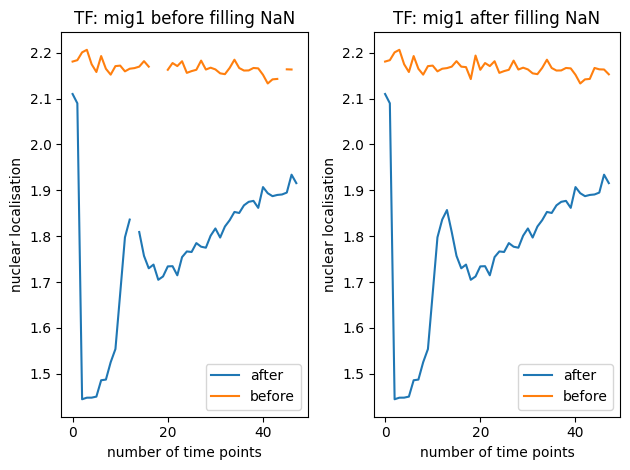

Processing transcription factor: mig2
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


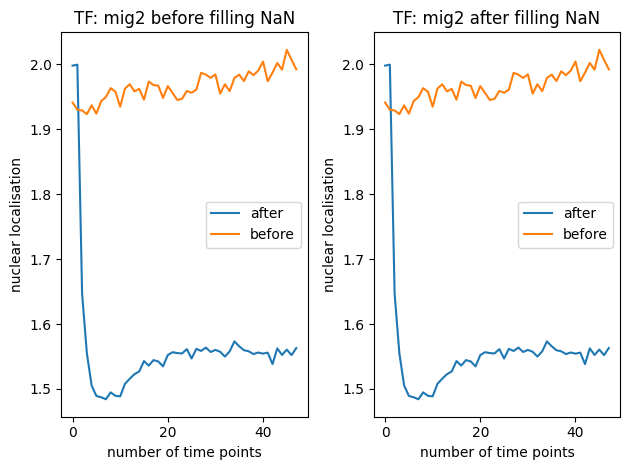

Processing transcription factor: msn2
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


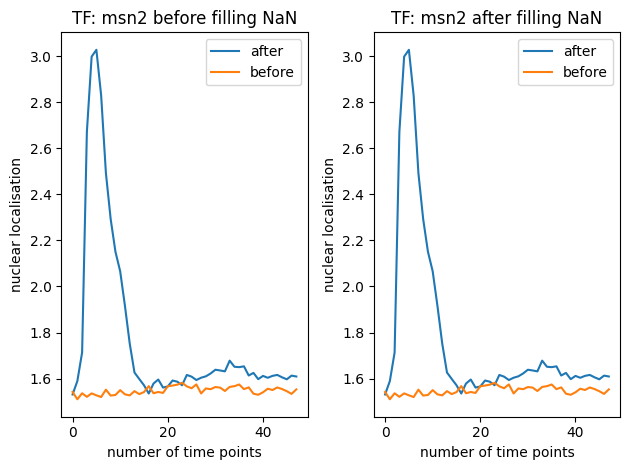

Processing transcription factor: msn4
Number of NaN for a_data is 0
Number of NaN for b_data is 1
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


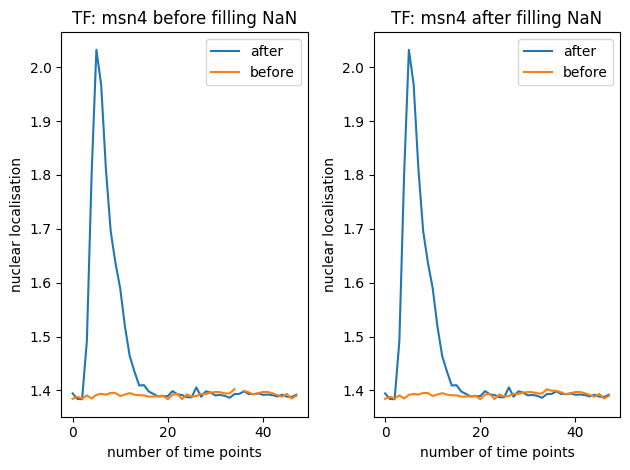

Processing transcription factor: dot6
Number of NaN for a_data is 0
Number of NaN for b_data is 10
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


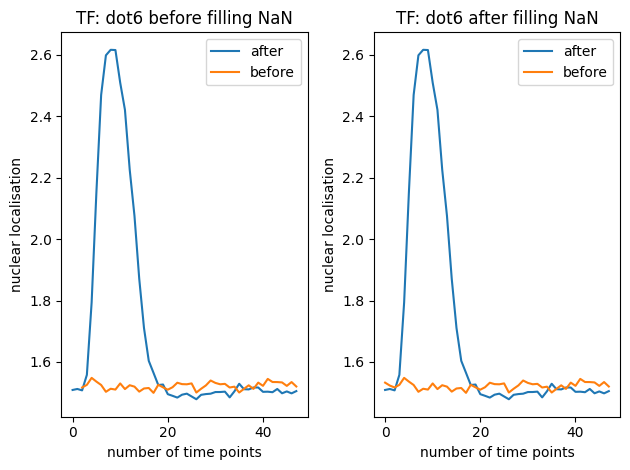

Processing transcription factor: sfp1
Number of NaN for a_data is 0
Number of NaN for b_data is 1
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


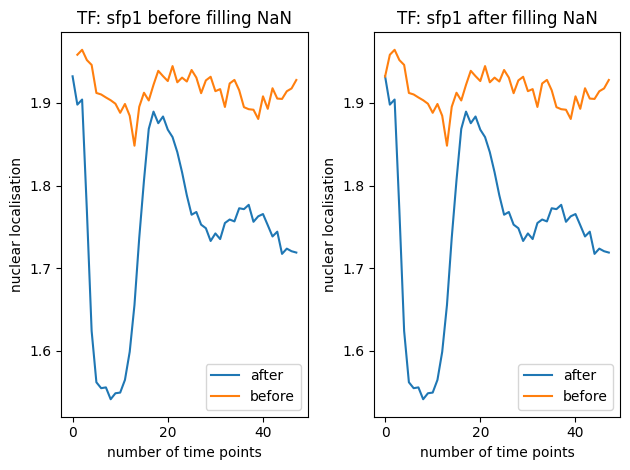

Processing transcription factor: maf1
Number of NaN for a_data is 0
Number of NaN for b_data is 4
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


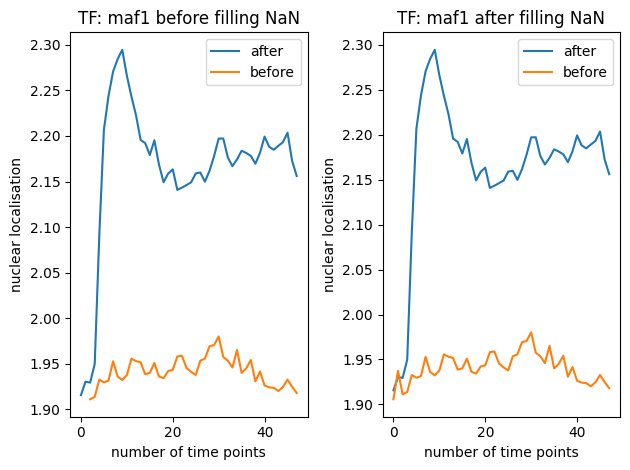

Processing transcription factor: tod6
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


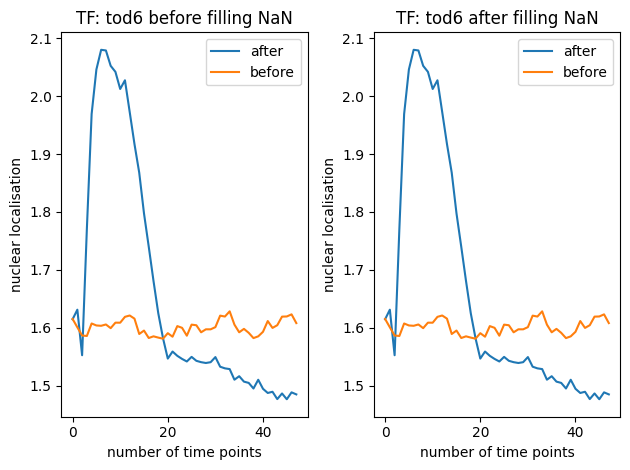

Processing transcription factor: hog1
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


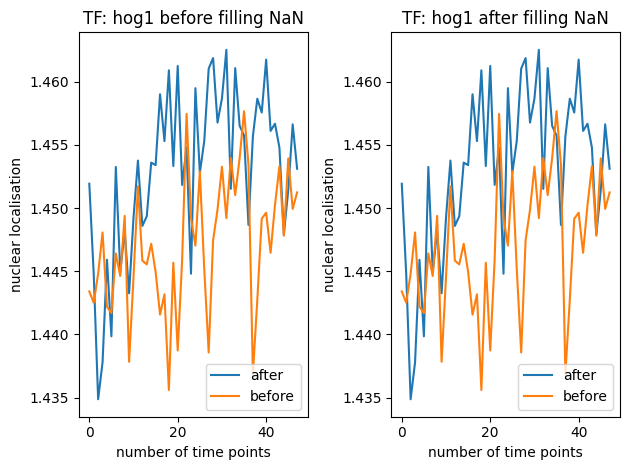

Processing transcription factor: yap1
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


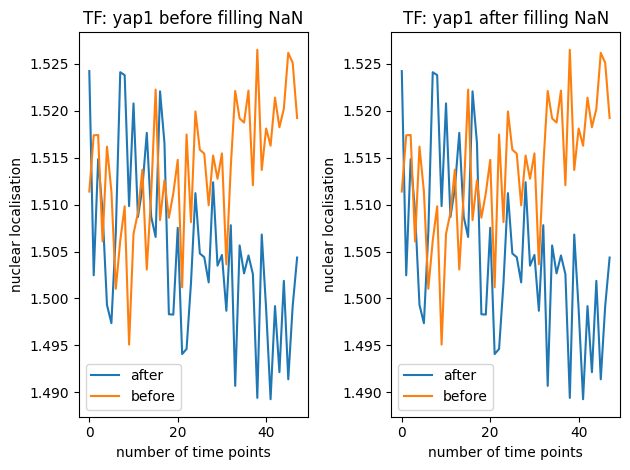

Best parameters for mig1: C=1.0, gamma=0.01
Time taken to estimate MI for mig1: 57.41 seconds
Best parameters for mig2: C=0.01, gamma=0.01
Time taken to estimate MI for mig2: 41.24 seconds
Best parameters for msn2: C=100.0, gamma=0.01
Time taken to estimate MI for msn2: 49.39 seconds
Best parameters for msn4: C=1.0, gamma=1.0
Time taken to estimate MI for msn4: 52.06 seconds
Best parameters for dot6: C=1.0, gamma=1.0
Time taken to estimate MI for dot6: 46.68 seconds
Best parameters for sfp1: C=0.01, gamma=0.1
Time taken to estimate MI for sfp1: 40.85 seconds
Best parameters for maf1: C=0.01, gamma=0.01
Time taken to estimate MI for maf1: 68.00 seconds
Best parameters for tod6: C=10.0, gamma=0.01
Time taken to estimate MI for tod6: 59.46 seconds
Best parameters for hog1: C=1.0, gamma=1.0
Time taken to estimate MI for hog1: 60.36 seconds
Best parameters for yap1: C=10.0, gamma=0.1
Time taken to estimate MI for yap1: 59.46 seconds


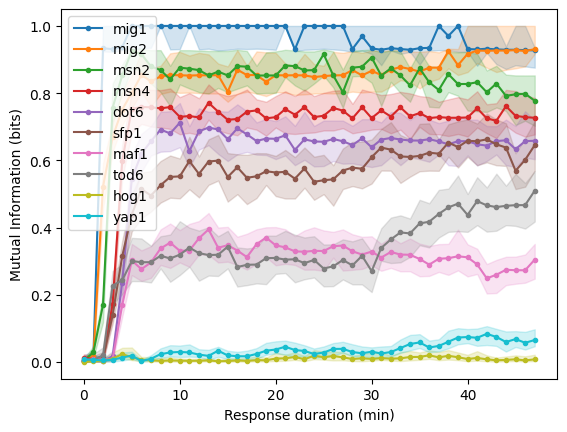

In [ ]:
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from wela.MIdecoding import estimate_MI, plot_MI
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
import time

# Load data and define parameters
fname = "./DS_10283_2901/fig2_stress_type_expts.json"
transcription_factors = ["mig1", "mig2", "msn2", "msn4", "dot6", "sfp1", "maf1", "tod6", "hog1", "yap1"]
stress = "gluc"
param_grid = {
    'C': np.logspace(-2, 2, 5),
    'gamma': np.logspace(-2, 2, 5)
}

try:
    with open(fname, "r") as f:
        expts = json.load(f)

    b_data_all = []
    a_data_all = []
    # Loop through each transcription factor and plot means before and after filling NaN
    for transcription_factor in transcription_factors:
        print(f"Processing transcription factor: {transcription_factor}")
        
        # Load data for the transcription factor
        data = np.array(expts[transcription_factor][stress]["GFP"]["nucLoc"]).astype("float")
        t = np.array(expts[transcription_factor][stress]["general"]["times"]).astype("float")
        b_data = data[:, t[0, :] < 0]
        a_data = data[:, t[0, :] >= 0]
        minlen = np.min([b_data.shape[1], a_data.shape[1]])
        b_data = b_data[:, -minlen:]
        a_data = a_data[:, :minlen]

        print(f"Number of NaN for a_data is {np.sum(np.isnan(a_data))}")
        print(f"Number of NaN for b_data is {np.sum(np.isnan(b_data))}")
        
        fig = plt.figure()
        # plot means before filling NaN
        plt.subplot(1, 2, 1)
        plt.plot(np.mean(a_data, axis=0), label="after")
        plt.plot(np.mean(b_data, axis=0), label="before")
        plt.xlabel("number of time points")
        plt.ylabel("nuclear localisation")
        plt.title(f"TF: {transcription_factor} before filling NaN")
        plt.legend()

        # Impute missing values using 1) Forward and backward filling to fill gaps at the beginning or end of the series. 2) Interpolation fills in missing values based on neighbouring data. 
        print("Filling NaN...\n")
        a_data = pd.DataFrame(a_data).fillna(method='ffill', axis=1).fillna(method='bfill', axis=1).interpolate(axis=1).to_numpy()
        b_data = pd.DataFrame(b_data).fillna(method='ffill', axis=1).fillna(method='bfill', axis=1).interpolate(axis=1).to_numpy()
        print(f"Number of nan for a_data after filling NaN is {np.sum(np.isnan(a_data))}")
        print(f"Number of nan for b_data after filling NaN is {np.sum(np.isnan(b_data))}")

        # append data so that it can be used for MI estimation in the next step
        b_data_all.append(b_data)
        a_data_all.append(a_data)
        
        # plot means after filling NaN
        plt.subplot(1, 2, 2)
        plt.plot(np.mean(a_data, axis=0), label="after")
        plt.plot(np.mean(b_data, axis=0), label="before")
        plt.xlabel("number of time points")
        plt.ylabel("nuclear localisation")
        plt.title(f"TF: {transcription_factor} after filling NaN")
        plt.legend()
        plt.tight_layout()
        plt.show(block=False)

    plt.figure()
    # Loop through each transcription factor and find optimal SVM parameters
    for transcription_factor, b_data, a_data in zip(transcription_factors, b_data_all, a_data_all):
        # Prepare data for SVM tuning
        X = np.concatenate((b_data, a_data), axis=1).T  # Transpose for (samples, features) shape
        y = np.array([0] * b_data.shape[1] + [1] * a_data.shape[1])

        # Grid search for best SVM parameters
        svc = SVC()
        grid_search = GridSearchCV(svc, param_grid, cv=3, n_jobs=-1, scoring='accuracy')
        grid_search.fit(X, y)
        
        best_params = grid_search.best_params_
        print(f"Best parameters for {transcription_factor}: C={best_params['C']}, gamma={best_params['gamma']}")

        # Time the MI estimation
        start_time = time.time()
        res = estimate_MI([b_data, a_data], verbose=False, overtime=True,
                          Crange=[best_params['C']],
                          gammarange=[best_params['gamma']])
        end_time = time.time()
        estimation_time = end_time - start_time
        print(f"Time taken to estimate MI for {transcription_factor}: {estimation_time:.2f} seconds")
        
        # Plot MI result for each transcription factor
        plot_MI(res, label=transcription_factor, color=plt.cm.tab10(transcription_factors.index(transcription_factor) % 10))

    # Customize plot
    plt.xlabel("Response duration (min)")
    plt.ylabel("Mutual Information (bits)")
    plt.legend(loc="best")
    plt.show(block=False)

except FileNotFoundError:
    print("You need to download test data")
    print(f"\t{fname}")
    print("from https://doi.org/10.1073/pnas.1716659115")

## Imputation: Linear Regression

Processing transcription factor: mig1
Number of NaN for a_data is 1
Number of NaN for b_data is 5
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


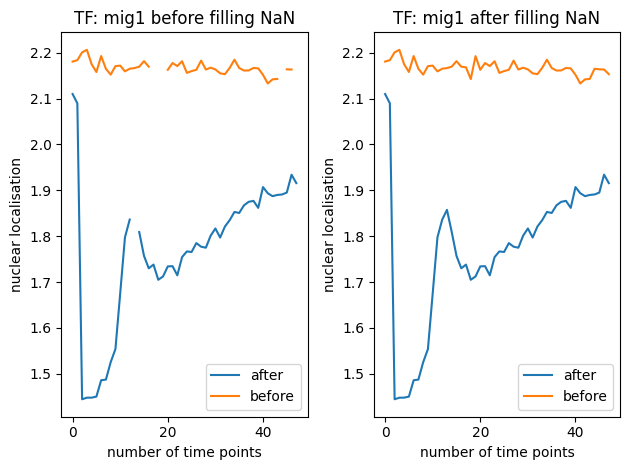

Processing transcription factor: mig2
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


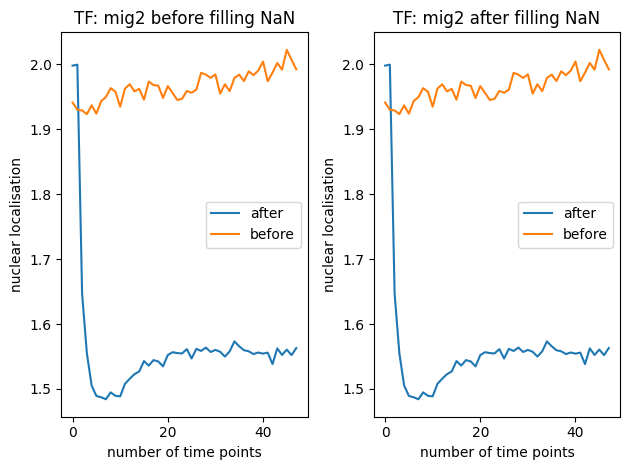

Processing transcription factor: msn2
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


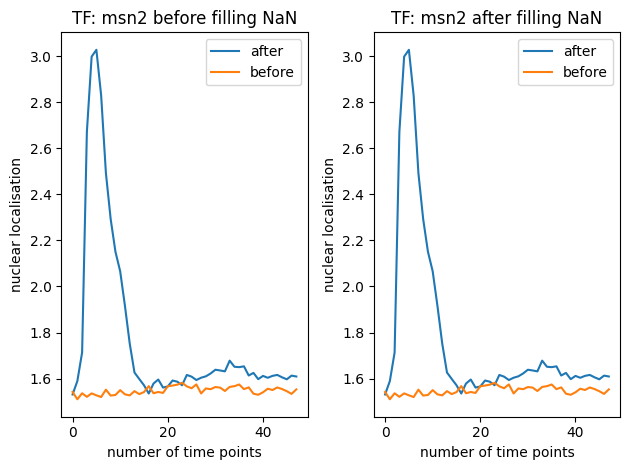

Processing transcription factor: msn4
Number of NaN for a_data is 0
Number of NaN for b_data is 1
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


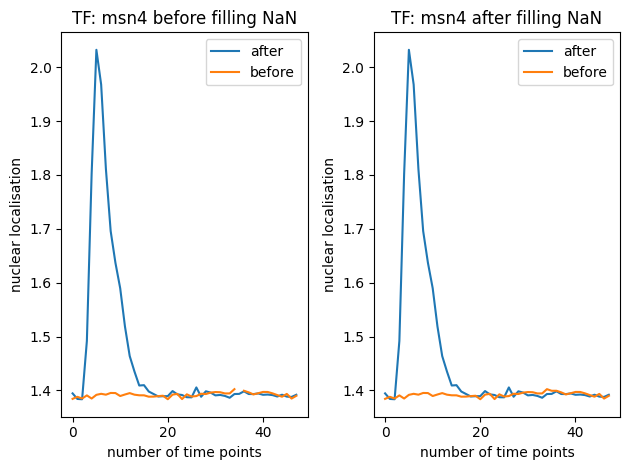

Processing transcription factor: dot6
Number of NaN for a_data is 0
Number of NaN for b_data is 10
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


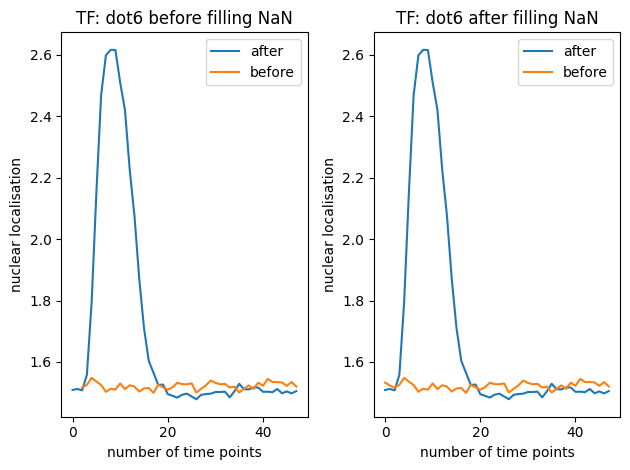

Processing transcription factor: sfp1
Number of NaN for a_data is 0
Number of NaN for b_data is 1
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


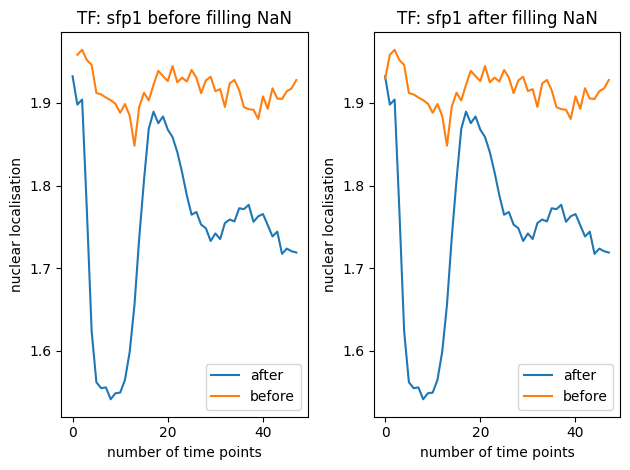

Processing transcription factor: maf1
Number of NaN for a_data is 0
Number of NaN for b_data is 4
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


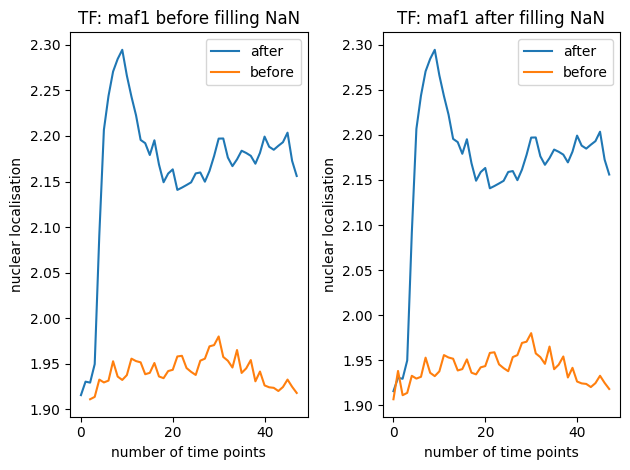

Processing transcription factor: tod6
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


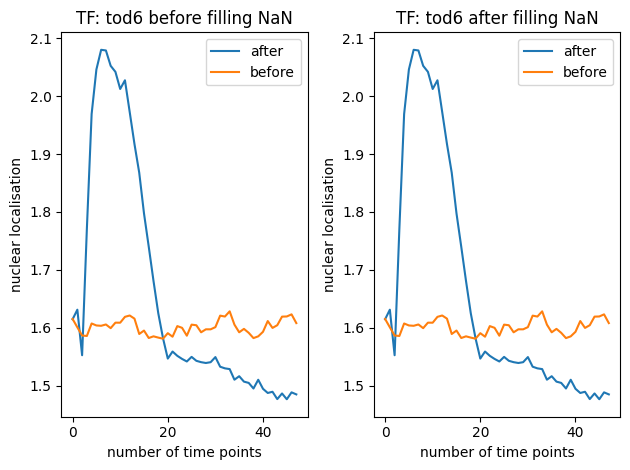

Processing transcription factor: hog1
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


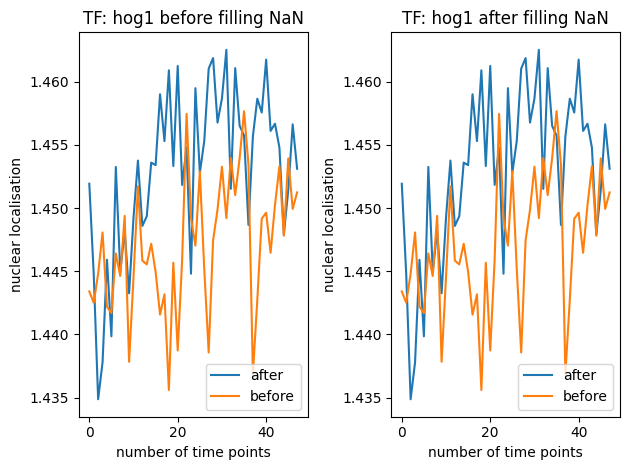

Processing transcription factor: yap1
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


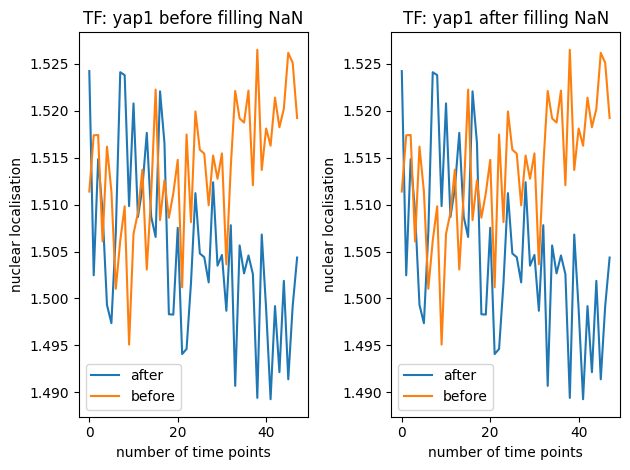

Best parameters for mig1: C=1.0, gamma=0.01
Time taken to estimate MI for mig1: 36.00 seconds
Best parameters for mig2: C=0.01, gamma=0.01
Time taken to estimate MI for mig2: 28.96 seconds
Best parameters for msn2: C=100.0, gamma=0.01
Time taken to estimate MI for msn2: 33.49 seconds
Best parameters for msn4: C=1.0, gamma=1.0
Time taken to estimate MI for msn4: 31.38 seconds
Best parameters for dot6: C=1.0, gamma=1.0
Time taken to estimate MI for dot6: 31.98 seconds
Best parameters for sfp1: C=0.01, gamma=0.1
Time taken to estimate MI for sfp1: 28.14 seconds
Best parameters for maf1: C=0.01, gamma=0.01
Time taken to estimate MI for maf1: 44.49 seconds
Best parameters for tod6: C=10.0, gamma=0.01
Time taken to estimate MI for tod6: 30.55 seconds
Best parameters for hog1: C=1.0, gamma=1.0
Time taken to estimate MI for hog1: 61.22 seconds
Best parameters for yap1: C=10.0, gamma=0.1
Time taken to estimate MI for yap1: 59.71 seconds


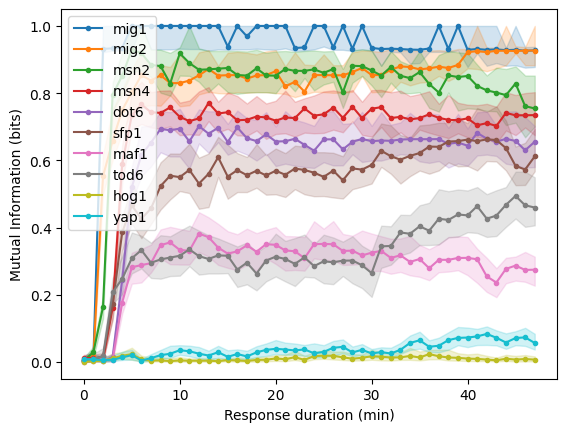

In [ ]:
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from wela.MIdecoding import estimate_MI, plot_MI
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.linear_model import LinearRegression
import time

# Load data and define parameters
fname = "./DS_10283_2901/fig2_stress_type_expts.json"
transcription_factors = ["mig1", "mig2", "msn2", "msn4", "dot6", "sfp1", "maf1", "tod6", "hog1", "yap1"]
stress = "gluc"
param_grid = {
    'C': np.logspace(-2, 2, 5),
    'gamma': np.logspace(-2, 2, 5)
}

def linear_regression_impute(data):
    """Impute missing values using linear regression for each time series (row)."""
    data_df = pd.DataFrame(data)
    for index, row in data_df.iterrows():
        # Identify the indices with and without NaNs
        nan_mask = row.isnull()
        non_nan_mask = ~nan_mask
        
        if nan_mask.sum() > 0:  # Proceed if there are any NaNs to fill
            # Use non-NaN points to train the model
            X_train = np.arange(len(row))[non_nan_mask].reshape(-1, 1)
            y_train = row[non_nan_mask]
            
            # Train the linear regression model
            model = LinearRegression()
            model.fit(X_train, y_train)
            
            # Predict NaN points
            X_predict = np.arange(len(row))[nan_mask].reshape(-1, 1)
            row[nan_mask] = model.predict(X_predict)
            
            # Update the row in the DataFrame
            data_df.iloc[index] = row
            
    return data_df.to_numpy()

try:
    with open(fname, "r") as f:
        expts = json.load(f)

    b_data_all = []
    a_data_all = []
    # Loop through each transcription factor and plot means before and after filling NaN
    for transcription_factor in transcription_factors:
        print(f"Processing transcription factor: {transcription_factor}")
        
        # Load data for the transcription factor
        data = np.array(expts[transcription_factor][stress]["GFP"]["nucLoc"]).astype("float")
        t = np.array(expts[transcription_factor][stress]["general"]["times"]).astype("float")
        b_data = data[:, t[0, :] < 0]
        a_data = data[:, t[0, :] >= 0]
        minlen = np.min([b_data.shape[1], a_data.shape[1]])
        b_data = b_data[:, -minlen:]
        a_data = a_data[:, :minlen]

        print(f"Number of NaN for a_data is {np.sum(np.isnan(a_data))}")
        print(f"Number of NaN for b_data is {np.sum(np.isnan(b_data))}")
        
        fig = plt.figure()
        # plot means before filling NaN
        plt.subplot(1, 2, 1)
        plt.plot(np.mean(a_data, axis=0), label="after")
        plt.plot(np.mean(b_data, axis=0), label="before")
        plt.xlabel("number of time points")
        plt.ylabel("nuclear localisation")
        plt.title(f"TF: {transcription_factor} before filling NaN")
        plt.legend()

        print("Filling NaN...\n")
        
        # Impute missing values using lnear regression
        a_data = linear_regression_impute(a_data)
        b_data = linear_regression_impute(b_data)
        
        print(f"Number of nan for a_data after filling NaN is {np.sum(np.isnan(a_data))}")
        print(f"Number of nan for b_data after filling NaN is {np.sum(np.isnan(b_data))}")

        # append data so that it can be used for MI estimation in the next step
        b_data_all.append(b_data)
        a_data_all.append(a_data)
        
        # plot means after filling NaN
        plt.subplot(1, 2, 2)
        plt.plot(np.mean(a_data, axis=0), label="after")
        plt.plot(np.mean(b_data, axis=0), label="before")
        plt.xlabel("number of time points")
        plt.ylabel("nuclear localisation")
        plt.title(f"TF: {transcription_factor} after filling NaN")
        plt.legend()
        plt.tight_layout()
        plt.show(block=False)

    plt.figure()
    # Loop through each transcription factor and find optimal SVM parameters
    for transcription_factor, b_data, a_data in zip(transcription_factors, b_data_all, a_data_all):
        # Prepare data for SVM tuning
        X = np.concatenate((b_data, a_data), axis=1).T  # Transpose for (samples, features) shape
        y = np.array([0] * b_data.shape[1] + [1] * a_data.shape[1])

        # Grid search for best SVM parameters
        svc = SVC()
        grid_search = GridSearchCV(svc, param_grid, cv=3, n_jobs=-1, scoring='accuracy')
        grid_search.fit(X, y)
        
        best_params = grid_search.best_params_
        print(f"Best parameters for {transcription_factor}: C={best_params['C']}, gamma={best_params['gamma']}")

        # Time the MI estimation
        start_time = time.time()
        res = estimate_MI([b_data, a_data], verbose=False, overtime=True,
                          Crange=[best_params['C']],
                          gammarange=[best_params['gamma']])
        end_time = time.time()
        estimation_time = end_time - start_time
        print(f"Time taken to estimate MI for {transcription_factor}: {estimation_time:.2f} seconds")
        
        # Plot MI result for each transcription factor
        plot_MI(res, label=transcription_factor, color=plt.cm.tab10(transcription_factors.index(transcription_factor) % 10))

    # Customize plot
    plt.xlabel("Response duration (min)")
    plt.ylabel("Mutual Information (bits)")
    plt.legend(loc="best")
    plt.show(block=False)

except FileNotFoundError:
    print("You need to download test data")
    print(f"\t{fname}")
    print("from https://doi.org/10.1073/pnas.1716659115")

## Imputation: Multivariate imputation using the ``IterativeImputer`` class

[IterativeImputer](https://scikit-learn.org/stable/modules/generated/sklearn.impute.IterativeImputer.html#sklearn.impute.IterativeImputer) is a multivariate imputer that estimates each feature from all the others.

A strategy for imputing missing values by modeling each feature with missing values as a function of other features in a round-robin fashion.

Processing transcription factor: mig1
Number of NaN for a_data is 1
Number of NaN for b_data is 5
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


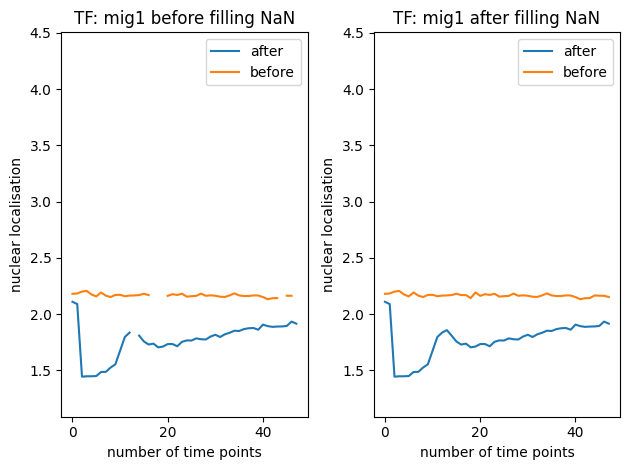

Processing transcription factor: mig2
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


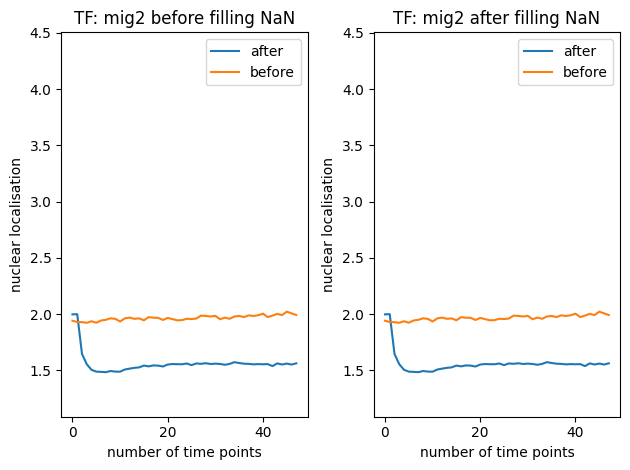

Processing transcription factor: msn2
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


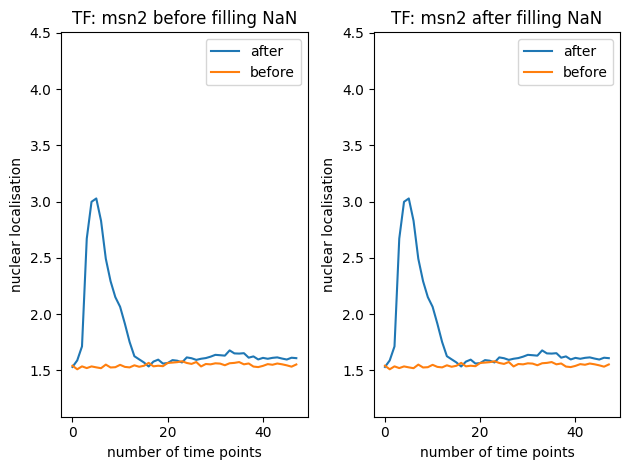

Processing transcription factor: msn4
Number of NaN for a_data is 0
Number of NaN for b_data is 1
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


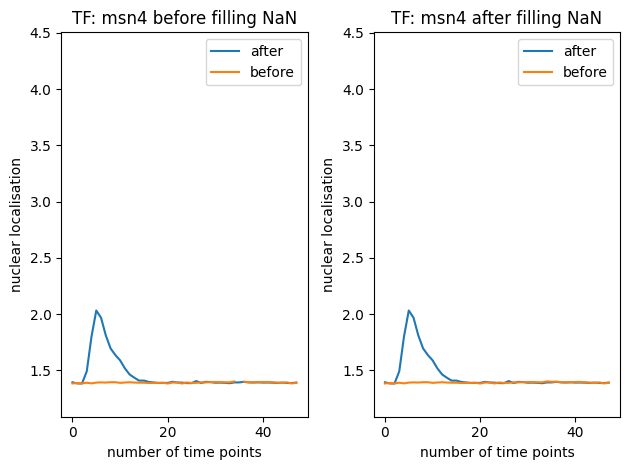

Processing transcription factor: dot6
Number of NaN for a_data is 0
Number of NaN for b_data is 10
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


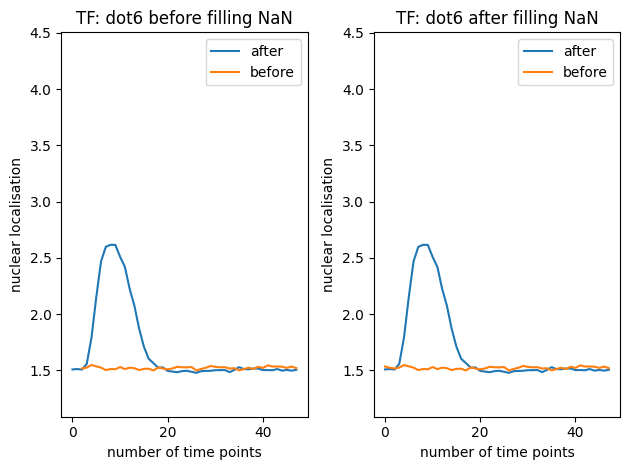

Processing transcription factor: sfp1
Number of NaN for a_data is 0
Number of NaN for b_data is 1
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


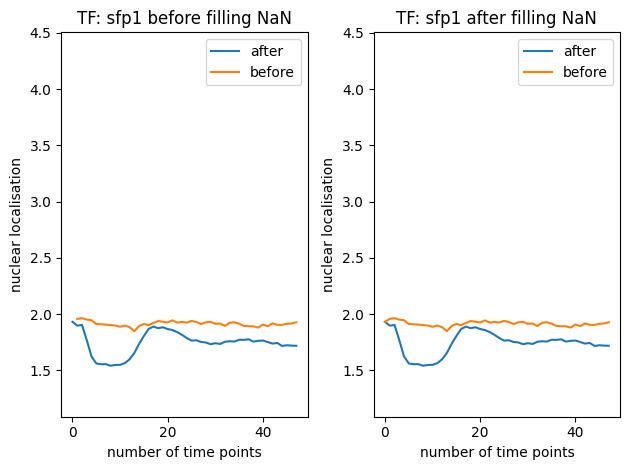

Processing transcription factor: maf1
Number of NaN for a_data is 0
Number of NaN for b_data is 4
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


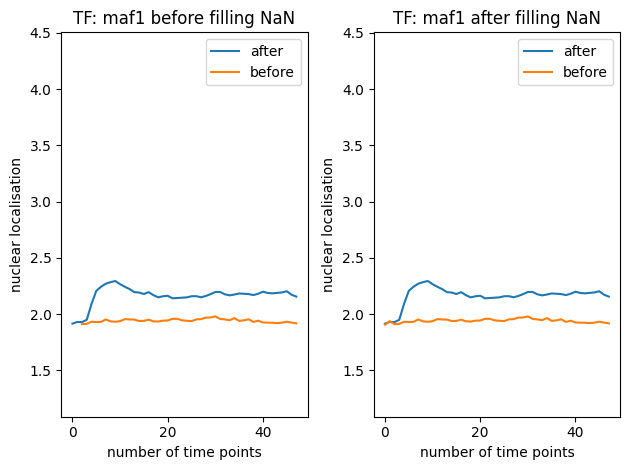

Processing transcription factor: tod6
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


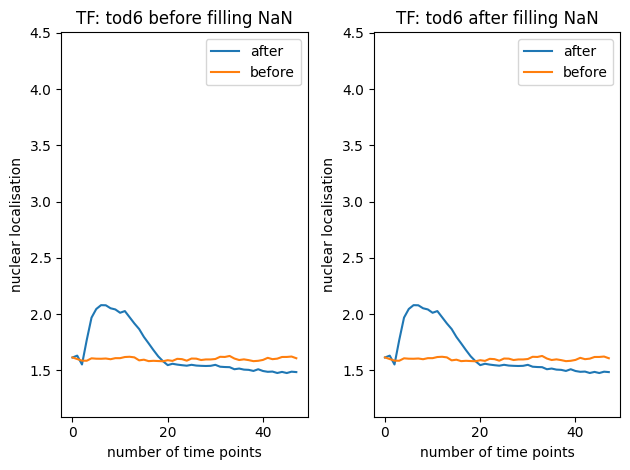

Processing transcription factor: hog1
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


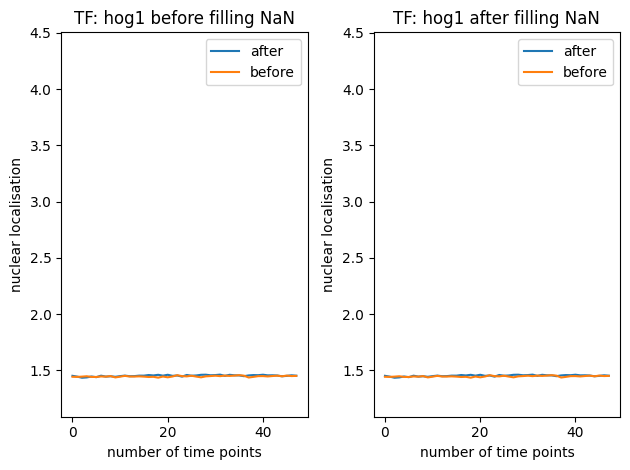

Processing transcription factor: yap1
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


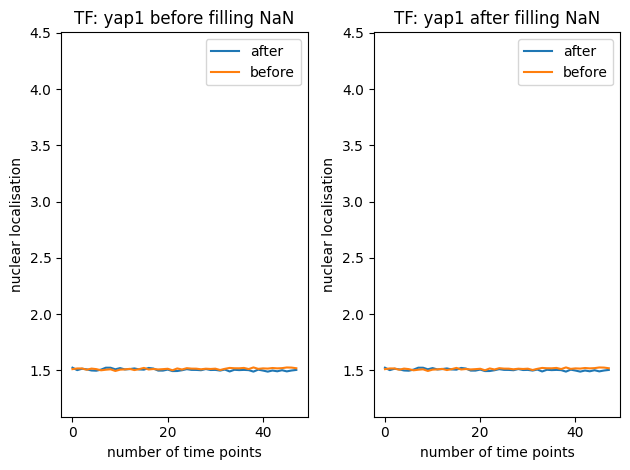

Best parameters for mig1: C=1.0, gamma=0.01
Time taken to estimate MI for mig1: 37.21 seconds
Best parameters for mig2: C=0.01, gamma=0.01
Time taken to estimate MI for mig2: 27.31 seconds
Best parameters for msn2: C=100.0, gamma=0.01
Time taken to estimate MI for msn2: 32.88 seconds
Best parameters for msn4: C=1.0, gamma=1.0
Time taken to estimate MI for msn4: 30.72 seconds
Best parameters for dot6: C=1.0, gamma=1.0
Time taken to estimate MI for dot6: 31.93 seconds
Best parameters for sfp1: C=0.01, gamma=0.1
Time taken to estimate MI for sfp1: 27.80 seconds
Best parameters for maf1: C=0.01, gamma=0.01
Time taken to estimate MI for maf1: 44.85 seconds
Best parameters for tod6: C=10.0, gamma=0.01
Time taken to estimate MI for tod6: 30.81 seconds
Best parameters for hog1: C=1.0, gamma=1.0
Time taken to estimate MI for hog1: 61.35 seconds
Best parameters for yap1: C=10.0, gamma=0.1
Time taken to estimate MI for yap1: 59.53 seconds


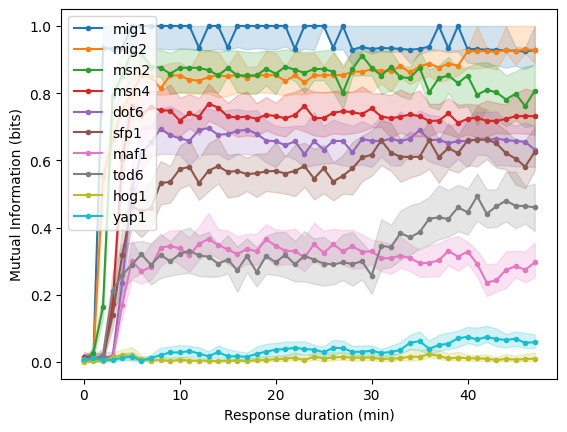

In [19]:
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from wela.MIdecoding import estimate_MI, plot_MI
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import time

# Load data and define parameters
fname = "./DS_10283_2901/fig2_stress_type_expts.json"
transcription_factors = ["mig1", "mig2", "msn2", "msn4", "dot6", "sfp1", "maf1", "tod6", "hog1", "yap1"]
stress = "gluc"
param_grid = {
    'C': np.logspace(-2, 2, 5),
    'gamma': np.logspace(-2, 2, 5)
}


# concatenate all the data so we can set ylim later 
b_data_all_w_nan = np.array([])
a_data_all_w_nan = np.array([])
with open(fname, "r") as f:
    expts = json.load(f)
for transcription_factor in transcription_factors:
    data = np.array(expts[transcription_factor][stress]["GFP"]["nucLoc"]).astype("float")
    t = np.array(expts[transcription_factor][stress]["general"]["times"]).astype("float")
    b_data = data[:, t[0, :] < 0]
    a_data = data[:, t[0, :] >= 0]
    minlen = np.min([b_data.shape[1], a_data.shape[1]])
    b_data = b_data[:, -minlen:]
    a_data = a_data[:, :minlen]
    # append data so that it can be used for setting ylim in the nan-containing data plot
    b_data_all_w_nan = np.concatenate((b_data_all_w_nan, b_data.flatten()))
    a_data_all_w_nan = np.concatenate((a_data_all_w_nan, a_data.flatten()))

try:
    with open(fname, "r") as f:
        expts = json.load(f)
        
    b_data_all = []
    a_data_all = []
    # Loop through each transcription factor and plot means before and after filling NaN
    for transcription_factor in transcription_factors:
        print(f"Processing transcription factor: {transcription_factor}")
        
        # Load data for the transcription factor
        data = np.array(expts[transcription_factor][stress]["GFP"]["nucLoc"]).astype("float")
        t = np.array(expts[transcription_factor][stress]["general"]["times"]).astype("float")
        b_data = data[:, t[0, :] < 0]
        a_data = data[:, t[0, :] >= 0]
        minlen = np.min([b_data.shape[1], a_data.shape[1]])
        b_data = b_data[:, -minlen:]
        a_data = a_data[:, :minlen]

        print(f"Number of NaN for a_data is {np.sum(np.isnan(a_data))}")
        print(f"Number of NaN for b_data is {np.sum(np.isnan(b_data))}")
        
        fig = plt.figure()
        # plot means before filling NaN
        plt.subplot(1, 2, 1)
        plt.plot(np.mean(a_data, axis=0), label="after")
        plt.plot(np.mean(b_data, axis=0), label="before")

        # create copies of a_data and b_data and dropna so we can set ylim without encountering errors
        a_data_all_w_nan_copy = a_data_all_w_nan.copy()
        b_data_all_w_nan_copy = b_data_all_w_nan.copy()
        a_data_all_w_nan_copy = a_data_all_w_nan_copy[~np.isnan(a_data_all_w_nan_copy)]
        b_data_all_w_nan_copy = b_data_all_w_nan_copy[~np.isnan(b_data_all_w_nan_copy)]
        plt.ylim(min(np.min(a_data_all_w_nan_copy), np.min(b_data_all_w_nan_copy)), max(np.max(a_data_all_w_nan_copy), np.max(b_data_all_w_nan_copy)))
        plt.xlabel("number of time points")
        plt.ylabel("nuclear localisation")
        plt.title(f"TF: {transcription_factor} before filling NaN")
        plt.legend()
         
        print("Filling NaN...\n")

        # Impute missing values using multivariate imputation
        imp_mean = IterativeImputer(random_state=0)
        a_data = imp_mean.fit_transform(a_data)
        b_data = imp_mean.fit_transform(b_data)

        print(f"Number of nan for a_data after filling NaN is {np.sum(np.isnan(a_data))}")
        print(f"Number of nan for b_data after filling NaN is {np.sum(np.isnan(b_data))}")

        # append so that filled-nan data can be used for MI estimation in the next step
        b_data_all.append(b_data)
        a_data_all.append(a_data)
        
        # plot means after filling NaN
        plt.subplot(1, 2, 2)
        plt.plot(np.mean(a_data, axis=0), label="after")
        plt.plot(np.mean(b_data, axis=0), label="before")
        plt.ylim(min(np.min(a_data_all_w_nan_copy), np.min(b_data_all_w_nan_copy)), max(np.max(a_data_all_w_nan_copy), np.max(b_data_all_w_nan_copy)))
        plt.xlabel("number of time points")
        plt.ylabel("nuclear localisation")
        plt.title(f"TF: {transcription_factor} after filling NaN")
        plt.legend()
        plt.tight_layout()
        plt.show(block=False)


#### plotting MI 
    plt.figure()
    # Loop through each transcription factor and find optimal SVM parameters
    for transcription_factor, b_data, a_data in zip(transcription_factors, b_data_all, a_data_all):
        # Prepare data for SVM tuning
        X = np.concatenate((b_data, a_data), axis=1).T  # Transpose for (samples, features) shape
        y = np.array([0] * b_data.shape[1] + [1] * a_data.shape[1])

        # Grid search for best SVM parameters
        svc = SVC()
        grid_search = GridSearchCV(svc, param_grid, cv=3, n_jobs=-1, scoring='accuracy')
        grid_search.fit(X, y)
        
        best_params = grid_search.best_params_
        print(f"Best parameters for {transcription_factor}: C={best_params['C']}, gamma={best_params['gamma']}")

        # Time the MI estimation
        start_time = time.time()
        res = estimate_MI([b_data, a_data], verbose=False, overtime=True,
                          Crange=[best_params['C']],
                          gammarange=[best_params['gamma']])
        end_time = time.time()
        estimation_time = end_time - start_time
        print(f"Time taken to estimate MI for {transcription_factor}: {estimation_time:.2f} seconds")
        
        # Plot MI result for each transcription factor
        plot_MI(res, label=transcription_factor, color=plt.cm.tab10(transcription_factors.index(transcription_factor) % 10))

    # Customize plot
    plt.xlabel("Response duration (min)")
    plt.ylabel("Mutual Information (bits)")
    plt.legend(loc="best")
    plt.show(block=False)

except FileNotFoundError:
    print("You need to download test data")
    print(f"\t{fname}")
    print("from https://doi.org/10.1073/pnas.1716659115")

## Imputation: Gaussian Process Model

[GaussianProcessRegressor](https://scikit-learn.org/stable/modules/generated/sklearn.gaussian_process.GaussianProcessRegressor.html)

Processing transcription factor: mig1
Number of NaN for a_data is 1
Number of NaN for b_data is 5
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


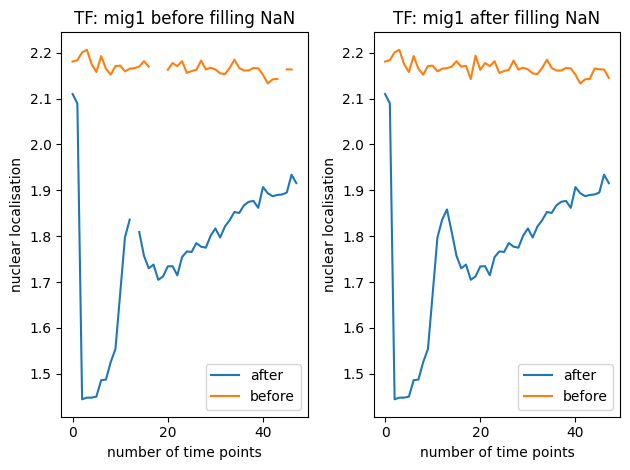

Processing transcription factor: mig2
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


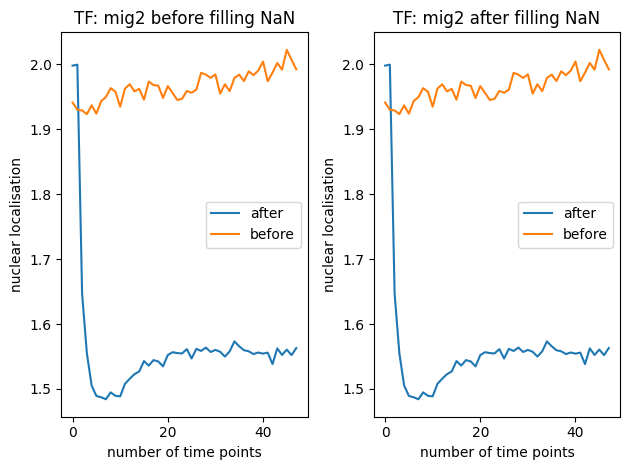

Processing transcription factor: msn2
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


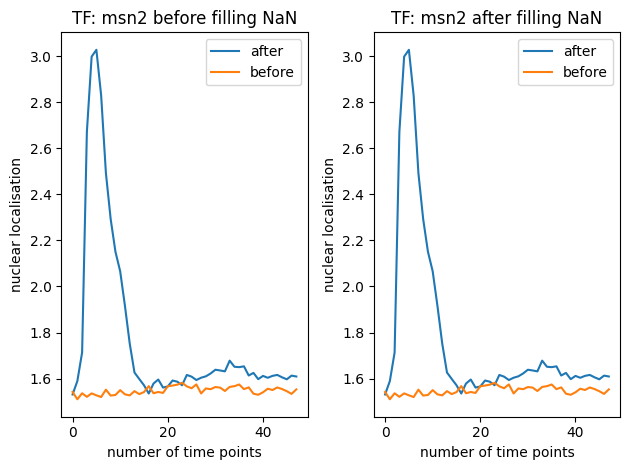

Processing transcription factor: msn4
Number of NaN for a_data is 0
Number of NaN for b_data is 1
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


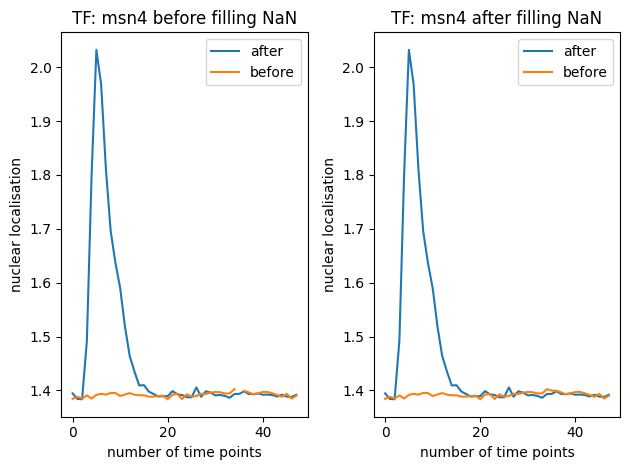

Processing transcription factor: dot6
Number of NaN for a_data is 0
Number of NaN for b_data is 10
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


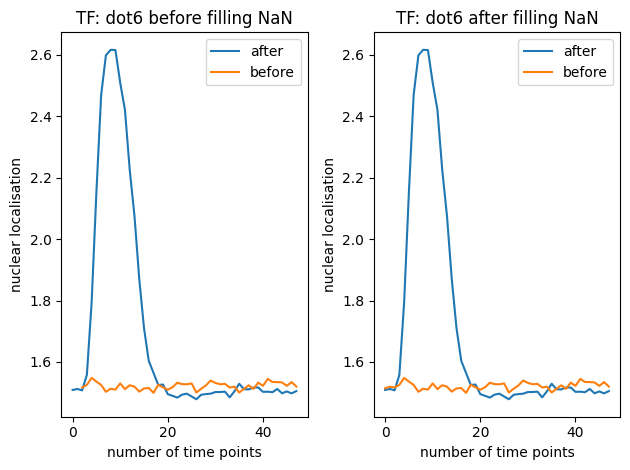

Processing transcription factor: sfp1
Number of NaN for a_data is 0
Number of NaN for b_data is 1
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


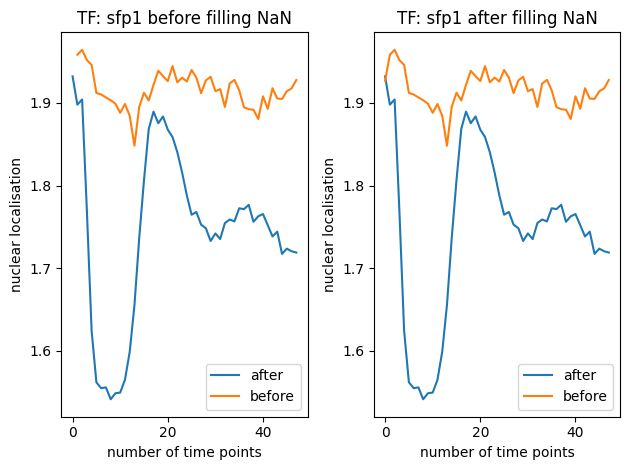

Processing transcription factor: maf1
Number of NaN for a_data is 0
Number of NaN for b_data is 4
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


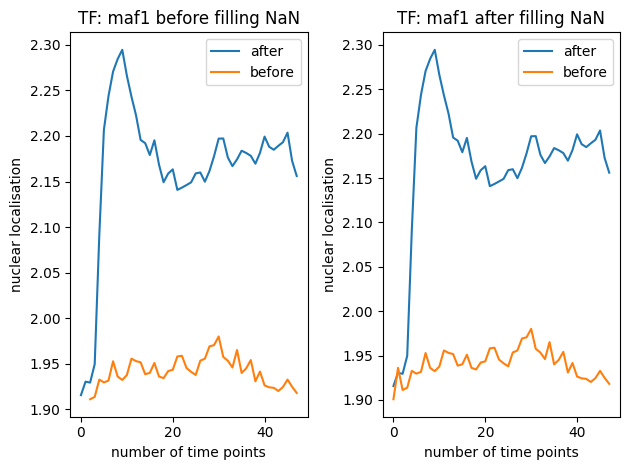

Processing transcription factor: tod6
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


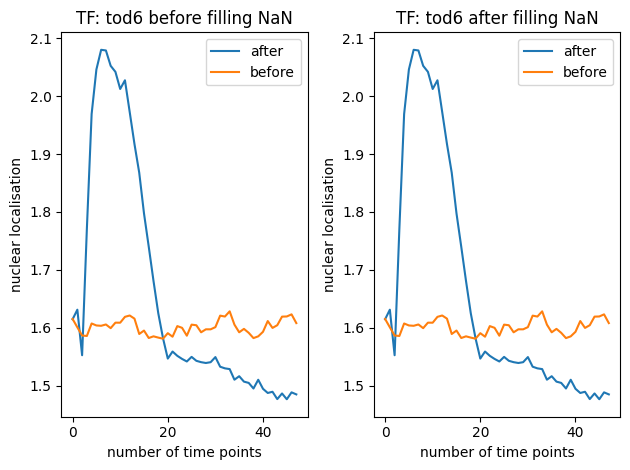

Processing transcription factor: hog1
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


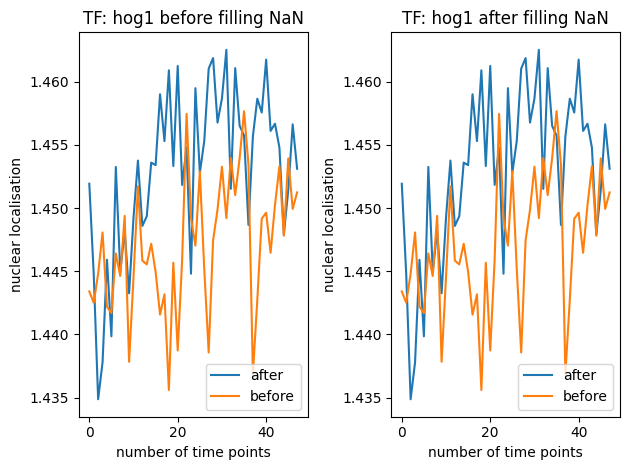

Processing transcription factor: yap1
Number of NaN for a_data is 0
Number of NaN for b_data is 0
Filling NaN...

Number of nan for a_data after filling NaN is 0
Number of nan for b_data after filling NaN is 0


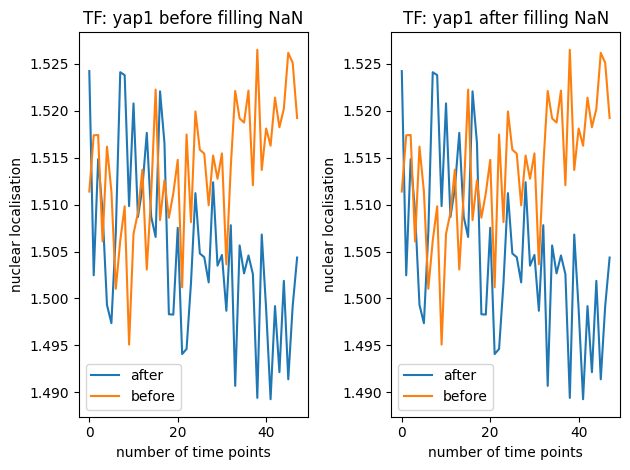

Best parameters for mig1: C=1.0, gamma=0.01
Time taken to estimate MI for mig1: 35.91 seconds
Best parameters for mig2: C=0.01, gamma=0.01
Time taken to estimate MI for mig2: 27.67 seconds
Best parameters for msn2: C=100.0, gamma=0.01
Time taken to estimate MI for msn2: 33.67 seconds
Best parameters for msn4: C=1.0, gamma=1.0
Time taken to estimate MI for msn4: 31.22 seconds
Best parameters for dot6: C=1.0, gamma=1.0
Time taken to estimate MI for dot6: 32.30 seconds
Best parameters for sfp1: C=0.01, gamma=0.1
Time taken to estimate MI for sfp1: 28.38 seconds
Best parameters for maf1: C=0.01, gamma=0.01
Time taken to estimate MI for maf1: 43.64 seconds
Best parameters for tod6: C=10.0, gamma=0.01
Time taken to estimate MI for tod6: 31.05 seconds
Best parameters for hog1: C=1.0, gamma=1.0
Time taken to estimate MI for hog1: 61.60 seconds
Best parameters for yap1: C=10.0, gamma=0.1
Time taken to estimate MI for yap1: 59.79 seconds


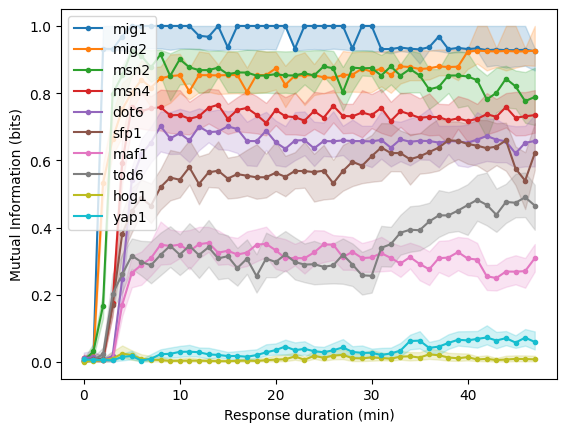

In [ ]:
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from wela.MIdecoding import estimate_MI, plot_MI
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
import time

# Load data and define parameters
fname = "./DS_10283_2901/fig2_stress_type_expts.json"
transcription_factors = ["mig1", "mig2", "msn2", "msn4", "dot6", "sfp1", "maf1", "tod6", "hog1", "yap1"]
stress = "gluc"
param_grid = {
    'C': np.logspace(-2, 2, 5),
    'gamma': np.logspace(-2, 2, 5)
}

def gaussian_process_impute(data):
    """Impute missing values using a Gaussian Process for each time series (row)."""
    data_df = pd.DataFrame(data)
    for index, row in data_df.iterrows():
        # Identify indices with and without NaNs
        nan_mask = row.isnull()
        non_nan_mask = ~nan_mask
        
        if nan_mask.sum() > 0:  # Proceed if there are any NaNs to fill
            # Use non-NaN points for training
            X_train = np.arange(len(row))[non_nan_mask].reshape(-1, 1)
            y_train = row[non_nan_mask].values
            
            # Define the kernel: Constant * RBF kernel
            kernel = C(1.0, (1e-3, 1e3)) * RBF(1.0, (1e-2, 1e2))
            gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10)
            
            # Fit the model
            gp.fit(X_train, y_train)
            
            # Predict NaN points
            X_predict = np.arange(len(row))[nan_mask].reshape(-1, 1)
            y_pred, sigma = gp.predict(X_predict, return_std=True)
            row[nan_mask] = y_pred
            
            # Update the row in the DataFrame
            data_df.iloc[index] = row
            
    return data_df.to_numpy()

# concatenate all the data so we can set ylim later 
b_data_all_w_nan = np.array([])
a_data_all_w_nan = np.array([])
with open(fname, "r") as f:
    expts = json.load(f)
for transcription_factor in transcription_factors:
    data = np.array(expts[transcription_factor][stress]["GFP"]["nucLoc"]).astype("float")
    t = np.array(expts[transcription_factor][stress]["general"]["times"]).astype("float")
    b_data = data[:, t[0, :] < 0]
    a_data = data[:, t[0, :] >= 0]
    minlen = np.min([b_data.shape[1], a_data.shape[1]])
    b_data = b_data[:, -minlen:]
    a_data = a_data[:, :minlen]
    # append data so that it can be used for setting ylim in the nan-containing data plot
    b_data_all_w_nan = np.concatenate((b_data_all_w_nan, b_data.flatten()))
    a_data_all_w_nan = np.concatenate((a_data_all_w_nan, a_data.flatten()))

try:
    with open(fname, "r") as f:
        expts = json.load(f)

    b_data_all = []
    a_data_all = []
    # Loop through each transcription factor and plot means before and after filling NaN
    for transcription_factor in transcription_factors:
        print(f"Processing transcription factor: {transcription_factor}")
        
        # Load data for the transcription factor
        data = np.array(expts[transcription_factor][stress]["GFP"]["nucLoc"]).astype("float")
        t = np.array(expts[transcription_factor][stress]["general"]["times"]).astype("float")
        b_data = data[:, t[0, :] < 0]
        a_data = data[:, t[0, :] >= 0]
        minlen = np.min([b_data.shape[1], a_data.shape[1]])
        b_data = b_data[:, -minlen:]
        a_data = a_data[:, :minlen]

        print(f"Number of NaN for a_data is {np.sum(np.isnan(a_data))}")
        print(f"Number of NaN for b_data is {np.sum(np.isnan(b_data))}")
        
        fig = plt.figure()
        # plot means before filling NaN
        plt.subplot(1, 2, 1)
        plt.plot(np.mean(a_data, axis=0), label="after")
        plt.plot(np.mean(b_data, axis=0), label="before")
        
        # create copies of a_data and b_data and dropna so we can set ylim without encountering errors
        a_data_all_w_nan_copy = a_data_all_w_nan.copy()
        b_data_all_w_nan_copy = b_data_all_w_nan.copy()
        a_data_all_w_nan_copy = a_data_all_w_nan_copy[~np.isnan(a_data_all_w_nan_copy)]
        b_data_all_w_nan_copy = b_data_all_w_nan_copy[~np.isnan(b_data_all_w_nan_copy)]
        plt.ylim(min(np.min(a_data_all_w_nan_copy), np.min(b_data_all_w_nan_copy)), max(np.max(a_data_all_w_nan_copy), np.max(b_data_all_w_nan_copy)))
        plt.xlabel("number of time points")
        plt.ylabel("nuclear localisation")
        plt.title(f"TF: {transcription_factor} before filling NaN")
        plt.legend()

        print("Filling NaN...\n")
        
        # Impute missing values using lnear regression
        a_data = gaussian_process_impute(a_data)
        b_data = gaussian_process_impute(b_data)
        
        print(f"Number of nan for a_data after filling NaN is {np.sum(np.isnan(a_data))}")
        print(f"Number of nan for b_data after filling NaN is {np.sum(np.isnan(b_data))}")

        # append data so that it can be used for MI estimation in the next step
        b_data_all.append(b_data)
        a_data_all.append(a_data)
        
        # plot means after filling NaN
        plt.subplot(1, 2, 2)
        plt.plot(np.mean(a_data, axis=0), label="after")
        plt.plot(np.mean(b_data, axis=0), label="before")
        plt.ylim(min(np.min(a_data_all_w_nan_copy), np.min(b_data_all_w_nan_copy)), max(np.max(a_data_all_w_nan_copy), np.max(b_data_all_w_nan_copy)))
        plt.xlabel("number of time points")
        plt.ylabel("nuclear localisation")
        plt.title(f"TF: {transcription_factor} after filling NaN")
        plt.legend()
        plt.tight_layout()
        plt.show(block=False)

    plt.figure()
    # Loop through each transcription factor and find optimal SVM parameters
    for transcription_factor, b_data, a_data in zip(transcription_factors, b_data_all, a_data_all):
        # Prepare data for SVM tuning
        X = np.concatenate((b_data, a_data), axis=1).T  # Transpose for (samples, features) shape
        y = np.array([0] * b_data.shape[1] + [1] * a_data.shape[1])

        # Grid search for best SVM parameters
        svc = SVC()
        grid_search = GridSearchCV(svc, param_grid, cv=3, n_jobs=-1, scoring='accuracy')
        grid_search.fit(X, y)
        
        best_params = grid_search.best_params_
        print(f"Best parameters for {transcription_factor}: C={best_params['C']}, gamma={best_params['gamma']}")

        # Time the MI estimation
        start_time = time.time()
        res = estimate_MI([b_data, a_data], verbose=False, overtime=True,
                          Crange=[best_params['C']],
                          gammarange=[best_params['gamma']])
        end_time = time.time()
        estimation_time = end_time - start_time
        print(f"Time taken to estimate MI for {transcription_factor}: {estimation_time:.2f} seconds")
        
        # Plot MI result for each transcription factor
        plot_MI(res, label=transcription_factor, color=plt.cm.tab10(transcription_factors.index(transcription_factor) % 10))

    # Customize plot
    plt.xlabel("Response duration (min)")
    plt.ylabel("Mutual Information (bits)")
    plt.legend(loc="best")
    plt.show(block=False)

except FileNotFoundError:
    print("You need to download test data")
    print(f"\t{fname}")
    print("from https://doi.org/10.1073/pnas.1716659115")

## Evaluating the different imputation methods: 
- Linear Regression 
- IterativeImputer 
- Gaussian Process Model
- Interpolation + Forward/Backward Filling

We will 1) artificially create NaN-containing data, which are randomly contiguous, then 2) impute this data, and 3) compare the imputed data the NaN-containing data. To do this, we:

- **Mask Missing Values using Combined Masks:** Create a combined mask that considers only positions where both the original and imputed data are non-NaN. This step ensures that we’re comparing values at identical positions in both datasets.
- **Filter and Calculate Metrics:** With the combined mask, we filter both datasets to obtain only mutually valid values. These filtered arrays are then compared using two metrics: 
    - *Mean Squared Error (MSE):* lower better;
    - *Mean Absolute Error (MAE):* lower better.

In [2]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
from sklearn.metrics import mean_squared_error, mean_absolute_error

####################### Imputation functions
# def linear_regression_impute(data):
#     data_df = pd.DataFrame(data)
#     for index, row in data_df.iterrows():
#         nan_mask = row.isnull()
#         non_nan_mask = ~nan_mask
#         if nan_mask.sum() > 0:
#             X_train = np.arange(len(row))[non_nan_mask].reshape(-1, 1)
#             y_train = row[non_nan_mask]
#             model = LinearRegression()
#             model.fit(X_train, y_train)
#             X_predict = np.arange(len(row))[nan_mask].reshape(-1, 1)
#             row[nan_mask] = model.predict(X_predict)
#             data_df.iloc[index] = row
#     return data_df.to_numpy()

def linear_regression_impute(data):
    """
    Imputes missing values in the data using Linear Regression.
    
    Parameters:
    - data: np.ndarray, input data with NaNs.
    
    Returns:
    - np.ndarray, data with missing values imputed.
    """
    data_df = pd.DataFrame(data)
    for index, row in data_df.iterrows():
        nan_mask = row.isnull()
        non_nan_mask = ~nan_mask
        
        # Skip rows where no imputation is needed
        if nan_mask.sum() == 0:
            continue
        
        # Handle rows with insufficient data
        if non_nan_mask.sum() <= 1:
            print(f"Warning: Row {index} has insufficient data for regression. Using mean imputation.")
            row[nan_mask] = row[non_nan_mask].mean() if non_nan_mask.sum() > 0 else 0
            data_df.iloc[index] = row
            continue
        
        # Perform linear regression imputation
        X_train = np.arange(len(row))[non_nan_mask].reshape(-1, 1)
        y_train = row[non_nan_mask]
        X_predict = np.arange(len(row))[nan_mask].reshape(-1, 1)
        
        model = LinearRegression()
        model.fit(X_train, y_train)
        row[nan_mask] = model.predict(X_predict)
        data_df.iloc[index] = row

    # Final check: Ensure no NaNs remain
    if data_df.isnull().any().any():
        print(f"Warning: NaNs remain in the imputed data. Rows affected: {data_df.isnull().any(axis=1).nonzero()[0]}")
    
    return data_df.to_numpy()

def iterative_imputer_impute(data):
    imputer = IterativeImputer(random_state=0)
    return imputer.fit_transform(data)

def gaussian_process_impute(data):
    data_df = pd.DataFrame(data)
    for index, row in data_df.iterrows():
        nan_mask = row.isnull()
        non_nan_mask = ~nan_mask
        if nan_mask.sum() > 0:
            X_train = np.arange(len(row))[non_nan_mask].reshape(-1, 1)
            y_train = row[non_nan_mask]
            kernel = C(1.0, (1e-3, 1e3)) * RBF(1.0, (1e-2, 1e2))
            gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10)
            gp.fit(X_train, y_train)
            X_predict = np.arange(len(row))[nan_mask].reshape(-1, 1)
            row[nan_mask] = gp.predict(X_predict)
            data_df.iloc[index] = row
    return data_df.to_numpy()

def interpolation_ffill_bfill_impute(data):
    data_df = pd.DataFrame(data)
    data_df = data_df.fillna(method='ffill', axis=1).fillna(method='bfill', axis=1).interpolate(axis=1)
    return data_df.to_numpy()

In [3]:
############### Evaluation function
# Function to introduce NaNs and return the mask of NaN positions
def introduce_nans(data, mask_ratio=0.2, block_size_range=None):
    """
    Introduces contiguous blocks of NaNs into the data.
    
    Parameters:
    - data: np.ndarray, input data array.
    - mask_ratio: float, proportion of data to be masked with NaNs.
    - block_size_range: tuple(int, int), range of block sizes for NaN introduction. Default is None, which means that NaNs are introduce randomly and not contiguously. e.g. (5, 10) means that blocks of NaNs will be of size 5 to 10.
    
    Returns:
    - data_with_nans: np.ndarray, data with NaN blocks introduced.
    - nan_mask: np.ndarray, boolean mask indicating positions of NaNs.
    """
    data_with_nans = data.copy()

    # introduce NaNs randomly and discretely
    if block_size_range is None:
        # ramdom single-point NaNs
        nan_mask = np.random.rand(*data.shape) < mask_ratio
        data_with_nans[nan_mask] = np.nan

    # if you want to introduce contiguous blocks of NaNs...
    else: 
        nan_mask = np.zeros_like(data, dtype=bool)
        
        total_values = data.size
        target_nan_count = int(total_values * mask_ratio)
        current_nan_count = 0

        while current_nan_count < target_nan_count:
            # Randomly choose starting point
            start_row = np.random.randint(0, data.shape[0])
            start_col = np.random.randint(0, data.shape[1])
            
            # Determine block size
            block_rows = np.random.randint(block_size_range[0], block_size_range[1] + 1)
            block_cols = np.random.randint(block_size_range[0], block_size_range[1] + 1)
            
            # Ensure block fits within bounds
            end_row = min(start_row + block_rows, data.shape[0])
            end_col = min(start_col + block_cols, data.shape[1])
            
            # Apply NaN block
            block_indices = (slice(start_row, end_row), slice(start_col, end_col))
            block_size = (end_row - start_row) * (end_col - start_col)
            
            # Check if adding this block exceeds target NaN count
            if current_nan_count + block_size > target_nan_count:
                block_size = target_nan_count - current_nan_count
                block_indices = np.unravel_index(
                    np.random.choice(
                        np.where(~nan_mask.flatten())[0], block_size, replace=False
                    ),
                    data.shape
                )
            nan_mask[block_indices] = True
            current_nan_count += block_size

        data_with_nans[nan_mask] = np.nan
    return data_with_nans, nan_mask

# Evaluation function that compares only imputed positions
def evaluate_imputation(true_data, imputed_data, nan_mask):
    # Apply mask to ignore positions where the true data has NaNs, this is important to avoid the system raising errors
    mask = ~np.isnan(true_data)
    
    # Ensure only NaN positions are evaluated
    imputed_positions = nan_mask & mask
    true_values_at_imputed = true_data[imputed_positions]
    imputed_values_at_imputed = imputed_data[imputed_positions]
    
    # Debugging: Check if there are NaNs in imputed values
    if np.isnan(imputed_values_at_imputed).any():
        raise ValueError("Imputed data contains NaNs at positions where imputation was expected.")
    
    # Debugging: Check if the shapes of true and imputed values match
    if true_values_at_imputed.shape != imputed_values_at_imputed.shape:
        raise ValueError("Mismatch in shape between true values and imputed values at imputed positions.")
    
    # Handle edge case where no values are imputed
    if np.sum(imputed_positions) == 0:
        raise ValueError("No NaN values introduced, adjust the mask_ratio or data size.")
    
    # Compute evaluation metrics
    mse = mean_squared_error(true_values_at_imputed, imputed_values_at_imputed)
    mae = mean_absolute_error(true_values_at_imputed, imputed_values_at_imputed)
    return mse, mae

# Generate evaluation results
def impute_then_evaluate_methods(data_with_nans, data_true, nan_mask):
    methods = {
        "Linear Regression": linear_regression_impute,
        "Iterative Imputer": iterative_imputer_impute,
        "Gaussian Process": gaussian_process_impute,
        "Interpolation + F/B Fill": interpolation_ffill_bfill_impute
    }
    results = []
    # Calculating stats for each method after imputation
    for method_name, impute_func in methods.items():
        imputed_data = impute_func(data_with_nans.copy())
        
        # Check for any remaining NaNs after imputation
        if np.isnan(imputed_data).any():
            print(f"Warning: {method_name} left NaNs in the data.")
        mse, mae = evaluate_imputation(data_true, imputed_data, nan_mask)
        results.append({"Method": method_name, "MSE": mse, "MAE": mae, "Imputed Data": imputed_data})

    return pd.DataFrame(results)

Discretely introduce random NaN values

Number of NaN for a_data is 1856
Number of NaN for b_data is 1957
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


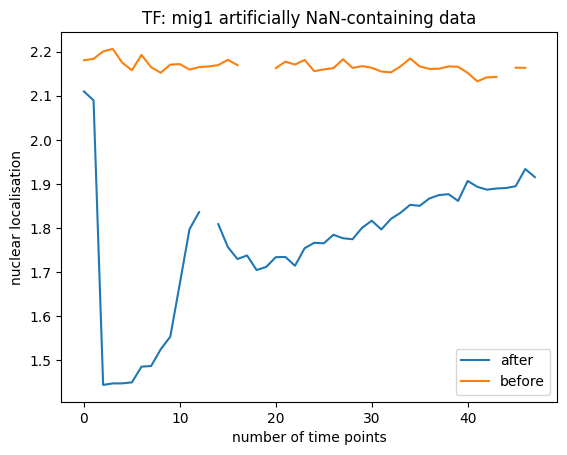

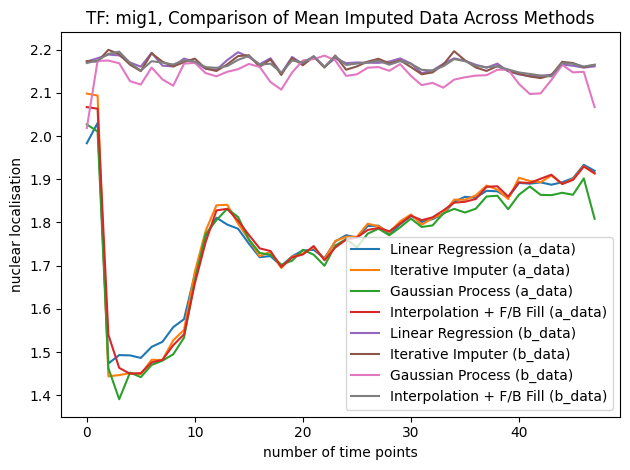

Results for mig1 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.073025  0.207636
1         Iterative Imputer  0.044214  0.154468
2          Gaussian Process  0.206173  0.321577
3  Interpolation + F/B Fill  0.074793  0.192042


Results for mig1 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.057680  0.190945
1         Iterative Imputer  0.044689  0.164614
2          Gaussian Process  0.241085  0.353636
3  Interpolation + F/B Fill  0.056154  0.182989


Number of NaN for a_data is 1747
Number of NaN for b_data is 1848
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


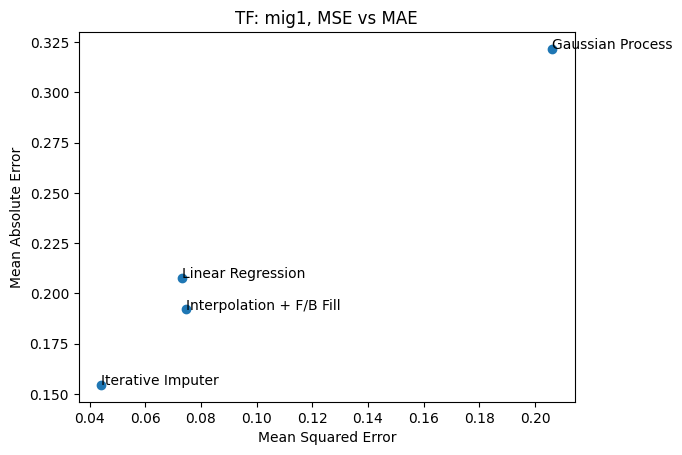

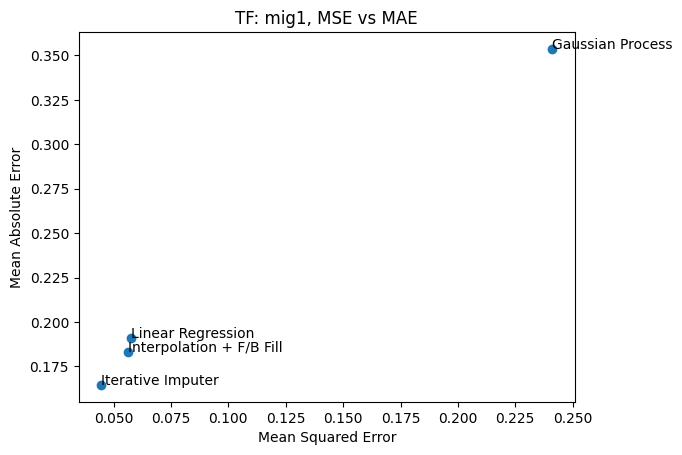

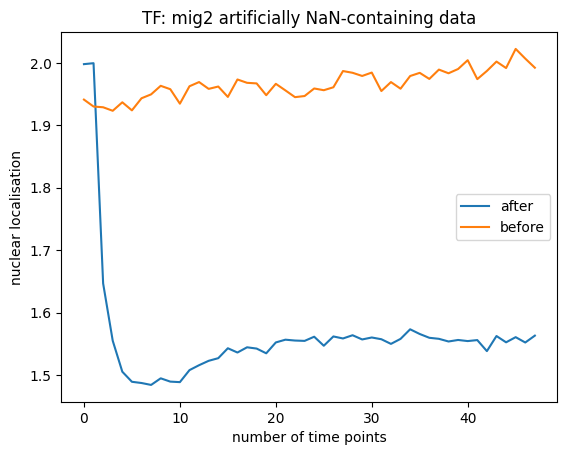

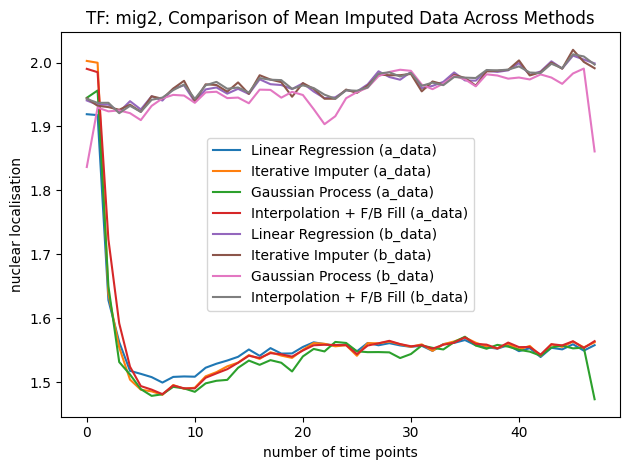

Results for mig2 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.018362  0.084373
1         Iterative Imputer  0.007462  0.058987
2          Gaussian Process  0.068426  0.174414
3  Interpolation + F/B Fill  0.015569  0.081306


Results for mig2 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.024622  0.123206
1         Iterative Imputer  0.021456  0.112376
2          Gaussian Process  0.144714  0.262631
3  Interpolation + F/B Fill  0.023609  0.120358


Number of NaN for a_data is 1852
Number of NaN for b_data is 1773
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


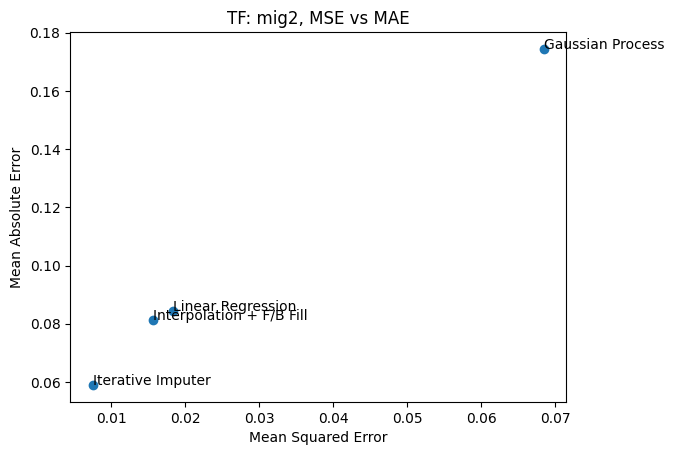

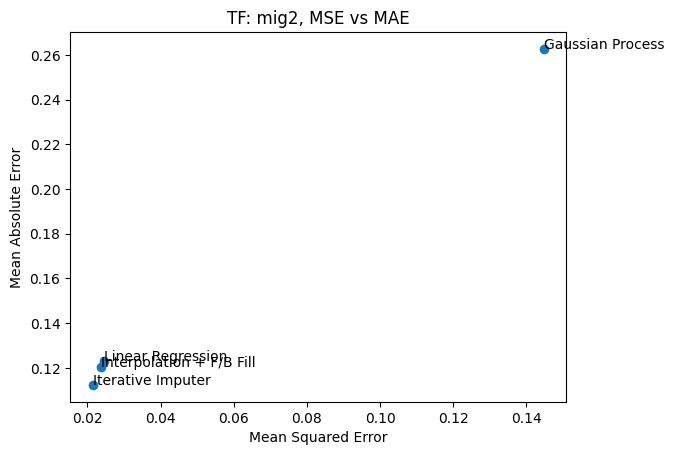

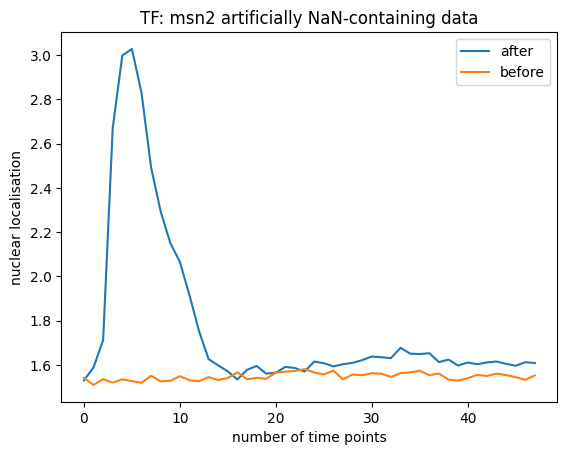

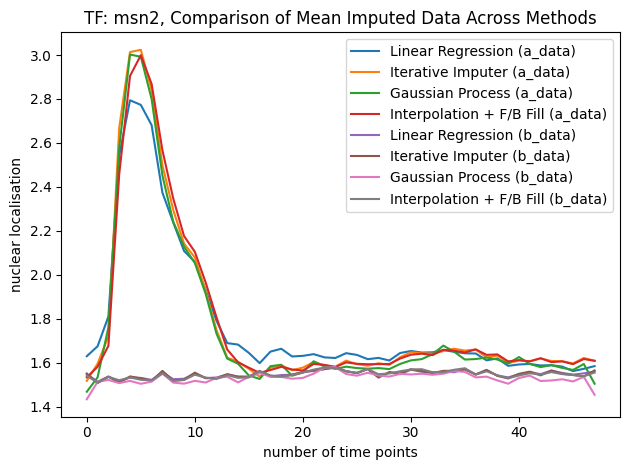

Results for msn2 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.196040  0.327341
1         Iterative Imputer  0.058990  0.178736
2          Gaussian Process  0.260552  0.368637
3  Interpolation + F/B Fill  0.126484  0.226114


Results for msn2 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.031326  0.113527
1         Iterative Imputer  0.029958  0.117232
2          Gaussian Process  0.136010  0.258417
3  Interpolation + F/B Fill  0.036605  0.120724


Number of NaN for a_data is 1965
Number of NaN for b_data is 1883
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


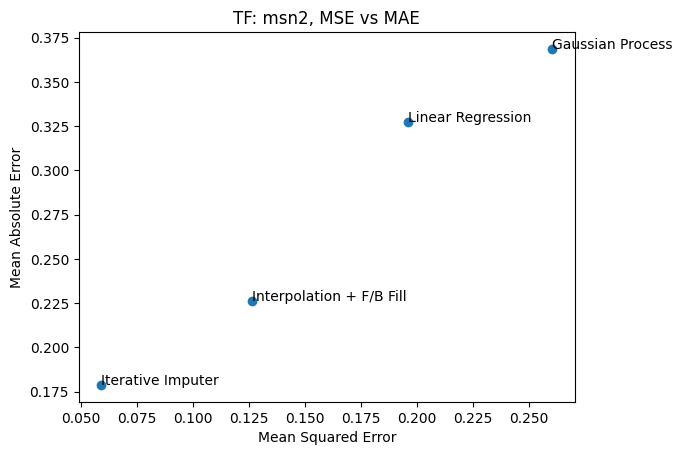

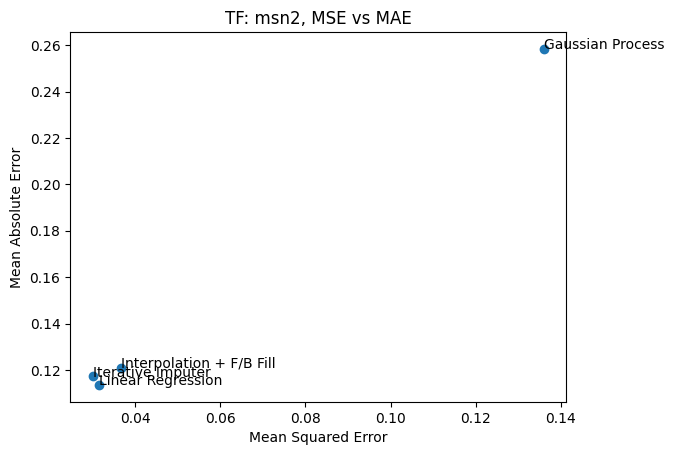

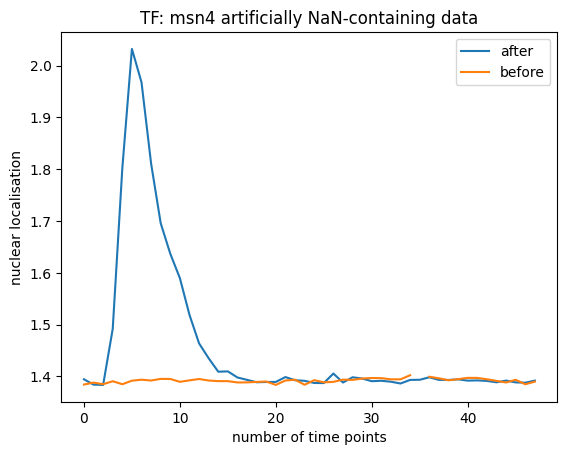

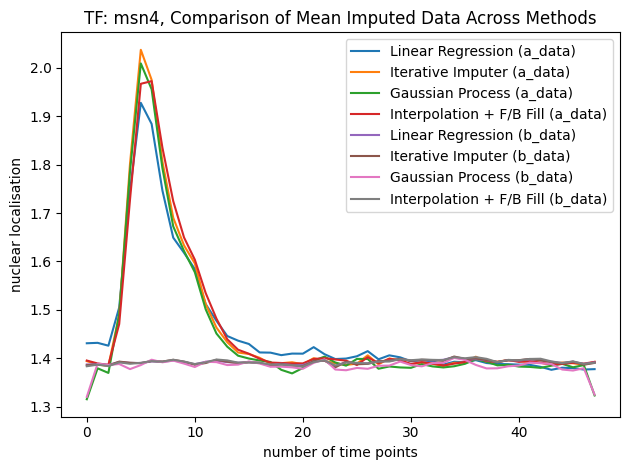

Results for msn4 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.032156  0.111264
1         Iterative Imputer  0.009568  0.061645
2          Gaussian Process  0.068298  0.170189
3  Interpolation + F/B Fill  0.026571  0.089275


Results for msn4 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.002386  0.037323
1         Iterative Imputer  0.002485  0.038717
2          Gaussian Process  0.045489  0.138303
3  Interpolation + F/B Fill  0.004065  0.048909


Number of NaN for a_data is 1801
Number of NaN for b_data is 1756
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or sc

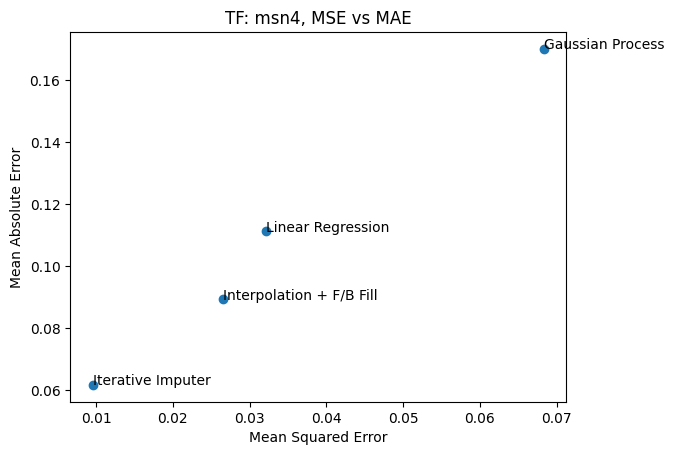

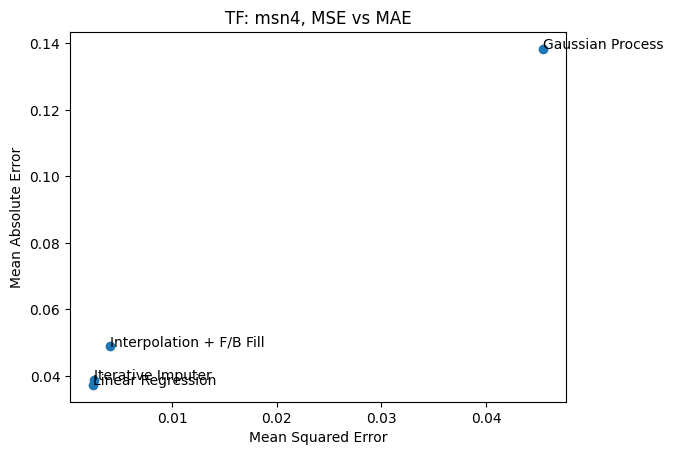

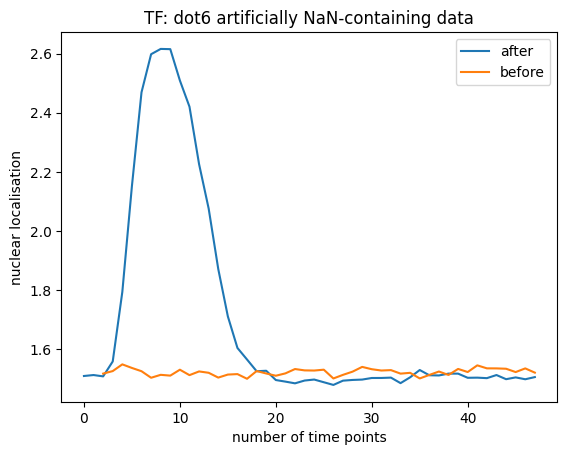

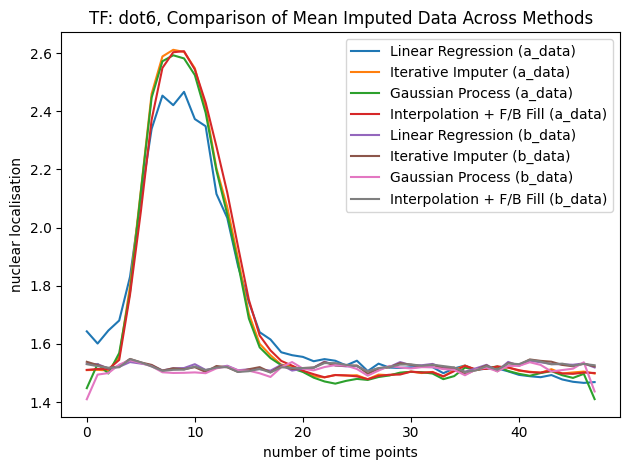

Results for dot6 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.183033  0.283700
1         Iterative Imputer  0.038448  0.120506
2          Gaussian Process  0.132962  0.243596
3  Interpolation + F/B Fill  0.061538  0.143924


Results for dot6 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.022578  0.091570
1         Iterative Imputer  0.014636  0.086323
2          Gaussian Process  0.083143  0.188370
3  Interpolation + F/B Fill  0.012512  0.077080


Number of NaN for a_data is 1557
Number of NaN for b_data is 1569
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or sc

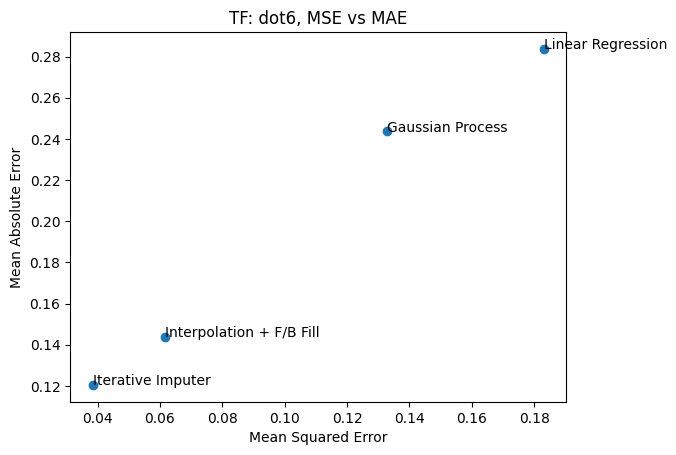

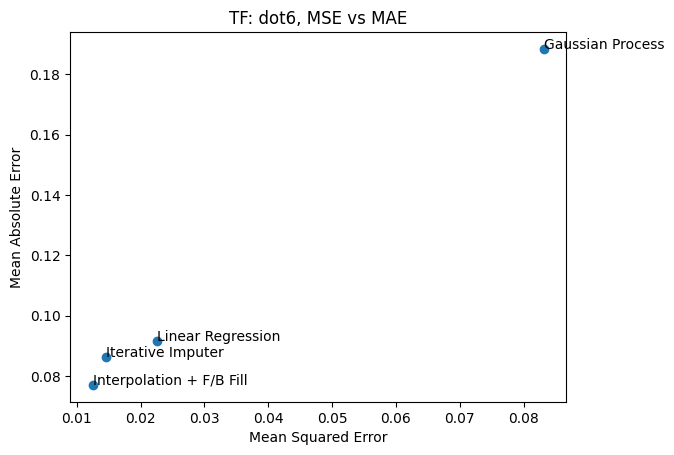

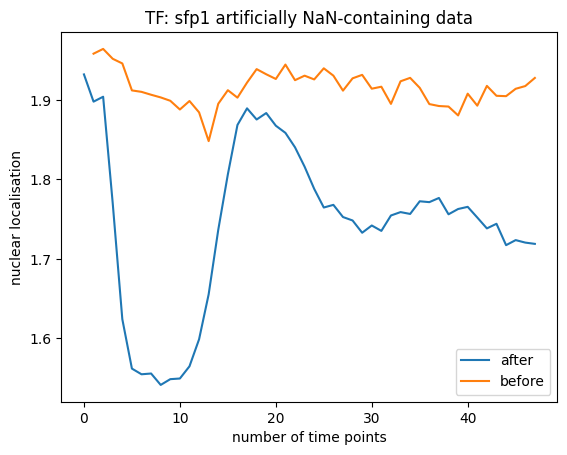

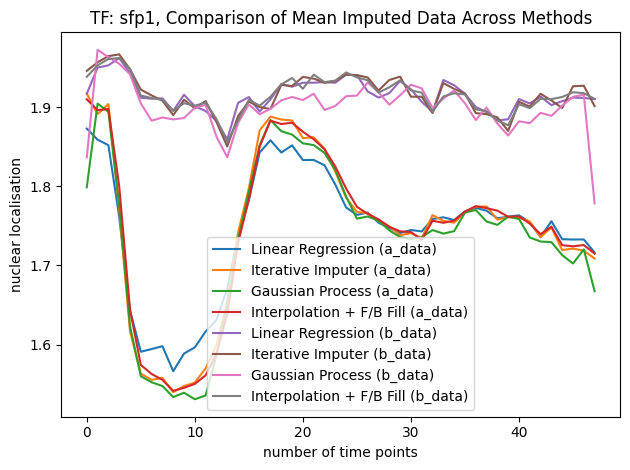

Results for sfp1 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.035345  0.146988
1         Iterative Imputer  0.013468  0.088130
2          Gaussian Process  0.083866  0.203466
3  Interpolation + F/B Fill  0.019592  0.104819


Results for sfp1 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.035639  0.150482
1         Iterative Imputer  0.033635  0.143479
2          Gaussian Process  0.126246  0.247165
3  Interpolation + F/B Fill  0.028035  0.129680


Number of NaN for a_data is 2046
Number of NaN for b_data is 2126
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packa

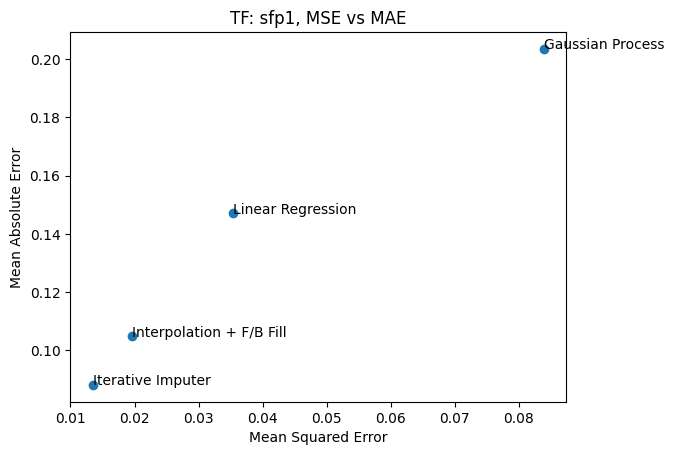

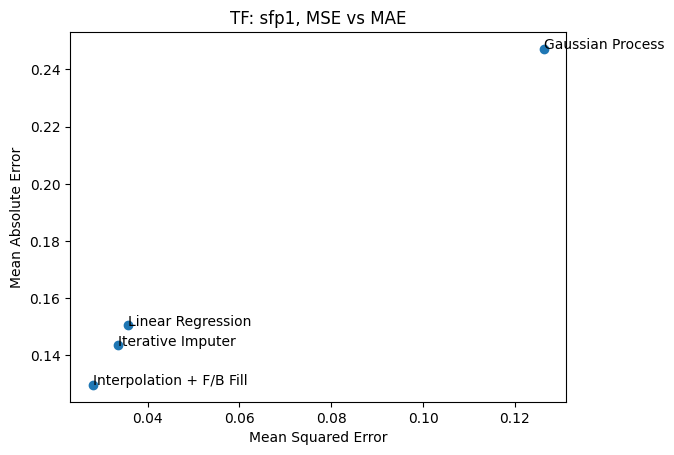

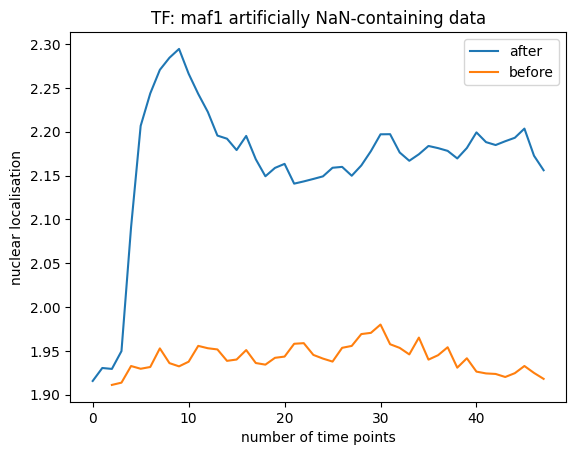

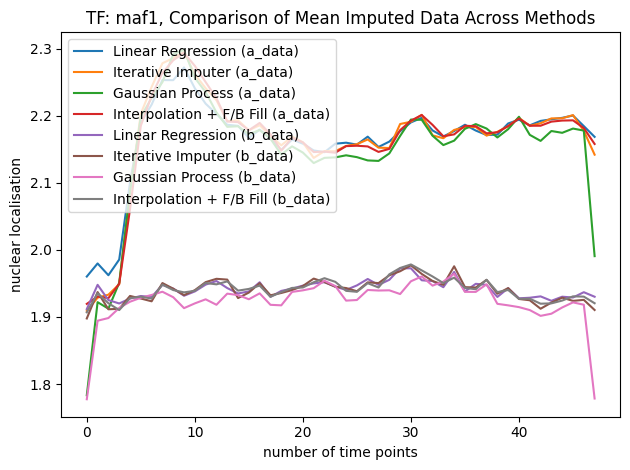

Results for maf1 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.043506  0.161640
1         Iterative Imputer  0.025311  0.121805
2          Gaussian Process  0.153506  0.278990
3  Interpolation + F/B Fill  0.029610  0.131178


Results for maf1 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.027542  0.122502
1         Iterative Imputer  0.024736  0.117509
2          Gaussian Process  0.135618  0.242091
3  Interpolation + F/B Fill  0.020373  0.106302


Number of NaN for a_data is 1283
Number of NaN for b_data is 1206
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


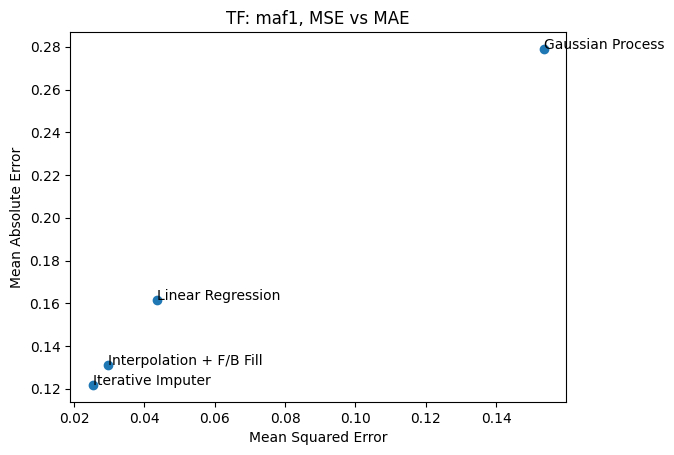

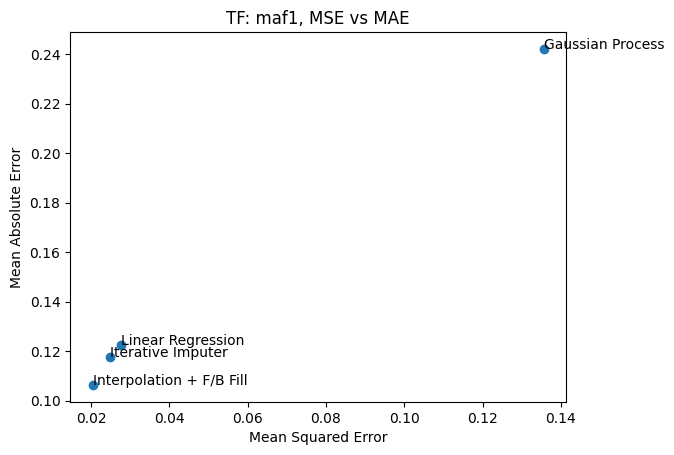

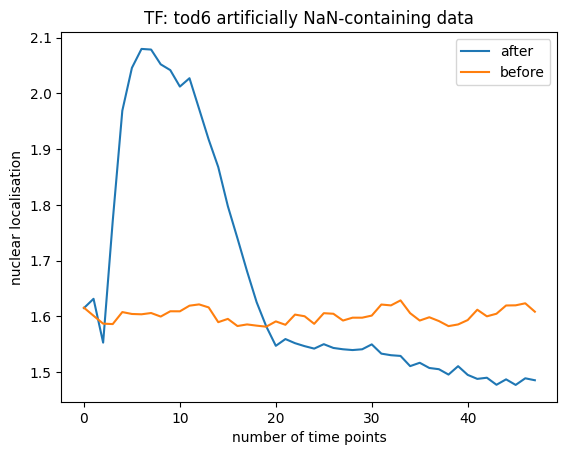

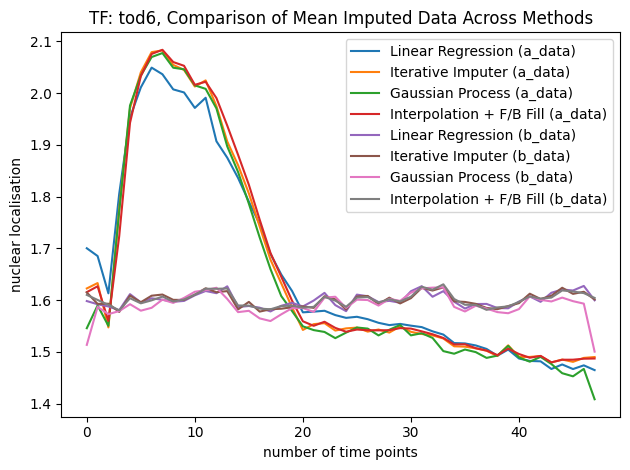

Results for tod6 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.046993  0.153486
1         Iterative Imputer  0.013457  0.085647
2          Gaussian Process  0.086153  0.195282
3  Interpolation + F/B Fill  0.016886  0.094690


Results for tod6 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.033636  0.141195
1         Iterative Imputer  0.013222  0.087412
2          Gaussian Process  0.086083  0.194242
3  Interpolation + F/B Fill  0.015877  0.091354


Number of NaN for a_data is 1777
Number of NaN for b_data is 1813
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the da

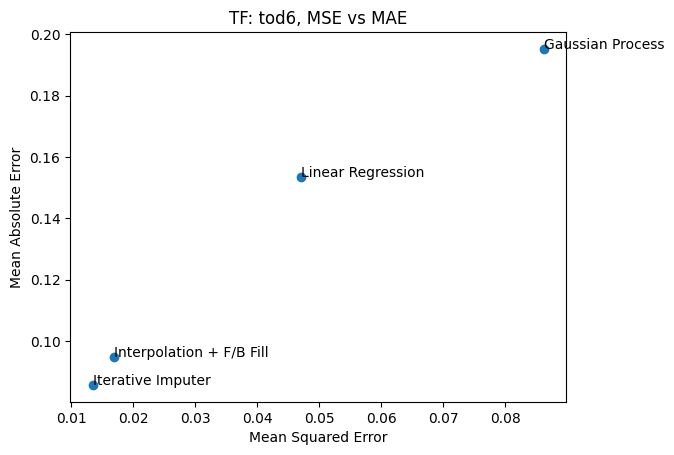

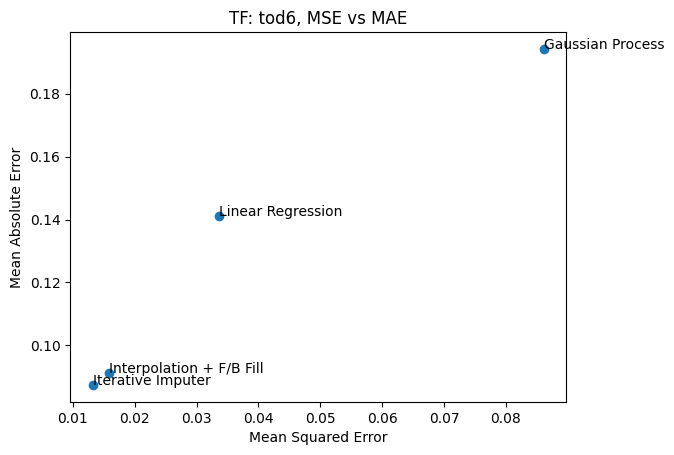

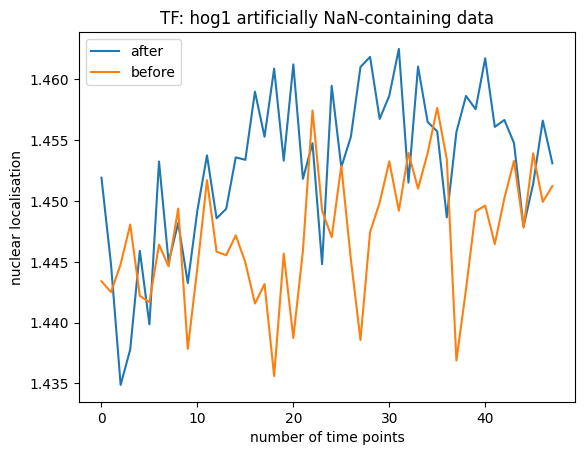

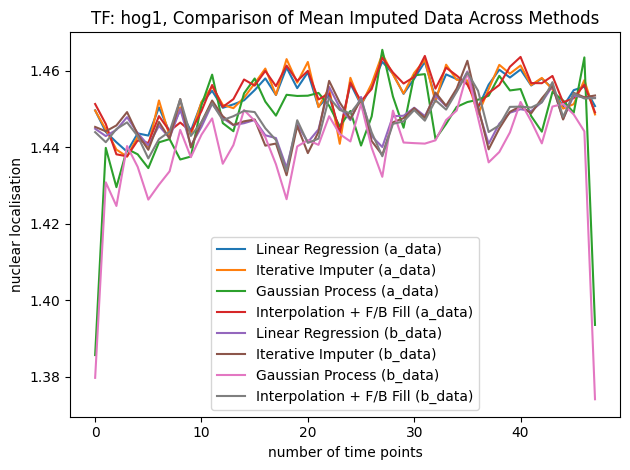

Results for hog1 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.003157  0.044297
1         Iterative Imputer  0.003000  0.043112
2          Gaussian Process  0.036523  0.134721
3  Interpolation + F/B Fill  0.004503  0.052627


Results for hog1 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.002619  0.039985
1         Iterative Imputer  0.002678  0.040894
2          Gaussian Process  0.047307  0.144711
3  Interpolation + F/B Fill  0.004819  0.053161


Number of NaN for a_data is 2076
Number of NaN for b_data is 2021
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the da

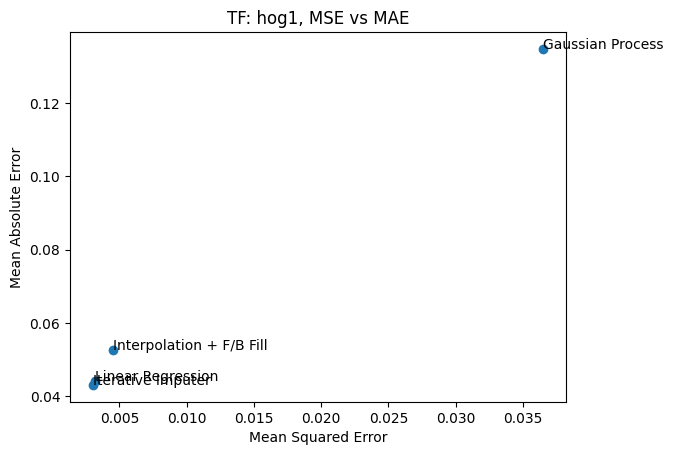

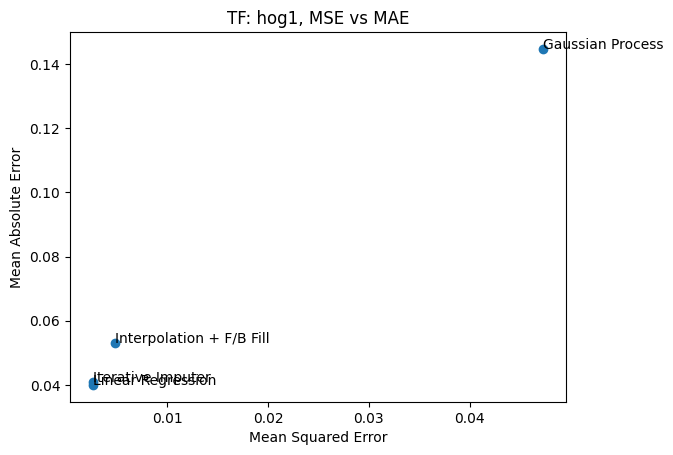

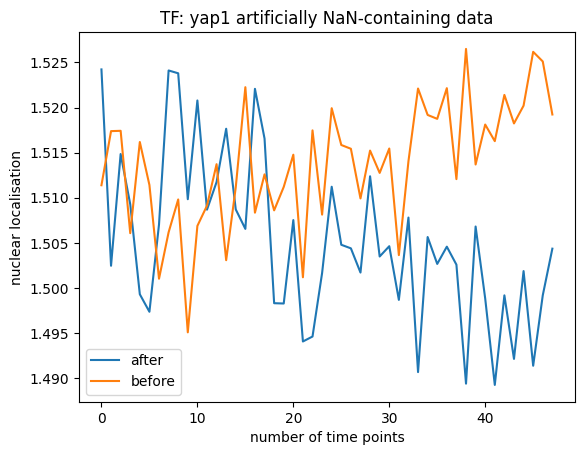

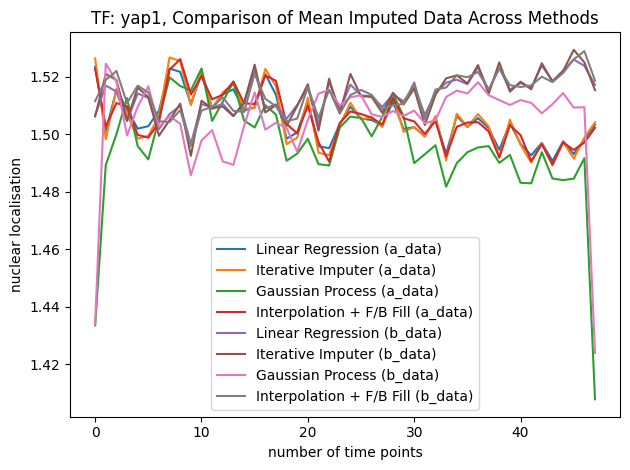

Results for yap1 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.003364  0.046180
1         Iterative Imputer  0.003436  0.046855
2          Gaussian Process  0.060351  0.160735
3  Interpolation + F/B Fill  0.005563  0.058881


Results for yap1 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.003449  0.046588
1         Iterative Imputer  0.003621  0.047608
2          Gaussian Process  0.064639  0.165078
3  Interpolation + F/B Fill  0.005969  0.060800




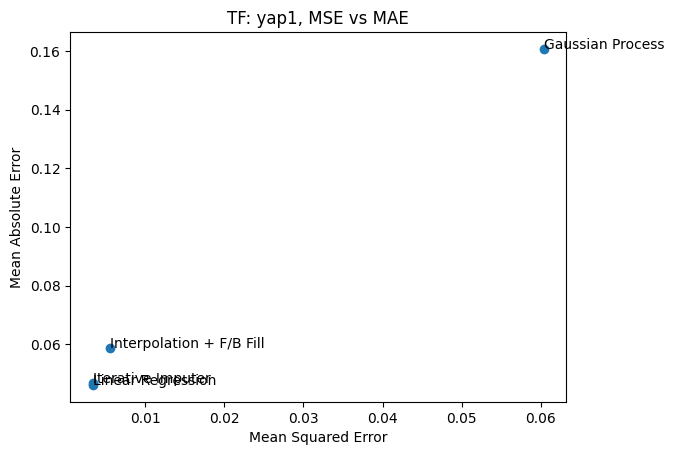

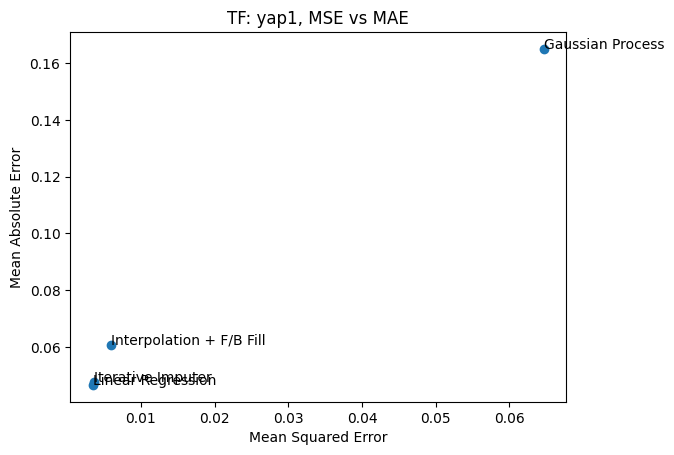

In [13]:
# Load data and define parameters
fname = "./DS_10283_2901/fig2_stress_type_expts.json"
transcription_factors = ["mig1", "mig2", "msn2", "msn4", "dot6", "sfp1", "maf1", "tod6", "hog1", "yap1"]
stress = "gluc"

# concatenate all the data so we can set ylim later 
b_data_all_w_nan = np.array([])
a_data_all_w_nan = np.array([])
with open(fname, "r") as f:
    expts = json.load(f)

for transcription_factor in transcription_factors:
    data = np.array(expts[transcription_factor][stress]["GFP"]["nucLoc"]).astype("float")
    t = np.array(expts[transcription_factor][stress]["general"]["times"]).astype("float")
    b_data = data[:, t[0, :] < 0]
    a_data = data[:, t[0, :] >= 0]
    minlen = np.min([b_data.shape[1], a_data.shape[1]])
    b_data = b_data[:, -minlen:]
    a_data = a_data[:, :minlen]
    # append data so that it can be used for setting ylim in the nan-containing data plot
    b_data_all_w_nan = np.concatenate((b_data_all_w_nan, b_data.flatten()))
    a_data_all_w_nan = np.concatenate((a_data_all_w_nan, a_data.flatten()))

# Simulate missing data and evaluate
try:
    with open(fname, "r") as f:
        expts = json.load(f)

    for transcription_factor in transcription_factors:
        data = np.array(expts[transcription_factor][stress]["GFP"]["nucLoc"]).astype("float")
        t = np.array(expts[transcription_factor][stress]["general"]["times"]).astype("float")
        b_data = data[:, t[0, :] < 0]
        a_data = data[:, t[0, :] >= 0]
        minlen = np.min([b_data.shape[1], a_data.shape[1]])
        b_data = b_data[:, -minlen:]
        a_data = a_data[:, :minlen]

        # Mask 20% of data as NaN for testing, discretely 
        a_data_with_nans, a_nan_mask = introduce_nans(a_data, mask_ratio=0.2)
        b_data_with_nans, b_nan_mask = introduce_nans(b_data, mask_ratio=0.2)

        print(f"Number of NaN for a_data is {np.sum(np.isnan(a_data_with_nans))}")
        print(f"Number of NaN for b_data is {np.sum(np.isnan(b_data_with_nans))}")

        # plot true data, because we can't plot the artificially NaN-containing data (the NaNs will make the average 0...)
        plt.figure()
        plt.plot(np.mean(a_data, axis=0), label="after")
        plt.plot(np.mean(b_data, axis=0), label="before")

        # create copies of a_data and b_data and dropna so we can set ylim without encountering errors
        a_data_all_w_nan_copy = a_data_all_w_nan.copy()
        b_data_all_w_nan_copy = b_data_all_w_nan.copy()
        a_data_all_w_nan_copy = a_data_all_w_nan_copy[~np.isnan(a_data_all_w_nan_copy)]
        b_data_all_w_nan_copy = b_data_all_w_nan_copy[~np.isnan(b_data_all_w_nan_copy)]
        # plt.ylim(min(np.min(a_data_all_w_nan_copy), np.min(b_data_all_w_nan_copy)), max(np.max(a_data_all_w_nan_copy), np.max(b_data_all_w_nan_copy)))
        plt.xlabel("number of time points")
        plt.ylabel("nuclear localisation")
        plt.title(f"TF: {transcription_factor} artificially NaN-containing data")
        plt.legend()

        print("Filling NaN...\n")
        # Evaluate each method on masked data
        results_df_a_data = impute_then_evaluate_methods(a_data_with_nans, a_data, a_nan_mask)
        results_df_b_data = impute_then_evaluate_methods(b_data_with_nans, b_data, b_nan_mask)

        # plot after imputation
        plt.figure()
        for index, row in results_df_a_data.iterrows():
            method_name = row["Method"]
            imputed_data = row["Imputed Data"]

            mean_imputed = np.mean(imputed_data, axis=0)
            plt.plot(mean_imputed, label=f"{method_name} (a_data)")

        for index, row in results_df_b_data.iterrows():
            method_name = row["Method"]
            imputed_data = row["Imputed Data"]

            mean_imputed = np.mean(imputed_data, axis=0)
            plt.plot(mean_imputed, label=f"{method_name} (b_data)")

        # plt.ylim(min(np.min(a_data_all_w_nan_copy), np.min(b_data_all_w_nan_copy)), max(np.max(a_data_all_w_nan_copy), np.max(b_data_all_w_nan_copy)))
        plt.xlabel("number of time points")
        plt.ylabel("nuclear localisation")
        plt.title(f"TF: {transcription_factor}, Comparison of Mean Imputed Data Across Methods")
        plt.legend()
        plt.tight_layout()
        plt.show(block=False)

        # Evaluate each method on masked data
        print(f"Results for {transcription_factor} a_data:")
        print(results_df_a_data[['Method', 'MSE', 'MAE']])
        print("\n")

        # Plotting MSE against MAE for each transcription factor
        plt.figure()
        plt.scatter(results_df_a_data['MSE'], results_df_a_data['MAE'], label=results_df_a_data["Method"])
        for i, method in enumerate(results_df_a_data["Method"]):
            plt.annotate(method, (results_df_a_data["MSE"][i], results_df_a_data["MAE"][i]))
        plt.xlabel("Mean Squared Error")
        plt.ylabel("Mean Absolute Error")
        plt.title(f"TF: {transcription_factor}, MSE vs MAE")

        print(f"Results for {transcription_factor} b_data:")
        print(results_df_b_data[['Method', 'MSE', 'MAE']])
        print("\n")

        # Plotting MSE against MAE for each transcription factor
        plt.figure()
        plt.scatter(results_df_b_data['MSE'], results_df_b_data['MAE'], label=results_df_b_data["Method"])
        for i, method in enumerate(results_df_b_data["Method"]):
            plt.annotate(method, (results_df_b_data["MSE"][i], results_df_b_data["MAE"][i]))
        plt.xlabel("Mean Squared Error")
        plt.ylabel("Mean Absolute Error")
        plt.title(f"TF: {transcription_factor}, MSE vs MAE")

except FileNotFoundError:
    print("You need to download test data")
    print(f"\t{fname}")
    print("from https://doi.org/10.1073/pnas.1716659115")

Introducing contiguous blocks of NaNs

Number of NaN for a_data is 1762
Number of NaN for b_data is 1753
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


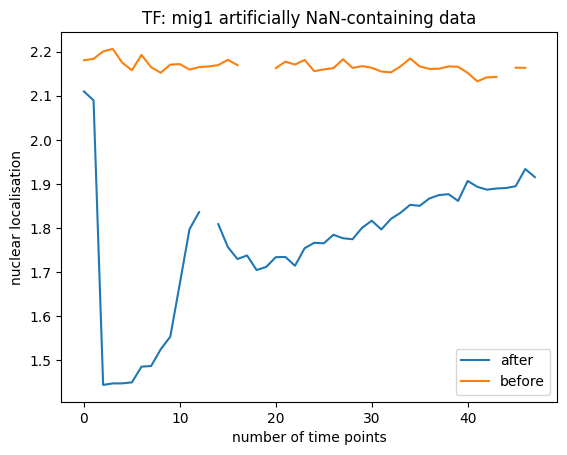

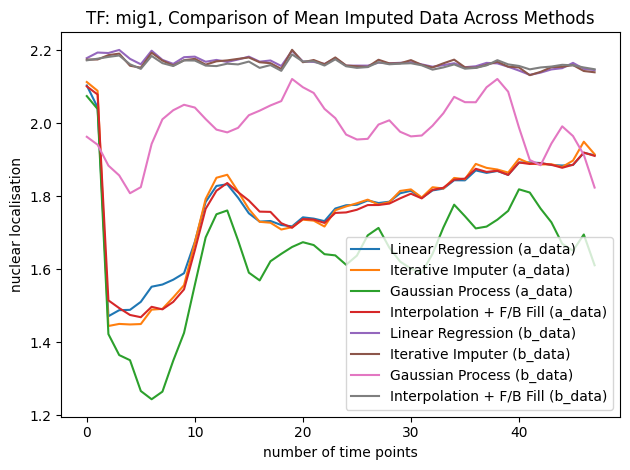

Results for mig1 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.071659  0.215148
1         Iterative Imputer  0.050962  0.166001
2          Gaussian Process  0.972388  0.806194
3  Interpolation + F/B Fill  0.094421  0.217435


Results for mig1 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.064502  0.203740
1         Iterative Imputer  0.057042  0.186428
2          Gaussian Process  1.662570  1.061015
3  Interpolation + F/B Fill  0.072488  0.208016


Number of NaN for a_data is 1624
Number of NaN for b_data is 1601
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


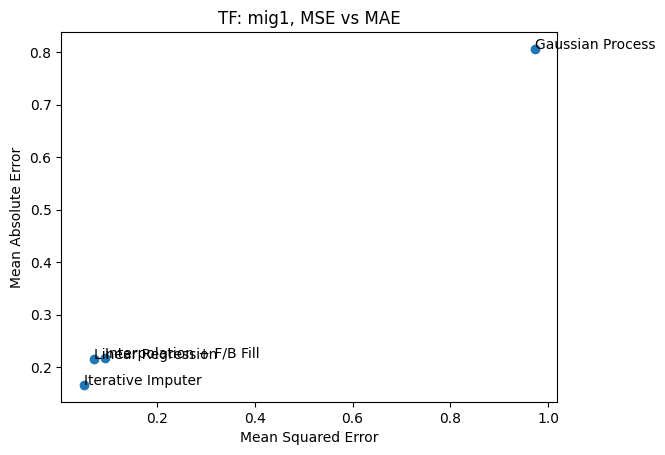

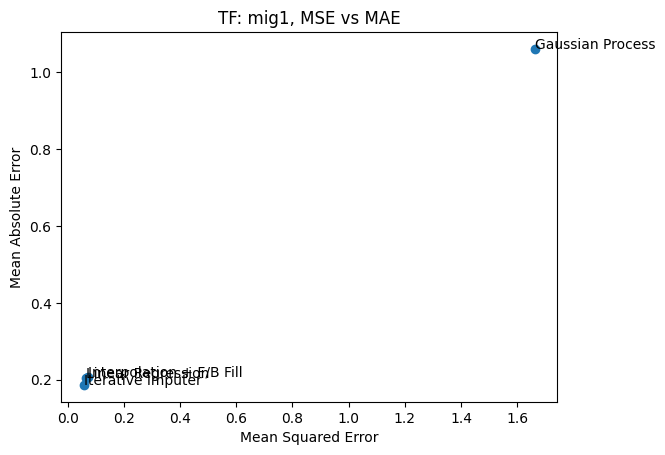

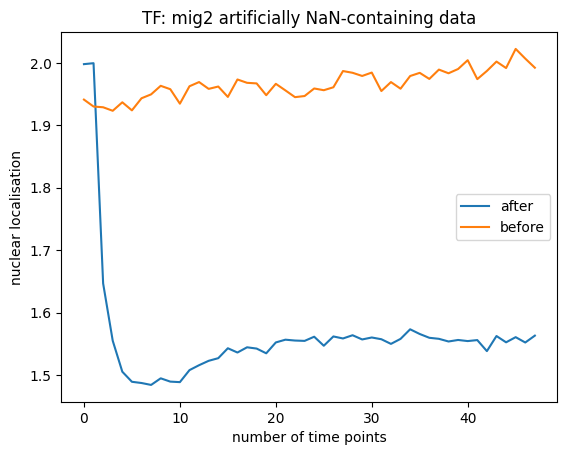

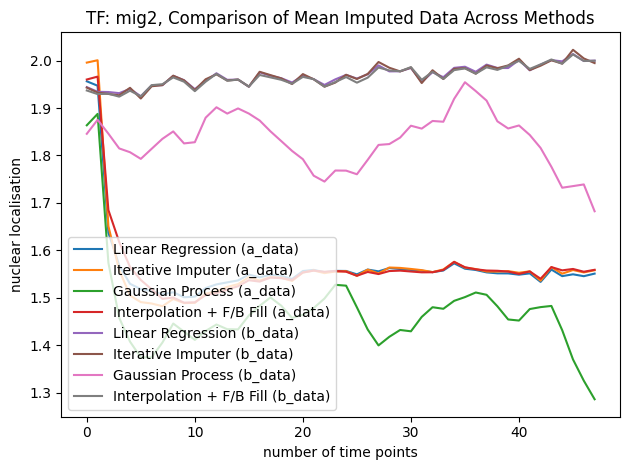

Results for mig2 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.015229  0.084294
1         Iterative Imputer  0.005578  0.057567
2          Gaussian Process  0.578202  0.596541
3  Interpolation + F/B Fill  0.028484  0.102681


Results for mig2 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.026938  0.129566
1         Iterative Imputer  0.021121  0.112994
2          Gaussian Process  1.092668  0.845235
3  Interpolation + F/B Fill  0.029933  0.133490


Number of NaN for a_data is 1660
Number of NaN for b_data is 1620
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


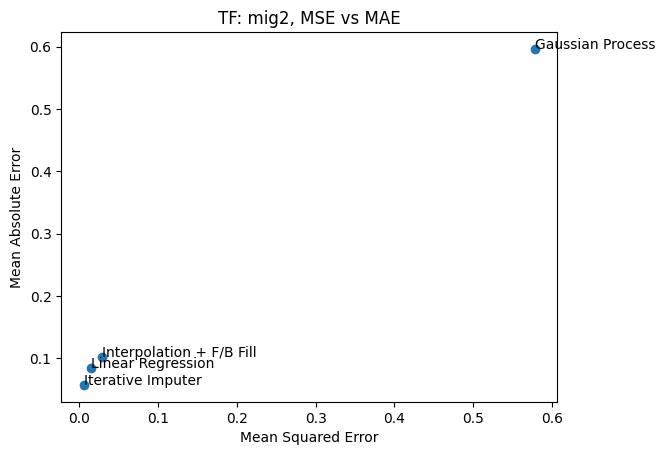

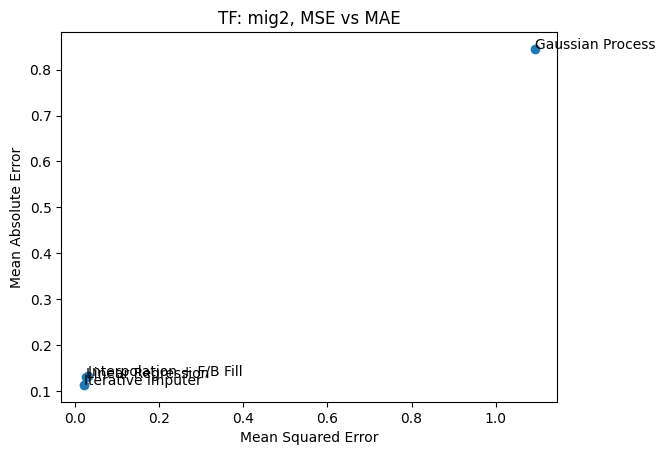

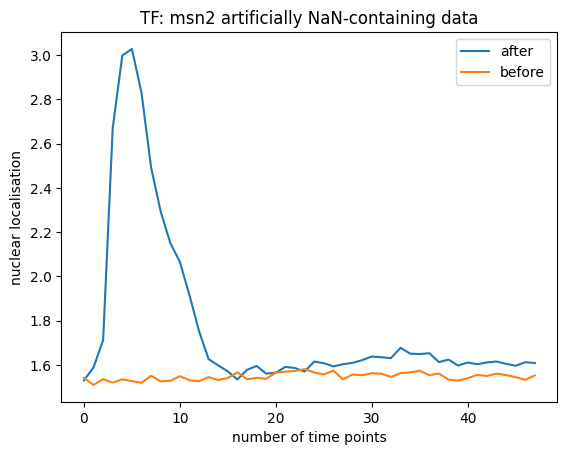

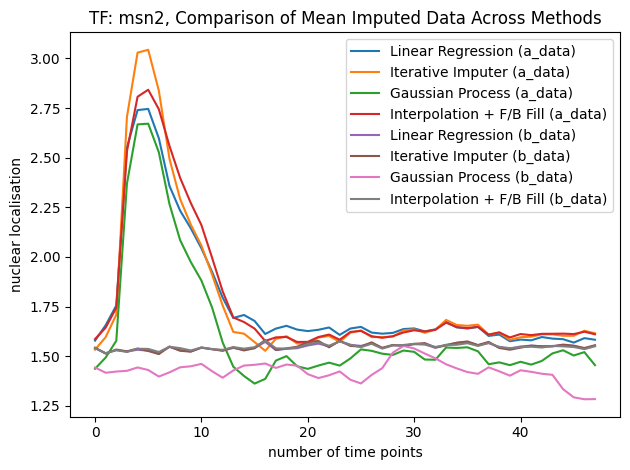

Results for msn2 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.244838  0.358684
1         Iterative Imputer  0.071305  0.191375
2          Gaussian Process  1.223164  0.902368
3  Interpolation + F/B Fill  0.292716  0.340644


Results for msn2 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.036252  0.118754
1         Iterative Imputer  0.034945  0.122068
2          Gaussian Process  0.853928  0.760655
3  Interpolation + F/B Fill  0.048807  0.137955


Number of NaN for a_data is 1758
Number of NaN for b_data is 1728
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or sc

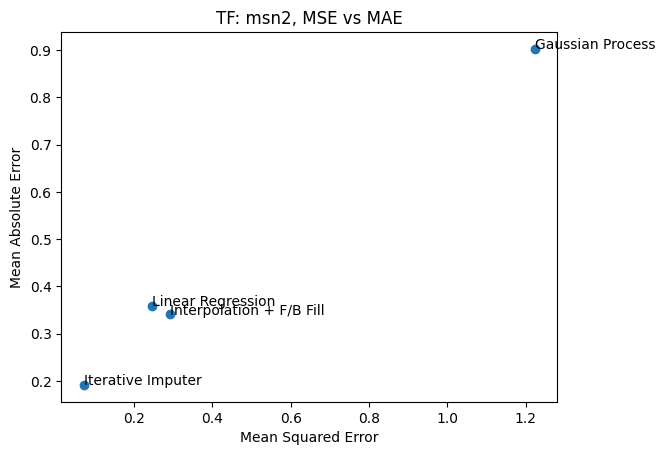

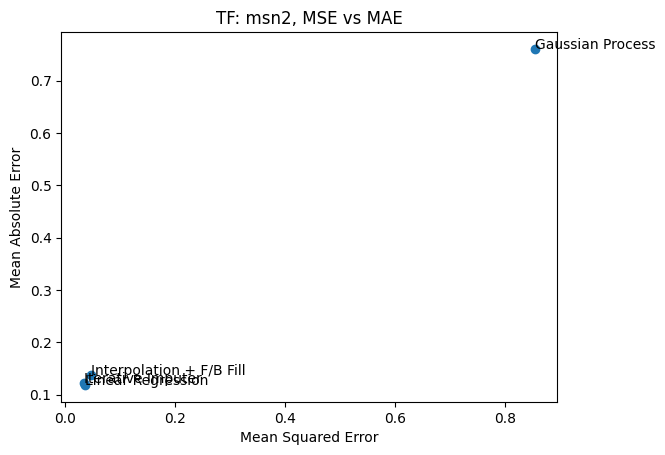

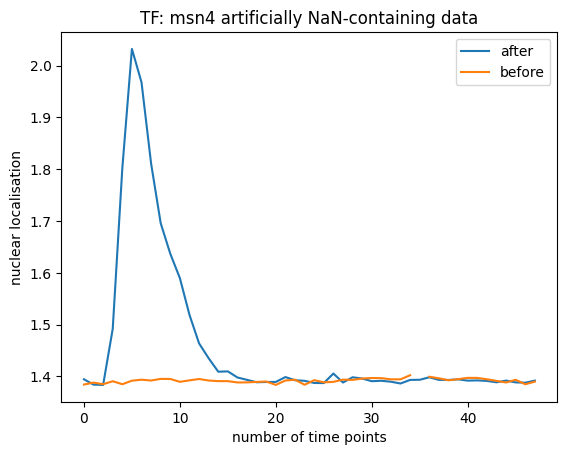

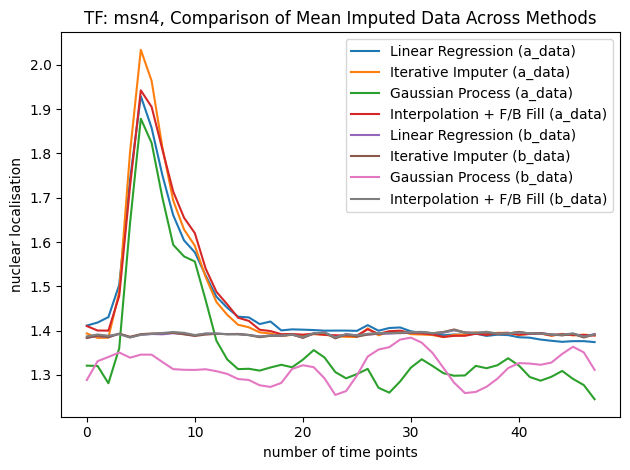

Results for msn4 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.043299  0.123505
1         Iterative Imputer  0.013450  0.067946
2          Gaussian Process  0.532120  0.567800
3  Interpolation + F/B Fill  0.050948  0.121079


Results for msn4 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.002419  0.037715
1         Iterative Imputer  0.002632  0.039538
2          Gaussian Process  0.400407  0.487221
3  Interpolation + F/B Fill  0.004134  0.050090


Number of NaN for a_data is 1636
Number of NaN for b_data is 1659
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


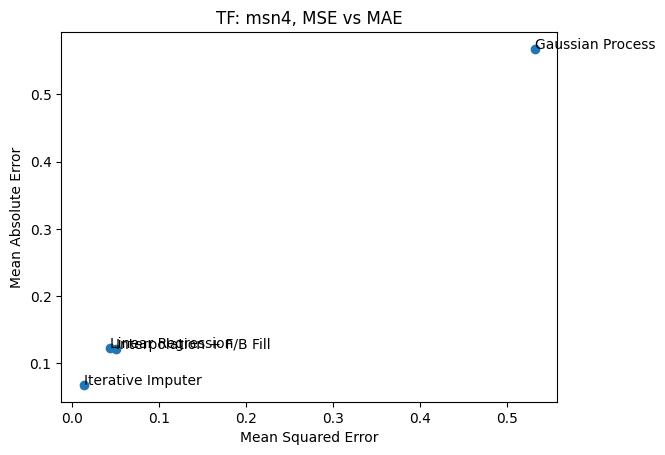

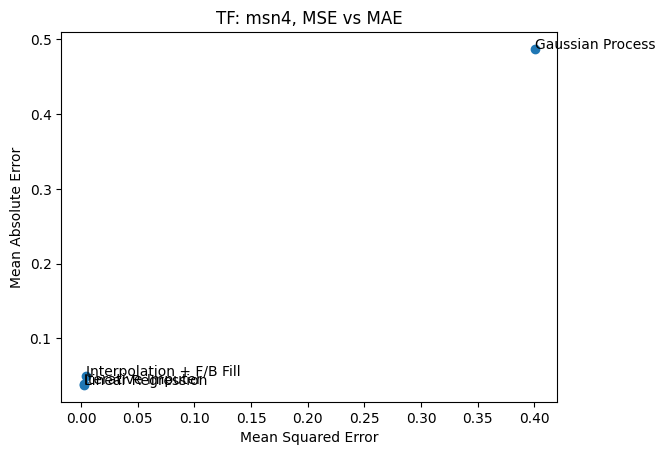

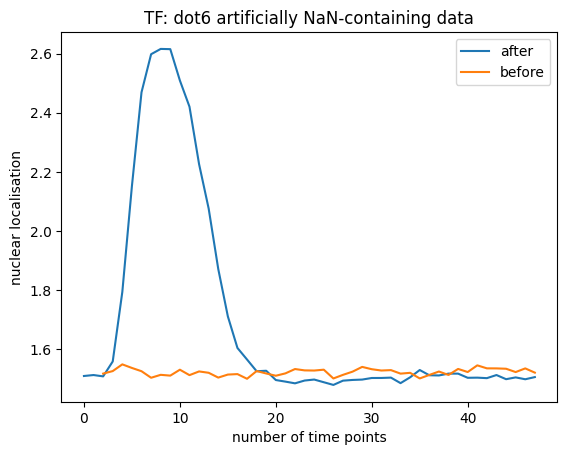

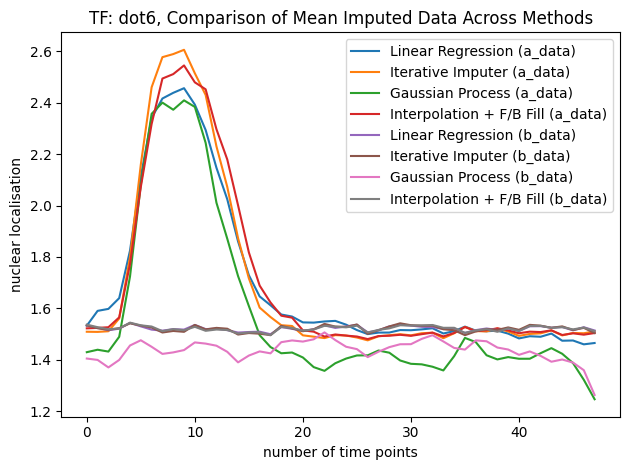

Results for dot6 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.207429  0.287790
1         Iterative Imputer  0.036217  0.115798
2          Gaussian Process  0.812523  0.701003
3  Interpolation + F/B Fill  0.173718  0.224095


Results for dot6 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.025935  0.097529
1         Iterative Imputer  0.020763  0.090071
2          Gaussian Process  0.521323  0.547436
3  Interpolation + F/B Fill  0.022397  0.092313


Number of NaN for a_data is 1341
Number of NaN for b_data is 1371
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


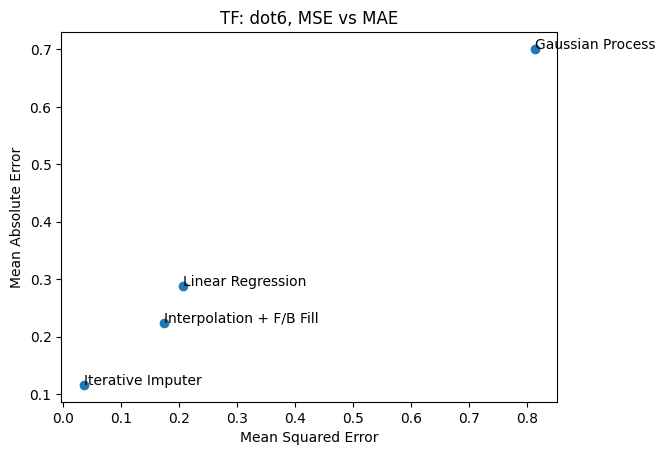

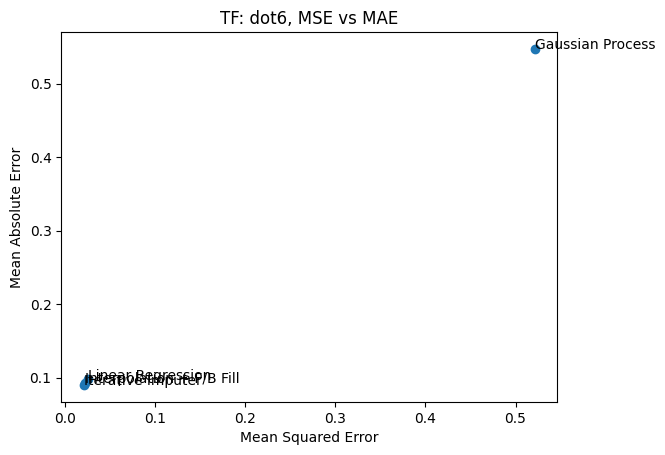

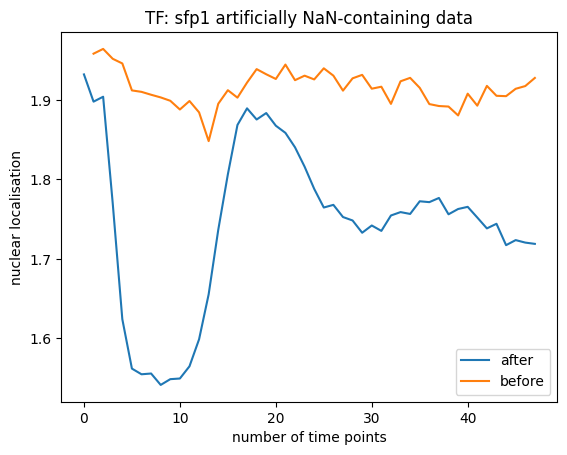

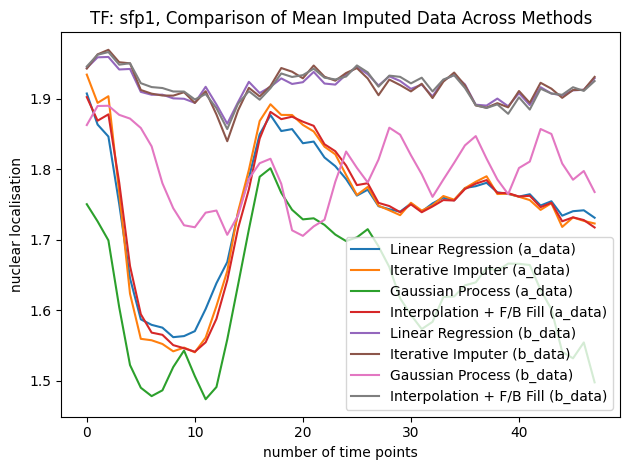

Results for sfp1 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.035326  0.148092
1         Iterative Imputer  0.016489  0.101726
2          Gaussian Process  0.840468  0.725027
3  Interpolation + F/B Fill  0.035691  0.141416


Results for sfp1 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.043815  0.166447
1         Iterative Imputer  0.030906  0.136898
2          Gaussian Process  0.866416  0.739603
3  Interpolation + F/B Fill  0.043197  0.160060


Number of NaN for a_data is 1822
Number of NaN for b_data is 1903
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packa

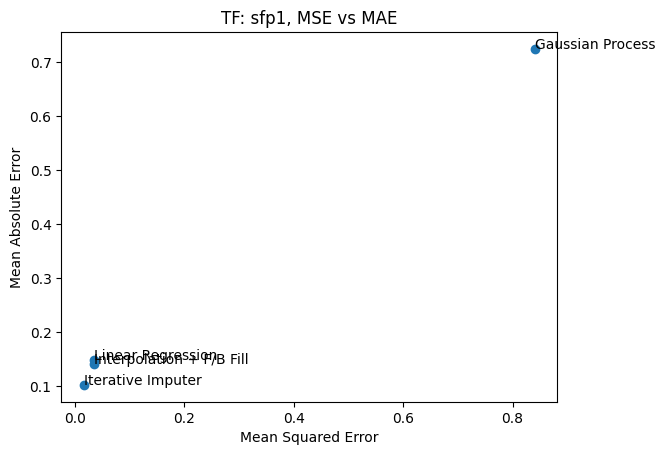

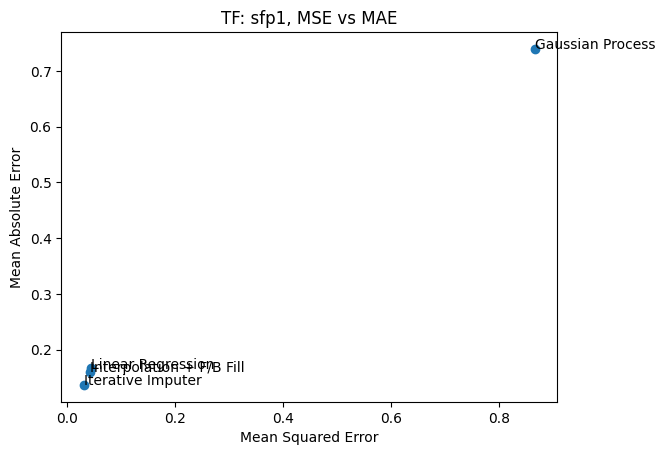

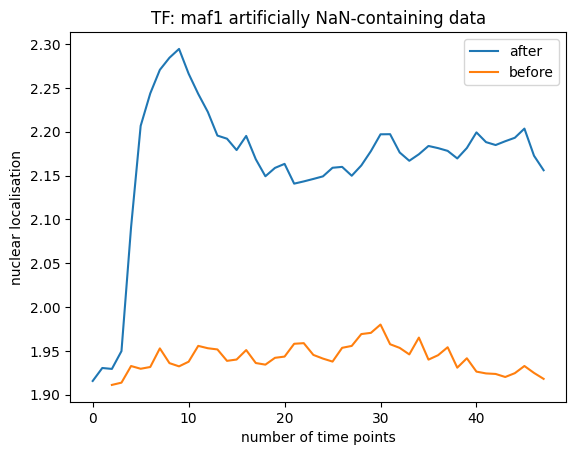

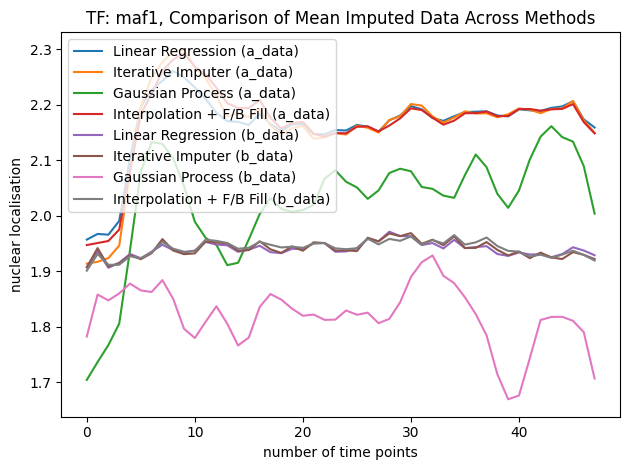

Results for maf1 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.055714  0.183516
1         Iterative Imputer  0.034775  0.138182
2          Gaussian Process  1.306240  0.897221
3  Interpolation + F/B Fill  0.056895  0.175642


Results for maf1 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.030418  0.131015
1         Iterative Imputer  0.024308  0.116495
2          Gaussian Process  0.891047  0.731306
3  Interpolation + F/B Fill  0.027449  0.123226


Number of NaN for a_data is 1175
Number of NaN for b_data is 1107
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


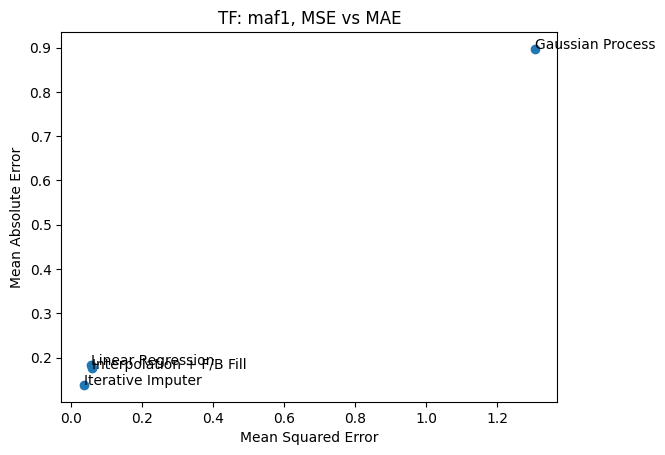

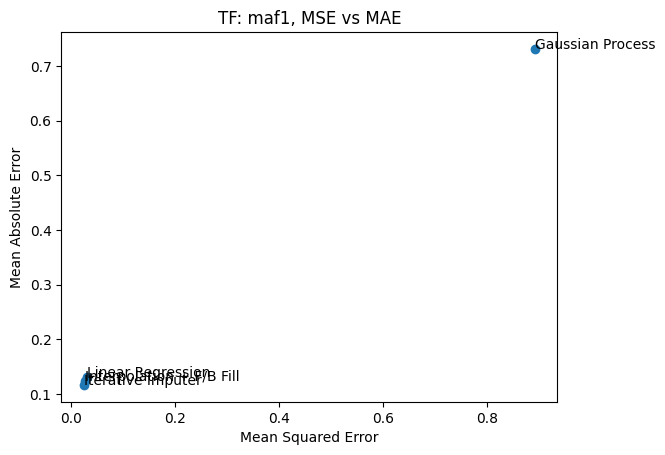

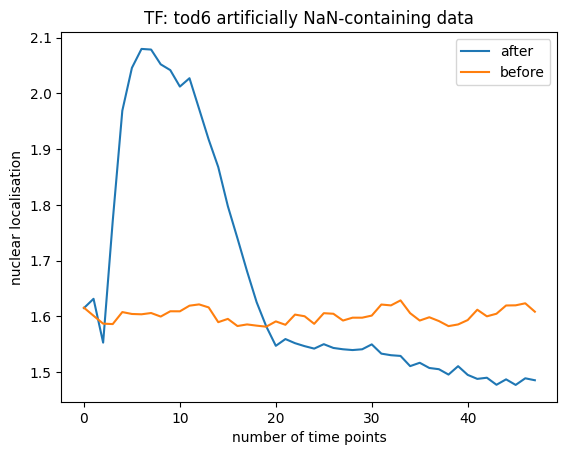

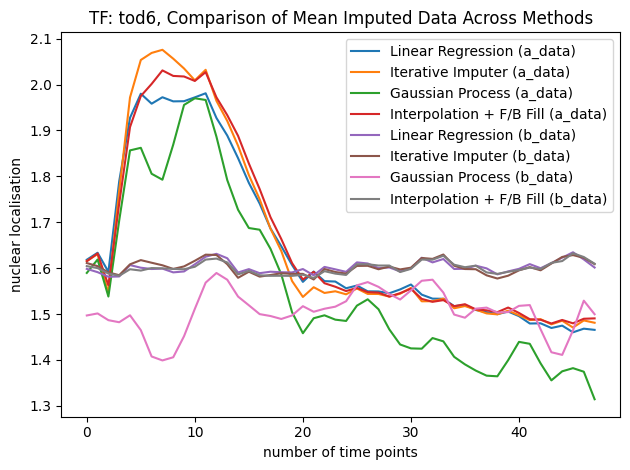

Results for tod6 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.058030  0.170704
1         Iterative Imputer  0.018696  0.100533
2          Gaussian Process  0.658184  0.614846
3  Interpolation + F/B Fill  0.052301  0.144563


Results for tod6 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.041812  0.158443
1         Iterative Imputer  0.022393  0.112446
2          Gaussian Process  0.635340  0.617195
3  Interpolation + F/B Fill  0.032014  0.123630


Number of NaN for a_data is 1638
Number of NaN for b_data is 1682
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


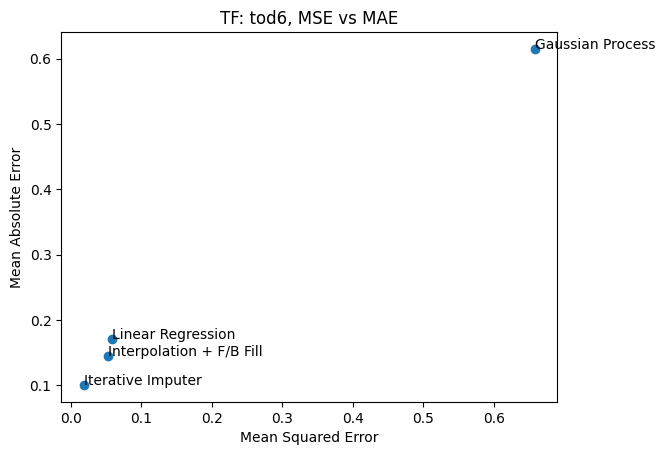

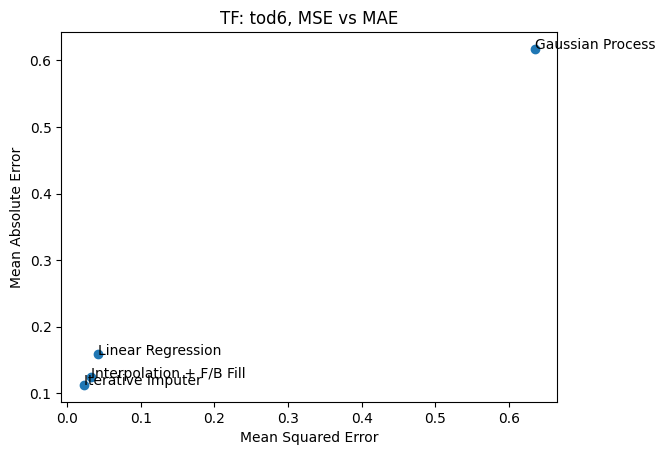

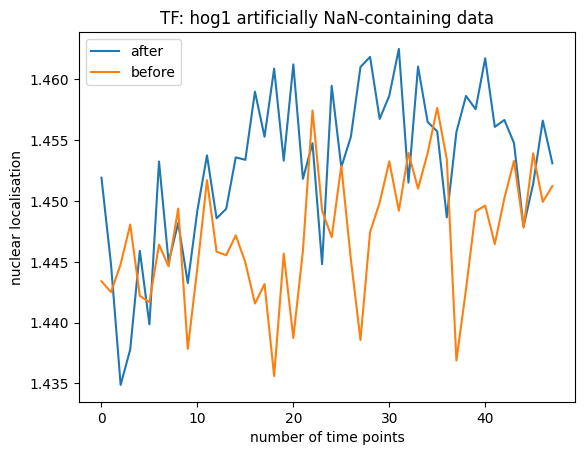

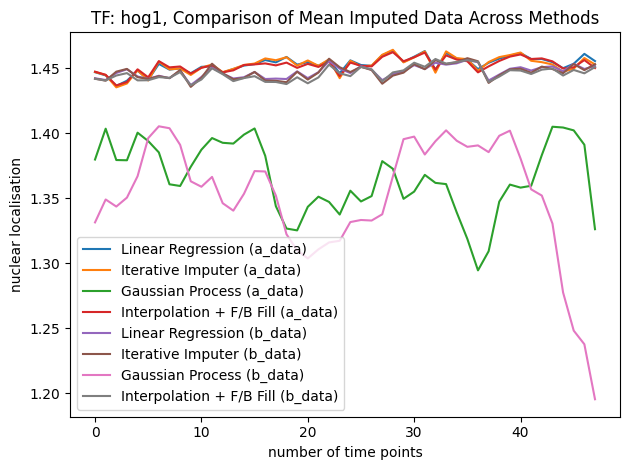

Results for hog1 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.003413  0.046600
1         Iterative Imputer  0.003272  0.045398
2          Gaussian Process  0.503483  0.547686
3  Interpolation + F/B Fill  0.004869  0.055458


Results for hog1 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.003036  0.043880
1         Iterative Imputer  0.003037  0.043382
2          Gaussian Process  0.543295  0.575016
3  Interpolation + F/B Fill  0.004604  0.054035


Number of NaN for a_data is 1854
Number of NaN for b_data is 1897
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the da

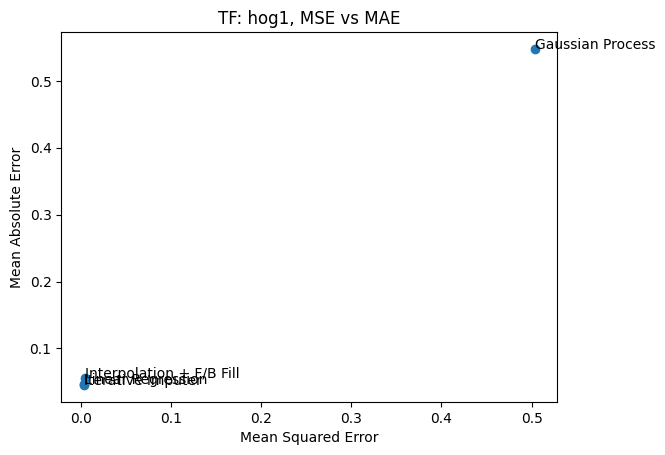

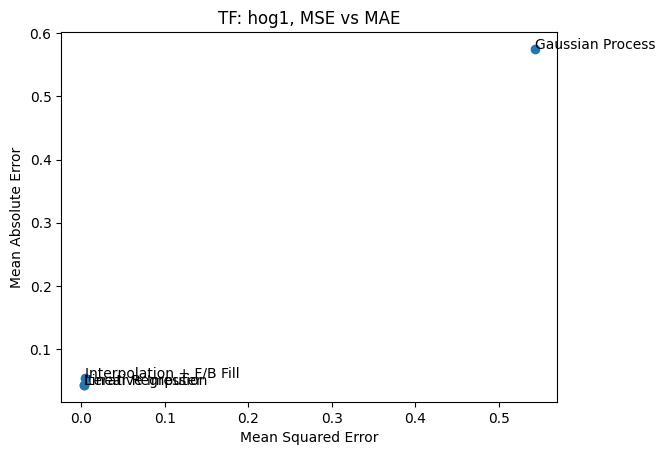

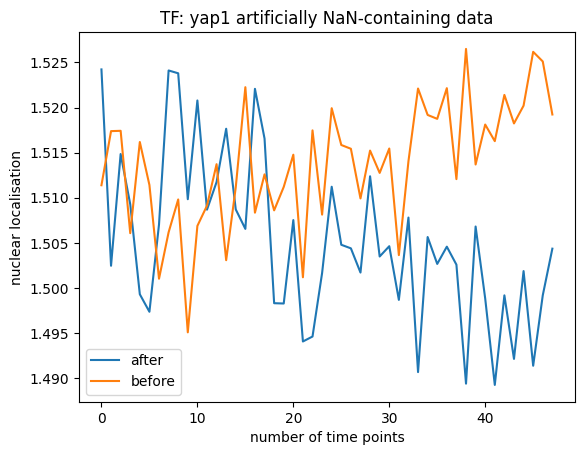

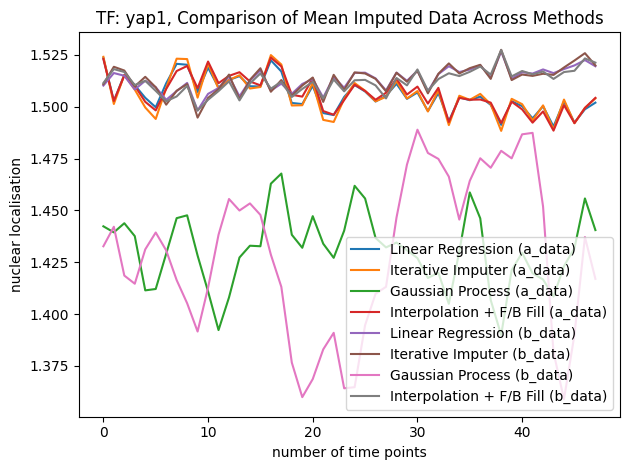

Results for yap1 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.003388  0.046441
1         Iterative Imputer  0.003431  0.047225
2          Gaussian Process  0.419287  0.499777
3  Interpolation + F/B Fill  0.006021  0.061426


Results for yap1 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.003567  0.047102
1         Iterative Imputer  0.003690  0.048199
2          Gaussian Process  0.458935  0.529945
3  Interpolation + F/B Fill  0.006367  0.063408




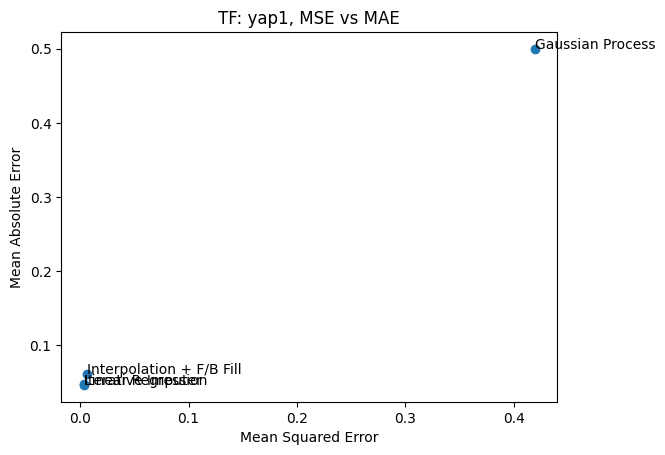

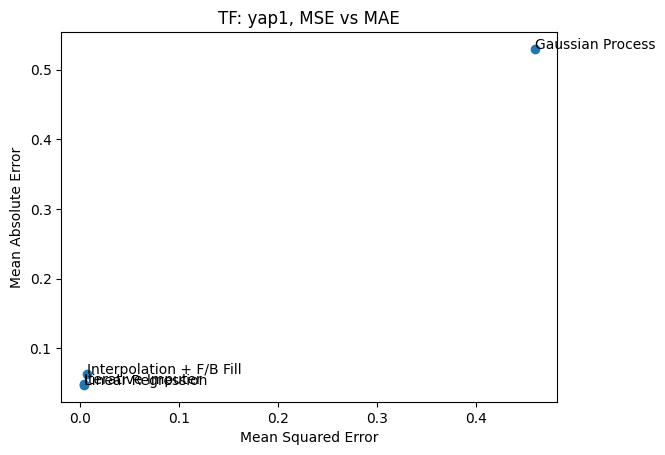

In [14]:
# Load data and define parameters
fname = "./DS_10283_2901/fig2_stress_type_expts.json"
transcription_factors = ["mig1", "mig2", "msn2", "msn4", "dot6", "sfp1", "maf1", "tod6", "hog1", "yap1"]
stress = "gluc"

# concatenate all the data so we can set ylim later 
b_data_all_w_nan = np.array([])
a_data_all_w_nan = np.array([])
with open(fname, "r") as f:
    expts = json.load(f)

for transcription_factor in transcription_factors:
    data = np.array(expts[transcription_factor][stress]["GFP"]["nucLoc"]).astype("float")
    t = np.array(expts[transcription_factor][stress]["general"]["times"]).astype("float")
    b_data = data[:, t[0, :] < 0]
    a_data = data[:, t[0, :] >= 0]
    minlen = np.min([b_data.shape[1], a_data.shape[1]])
    b_data = b_data[:, -minlen:]
    a_data = a_data[:, :minlen]
    # append data so that it can be used for setting ylim in the nan-containing data plot
    b_data_all_w_nan = np.concatenate((b_data_all_w_nan, b_data.flatten()))
    a_data_all_w_nan = np.concatenate((a_data_all_w_nan, a_data.flatten()))

# Simulate missing data and evaluate
try:
    with open(fname, "r") as f:
        expts = json.load(f)

    for transcription_factor in transcription_factors:
        data = np.array(expts[transcription_factor][stress]["GFP"]["nucLoc"]).astype("float")
        t = np.array(expts[transcription_factor][stress]["general"]["times"]).astype("float")
        b_data = data[:, t[0, :] < 0]
        a_data = data[:, t[0, :] >= 0]
        minlen = np.min([b_data.shape[1], a_data.shape[1]])
        b_data = b_data[:, -minlen:]
        a_data = a_data[:, :minlen]

        # Mask 20% of data as NaN for testing, discretely 
        a_data_with_nans, a_nan_mask = introduce_nans(a_data, mask_ratio=0.2, block_size_range=(1, 5))
        b_data_with_nans, b_nan_mask = introduce_nans(b_data, mask_ratio=0.2,
        block_size_range=(1, 5))

        print(f"Number of NaN for a_data is {np.sum(np.isnan(a_data_with_nans))}")
        print(f"Number of NaN for b_data is {np.sum(np.isnan(b_data_with_nans))}")

        # plot true data, because we can't plot the artificially NaN-containing data (the NaNs will make the average 0...)
        plt.figure()
        plt.plot(np.mean(a_data, axis=0), label="after")
        plt.plot(np.mean(b_data, axis=0), label="before")

        # create copies of a_data and b_data and dropna so we can set ylim without encountering errors
        a_data_all_w_nan_copy = a_data_all_w_nan.copy()
        b_data_all_w_nan_copy = b_data_all_w_nan.copy()
        a_data_all_w_nan_copy = a_data_all_w_nan_copy[~np.isnan(a_data_all_w_nan_copy)]
        b_data_all_w_nan_copy = b_data_all_w_nan_copy[~np.isnan(b_data_all_w_nan_copy)]
        # plt.ylim(min(np.min(a_data_all_w_nan_copy), np.min(b_data_all_w_nan_copy)), max(np.max(a_data_all_w_nan_copy), np.max(b_data_all_w_nan_copy)))
        plt.xlabel("number of time points")
        plt.ylabel("nuclear localisation")
        plt.title(f"TF: {transcription_factor} artificially NaN-containing data")
        plt.legend()

        print("Filling NaN...\n")
        # Evaluate each method on masked data
        results_df_a_data = impute_then_evaluate_methods(a_data_with_nans, a_data, a_nan_mask)
        results_df_b_data = impute_then_evaluate_methods(b_data_with_nans, b_data, b_nan_mask)

        # plot after imputation
        plt.figure()
        for index, row in results_df_a_data.iterrows():
            method_name = row["Method"]
            imputed_data = row["Imputed Data"]

            mean_imputed = np.mean(imputed_data, axis=0)
            plt.plot(mean_imputed, label=f"{method_name} (a_data)")

        for index, row in results_df_b_data.iterrows():
            method_name = row["Method"]
            imputed_data = row["Imputed Data"]

            mean_imputed = np.mean(imputed_data, axis=0)
            plt.plot(mean_imputed, label=f"{method_name} (b_data)")

        # plt.ylim(min(np.min(a_data_all_w_nan_copy), np.min(b_data_all_w_nan_copy)), max(np.max(a_data_all_w_nan_copy), np.max(b_data_all_w_nan_copy)))
        plt.xlabel("number of time points")
        plt.ylabel("nuclear localisation")
        plt.title(f"TF: {transcription_factor}, Comparison of Mean Imputed Data Across Methods")
        plt.legend()
        plt.tight_layout()
        plt.show(block=False)

        # Evaluate each method on masked data
        print(f"Results for {transcription_factor} a_data:")
        print(results_df_a_data[['Method', 'MSE', 'MAE']])
        print("\n")

        # Plotting MSE against MAE for each transcription factor
        plt.figure()
        plt.scatter(results_df_a_data['MSE'], results_df_a_data['MAE'], label=results_df_a_data["Method"])
        for i, method in enumerate(results_df_a_data["Method"]):
            plt.annotate(method, (results_df_a_data["MSE"][i], results_df_a_data["MAE"][i]))
        plt.xlabel("Mean Squared Error")
        plt.ylabel("Mean Absolute Error")
        plt.title(f"TF: {transcription_factor}, MSE vs MAE")

        print(f"Results for {transcription_factor} b_data:")
        print(results_df_b_data[['Method', 'MSE', 'MAE']])
        print("\n")

        # Plotting MSE against MAE for each transcription factor
        plt.figure()
        plt.scatter(results_df_b_data['MSE'], results_df_b_data['MAE'], label=results_df_b_data["Method"])
        for i, method in enumerate(results_df_b_data["Method"]):
            plt.annotate(method, (results_df_b_data["MSE"][i], results_df_b_data["MAE"][i]))
        plt.xlabel("Mean Squared Error")
        plt.ylabel("Mean Absolute Error")
        plt.title(f"TF: {transcription_factor}, MSE vs MAE")

except FileNotFoundError:
    print("You need to download test data")
    print(f"\t{fname}")
    print("from https://doi.org/10.1073/pnas.1716659115")

## Masking 40% of the data as NaN

Number of NaN for a_data is 3113
Number of NaN for b_data is 3178
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


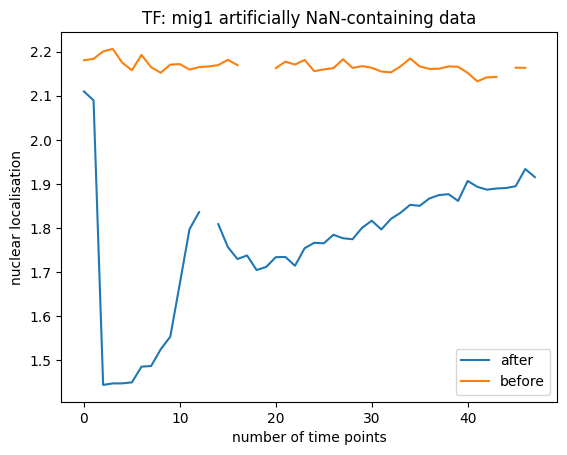

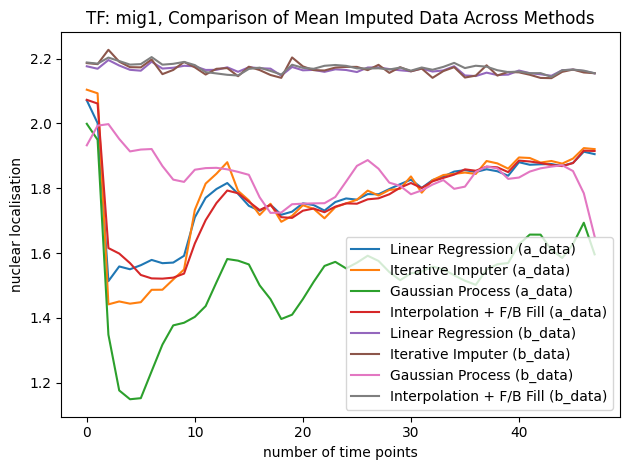

Results for mig1 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.076533  0.221943
1         Iterative Imputer  0.063508  0.188975
2          Gaussian Process  1.115605  0.864015
3  Interpolation + F/B Fill  0.115696  0.244807


Results for mig1 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.069667  0.208726
1         Iterative Imputer  0.074718  0.214538
2          Gaussian Process  1.747956  1.098275
3  Interpolation + F/B Fill  0.082922  0.225630


Number of NaN for a_data is 3047
Number of NaN for b_data is 3040
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packa

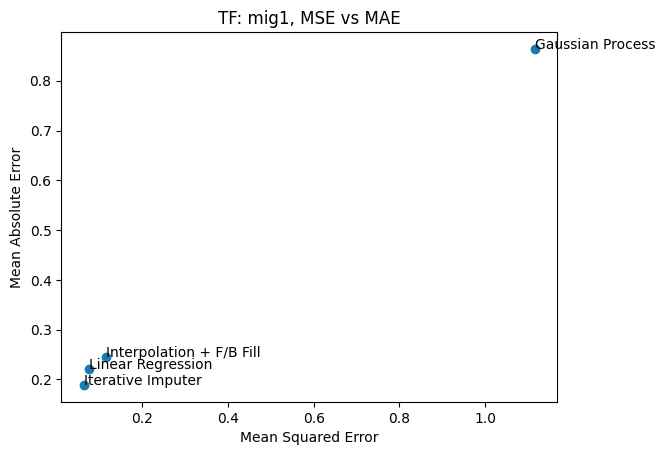

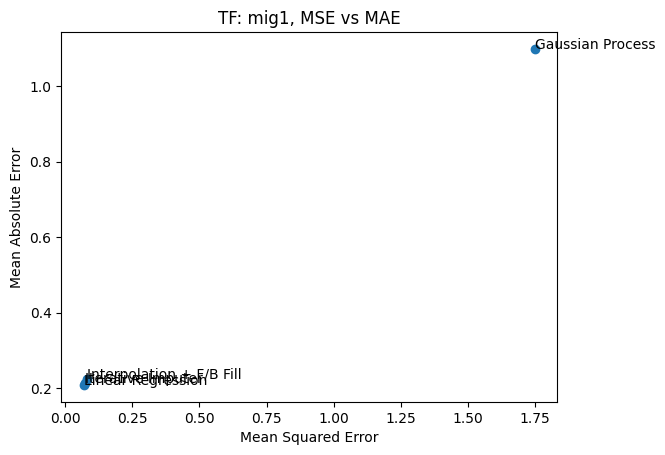

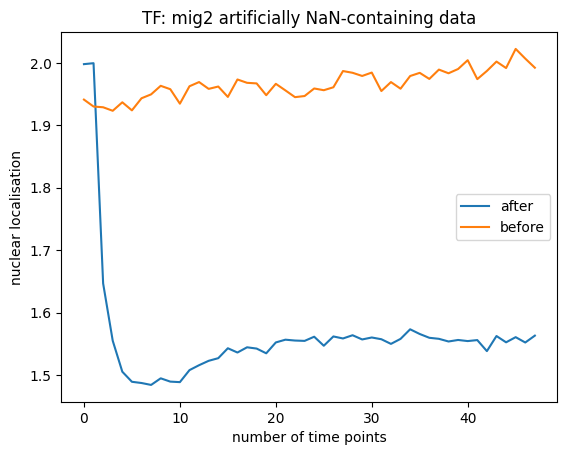

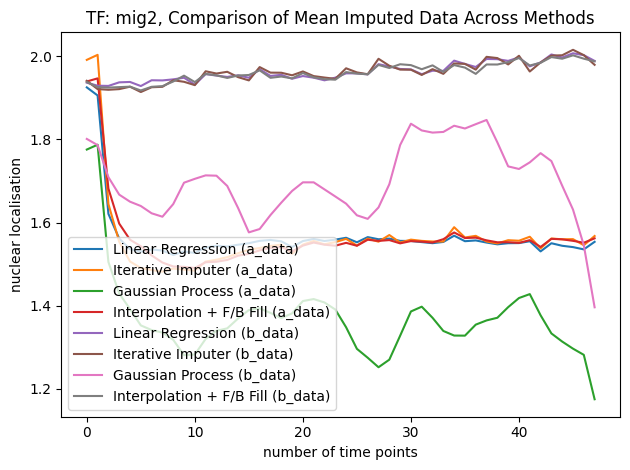

Results for mig2 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.015477  0.085654
1         Iterative Imputer  0.008565  0.070625
2          Gaussian Process  0.685109  0.651913
3  Interpolation + F/B Fill  0.019930  0.089851


Results for mig2 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.028148  0.131883
1         Iterative Imputer  0.028423  0.132579
2          Gaussian Process  1.256727  0.898658
3  Interpolation + F/B Fill  0.031848  0.137785


Number of NaN for a_data is 2974
Number of NaN for b_data is 2937
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


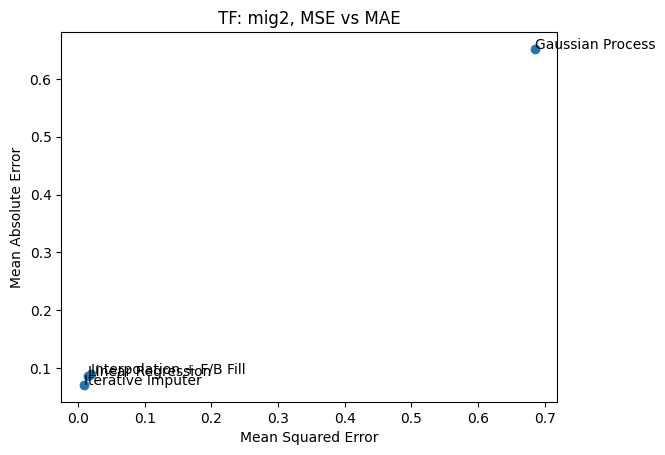

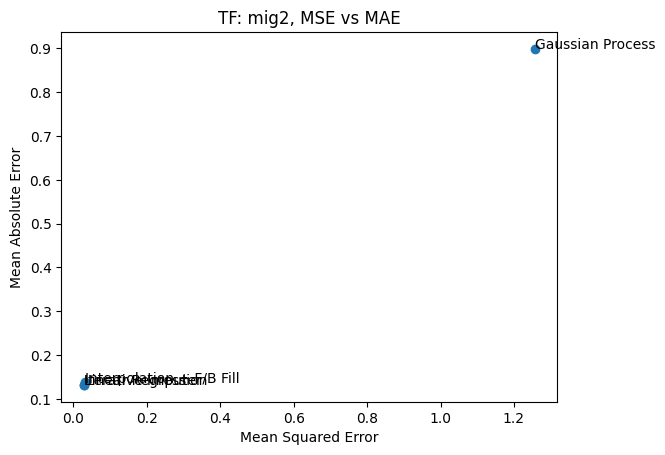

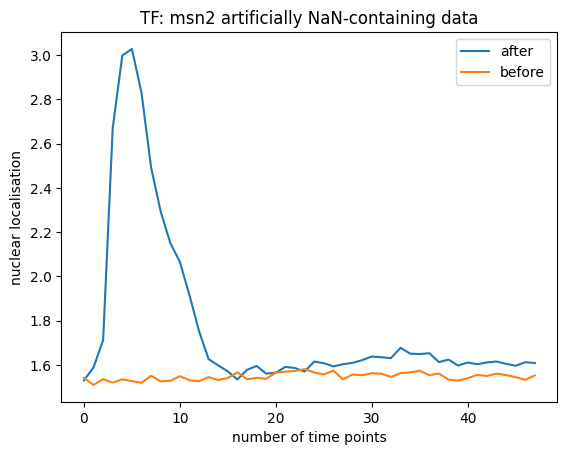

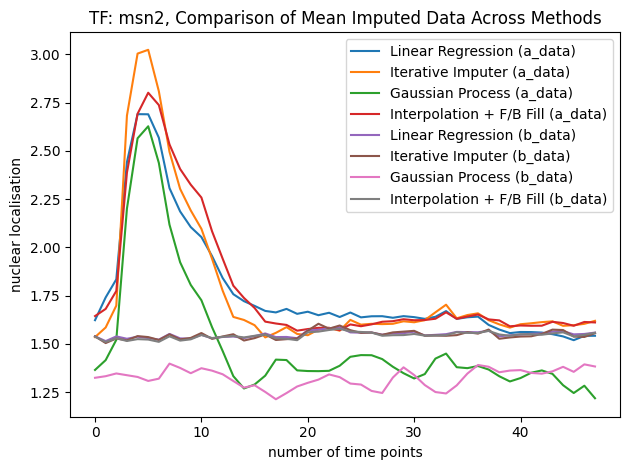

Results for msn2 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.223894  0.341085
1         Iterative Imputer  0.095322  0.229115
2          Gaussian Process  1.316147  0.940404
3  Interpolation + F/B Fill  0.284466  0.334770


Results for msn2 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.033203  0.120944
1         Iterative Imputer  0.050187  0.158501
2          Gaussian Process  0.882267  0.767887
3  Interpolation + F/B Fill  0.047075  0.136837


Number of NaN for a_data is 3244
Number of NaN for b_data is 3196
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or sc

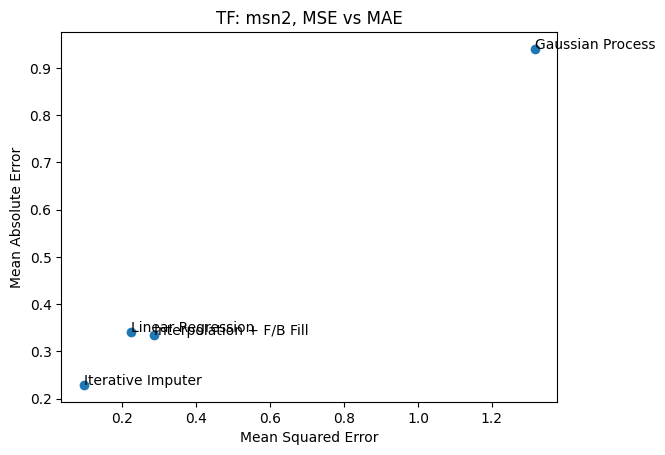

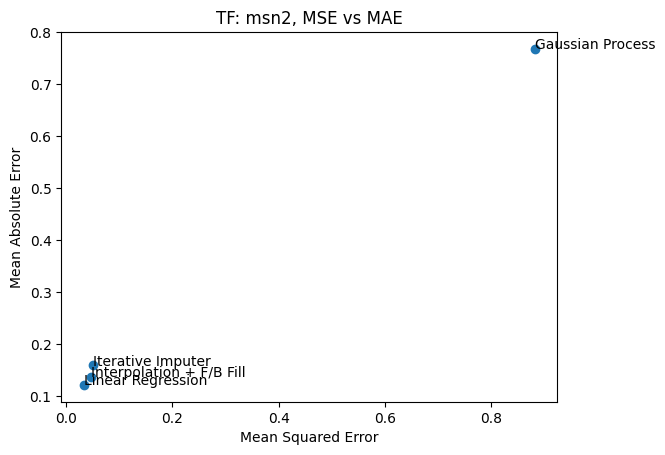

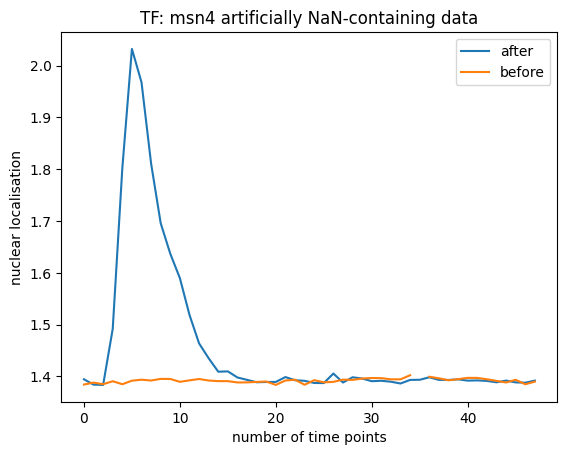

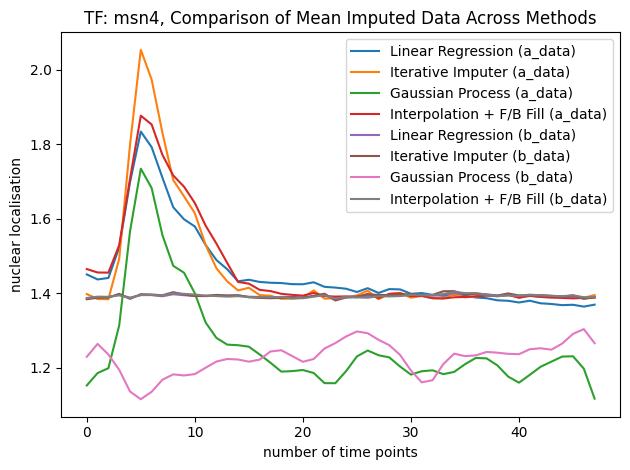

Results for msn4 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.039833  0.119501
1         Iterative Imputer  0.016604  0.079185
2          Gaussian Process  0.707132  0.668883
3  Interpolation + F/B Fill  0.049914  0.121232


Results for msn4 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.002569  0.038412
1         Iterative Imputer  0.003909  0.047656
2          Gaussian Process  0.525711  0.566583
3  Interpolation + F/B Fill  0.004928  0.049467


Number of NaN for a_data is 2886
Number of NaN for b_data is 2912
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


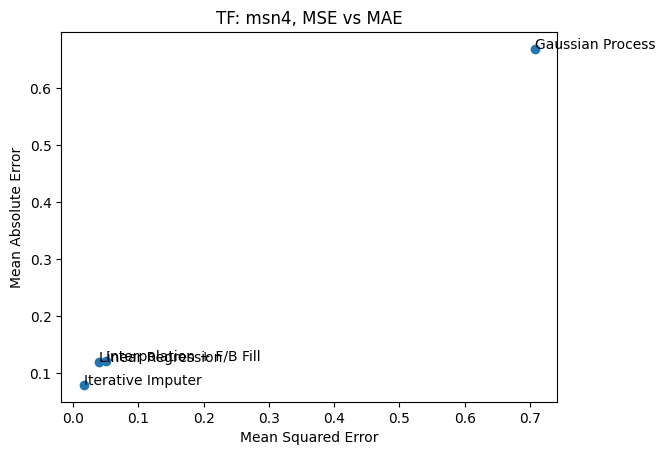

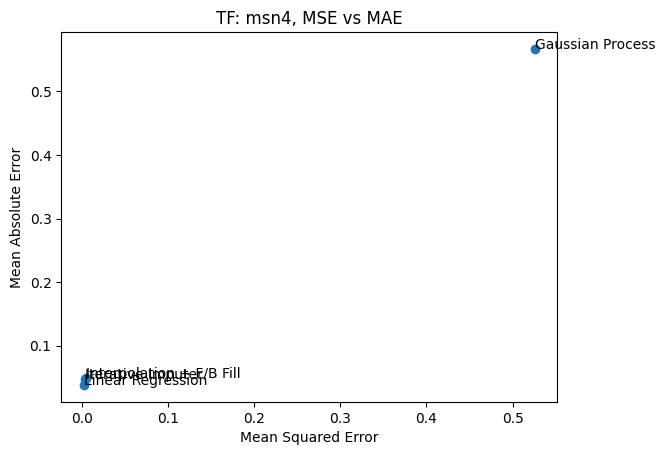

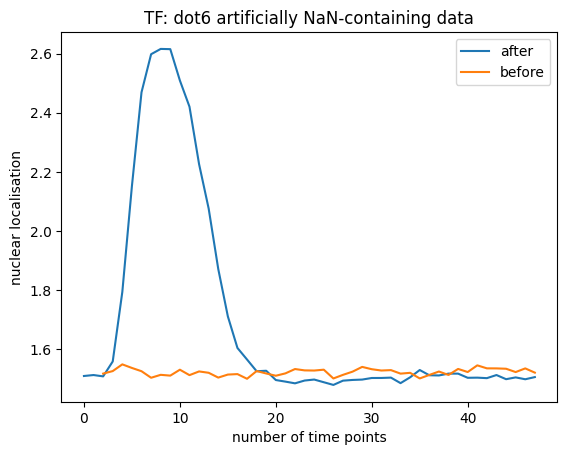

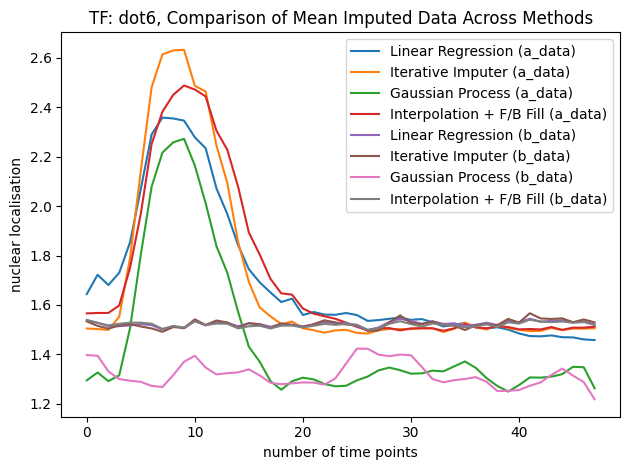

Results for dot6 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.214469  0.298362
1         Iterative Imputer  0.062212  0.156249
2          Gaussian Process  1.077324  0.814680
3  Interpolation + F/B Fill  0.218098  0.264570


Results for dot6 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.026821  0.098863
1         Iterative Imputer  0.022167  0.100289
2          Gaussian Process  0.728374  0.688220
3  Interpolation + F/B Fill  0.022245  0.094481


Number of NaN for a_data is 2500
Number of NaN for b_data is 2430
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


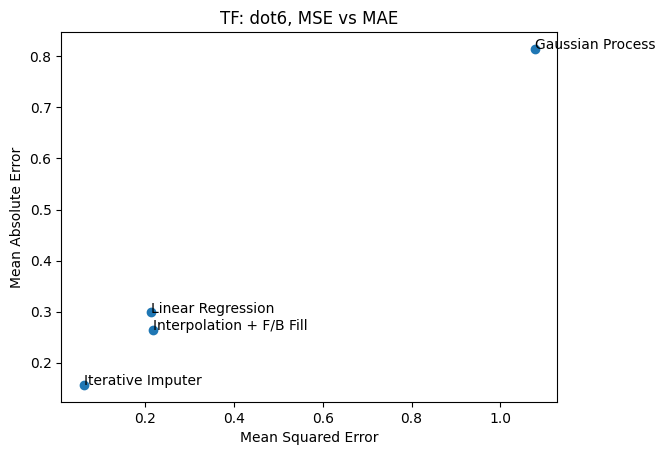

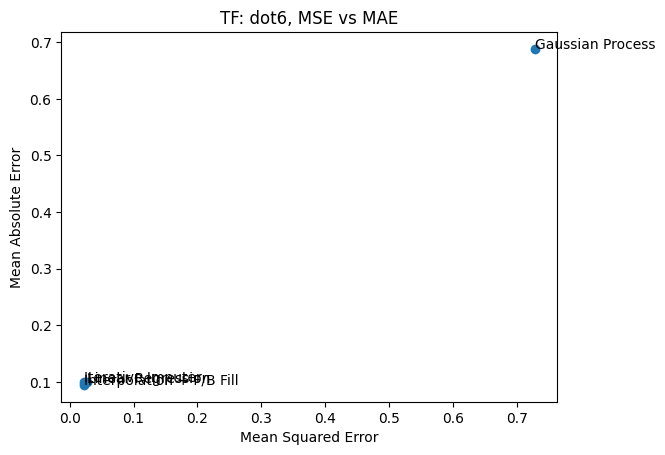

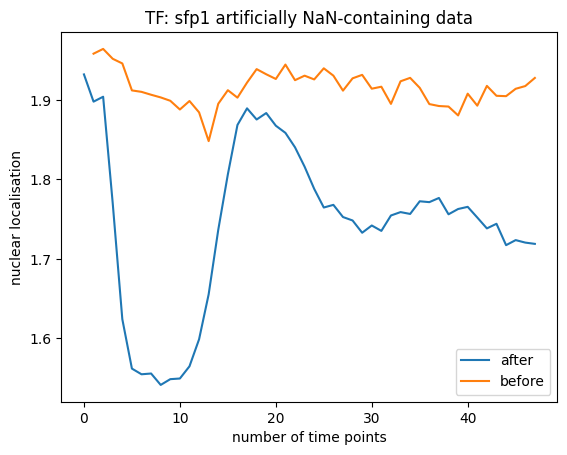

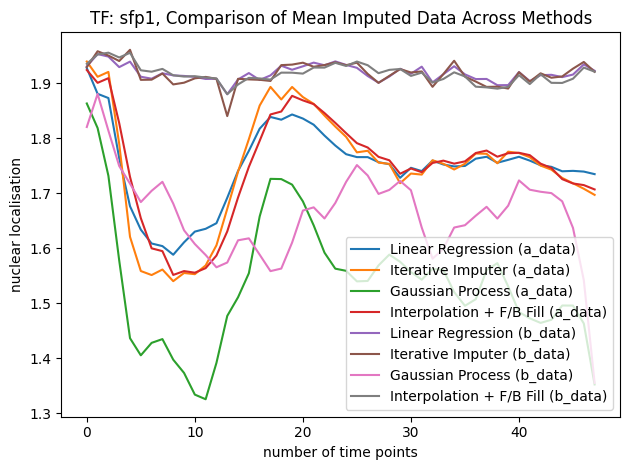

Results for sfp1 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.034949  0.146691
1         Iterative Imputer  0.021525  0.113367
2          Gaussian Process  0.815074  0.717358
3  Interpolation + F/B Fill  0.035177  0.138761


Results for sfp1 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.043229  0.165485
1         Iterative Imputer  0.038481  0.153031
2          Gaussian Process  1.149170  0.869138
3  Interpolation + F/B Fill  0.040437  0.154956


Number of NaN for a_data is 3409
Number of NaN for b_data is 3393
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


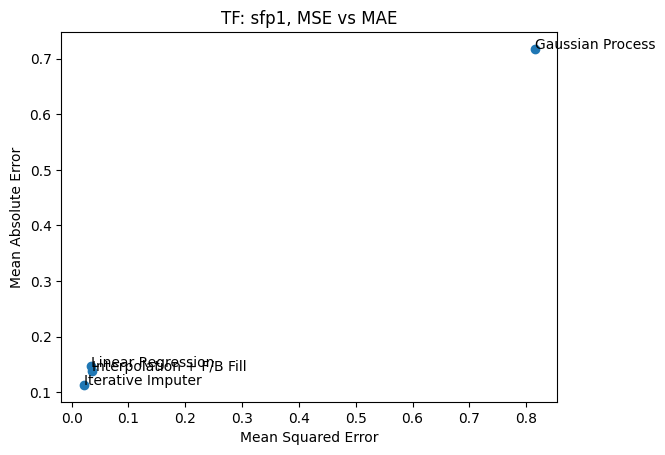

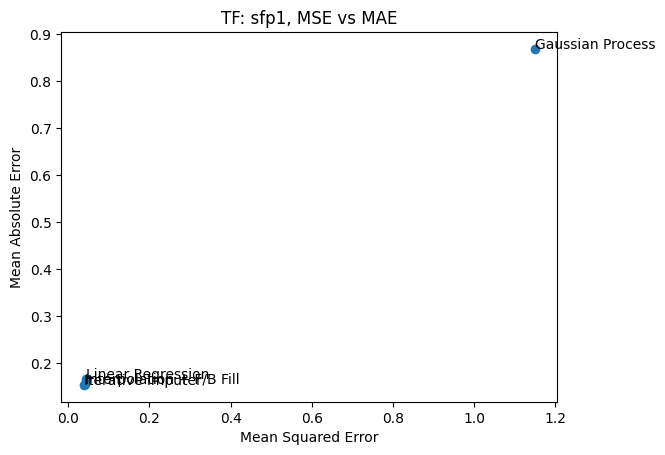

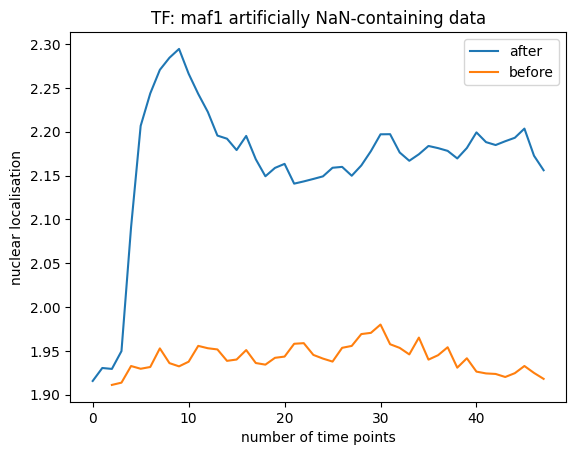

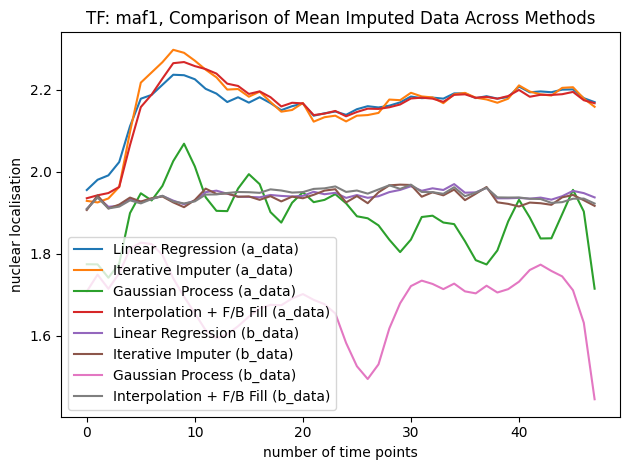

Results for maf1 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.050321  0.175345
1         Iterative Imputer  0.045640  0.164776
2          Gaussian Process  1.419042  0.946187
3  Interpolation + F/B Fill  0.052007  0.169170


Results for maf1 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.035046  0.136645
1         Iterative Imputer  0.036261  0.140090
2          Gaussian Process  1.212927  0.859368
3  Interpolation + F/B Fill  0.033513  0.133183


Number of NaN for a_data is 2059
Number of NaN for b_data is 2066
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


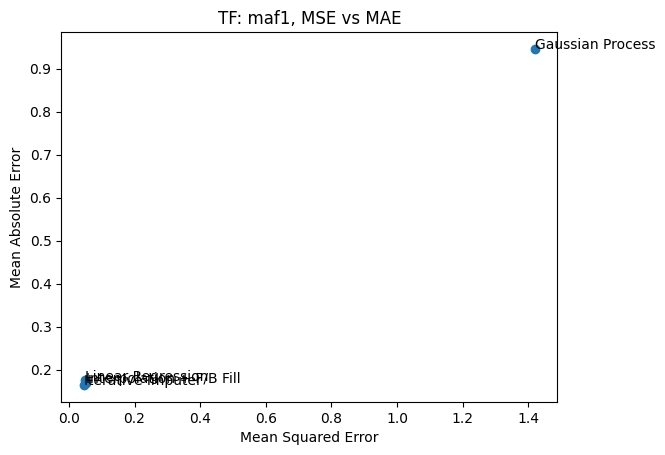

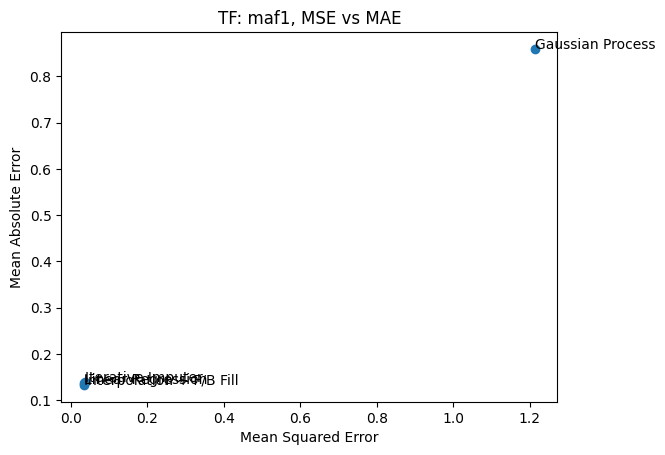

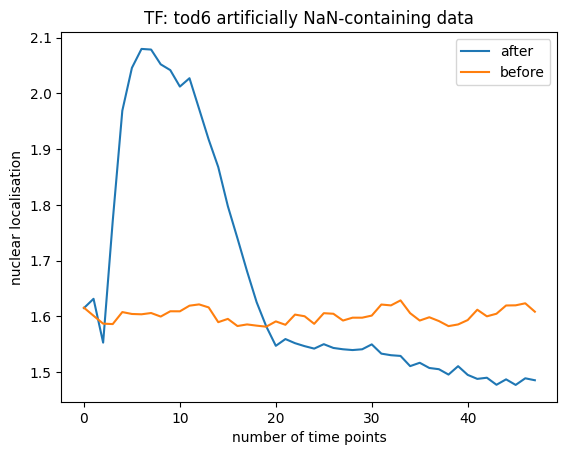

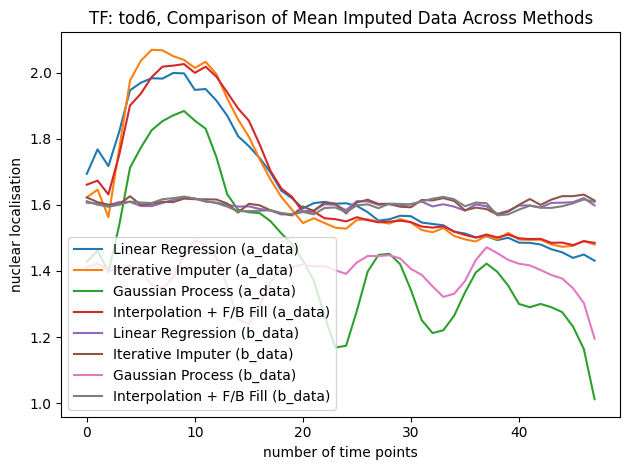

Results for tod6 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.057005  0.166321
1         Iterative Imputer  0.022379  0.111004
2          Gaussian Process  0.788911  0.704126
3  Interpolation + F/B Fill  0.047574  0.137996


Results for tod6 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.040744  0.153029
1         Iterative Imputer  0.029292  0.130905
2          Gaussian Process  0.809189  0.715353
3  Interpolation + F/B Fill  0.039595  0.139726


Number of NaN for a_data is 3057
Number of NaN for b_data is 2940
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


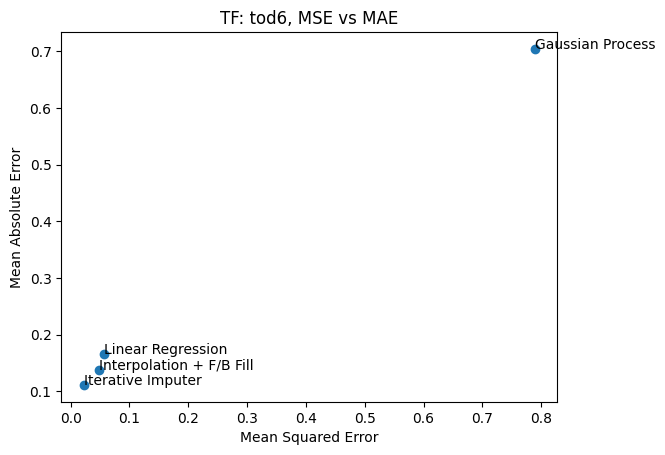

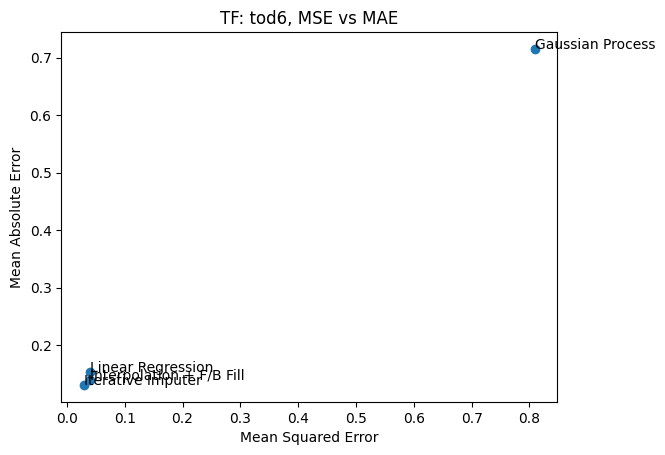

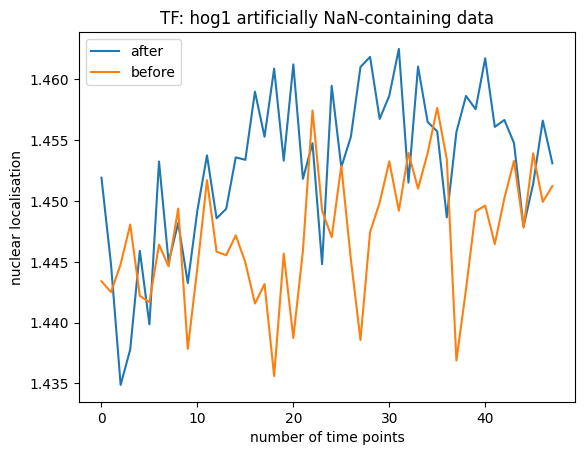

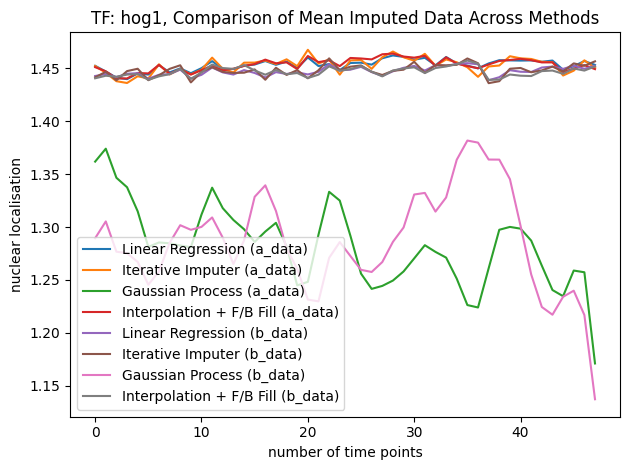

Results for hog1 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.003236  0.044942
1         Iterative Imputer  0.004989  0.055953
2          Gaussian Process  0.552987  0.578512
3  Interpolation + F/B Fill  0.004698  0.054434


Results for hog1 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.003004  0.043057
1         Iterative Imputer  0.004515  0.052985
2          Gaussian Process  0.547064  0.572299
3  Interpolation + F/B Fill  0.005117  0.056573


Number of NaN for a_data is 3426
Number of NaN for b_data is 3316
Filling NaN...



/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/ianyang/micromamba/envs/wela/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


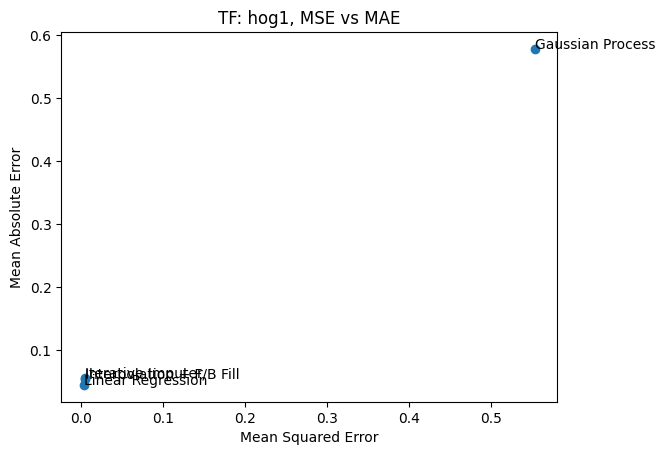

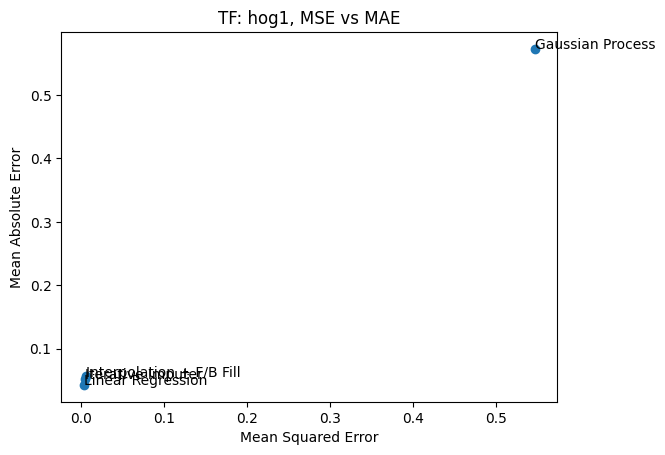

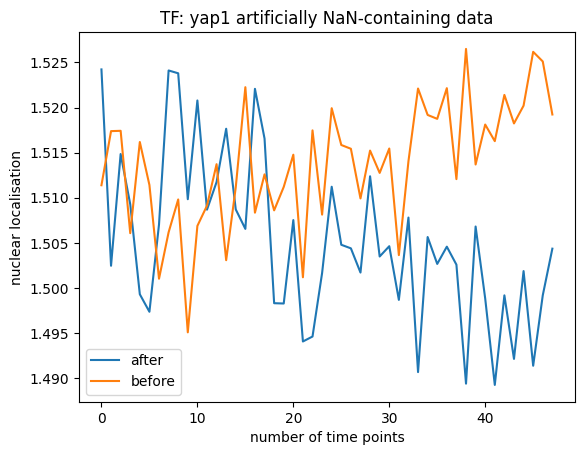

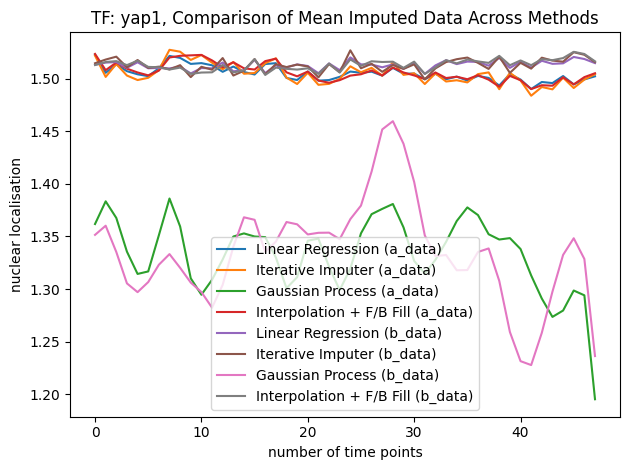

Results for yap1 a_data:
                     Method       MSE       MAE
0         Linear Regression  0.003446  0.046595
1         Iterative Imputer  0.005167  0.056843
2          Gaussian Process  0.590992  0.599269
3  Interpolation + F/B Fill  0.005709  0.059712


Results for yap1 b_data:
                     Method       MSE       MAE
0         Linear Regression  0.003829  0.049157
1         Iterative Imputer  0.005363  0.057687
2          Gaussian Process  0.639878  0.628673
3  Interpolation + F/B Fill  0.006376  0.063744




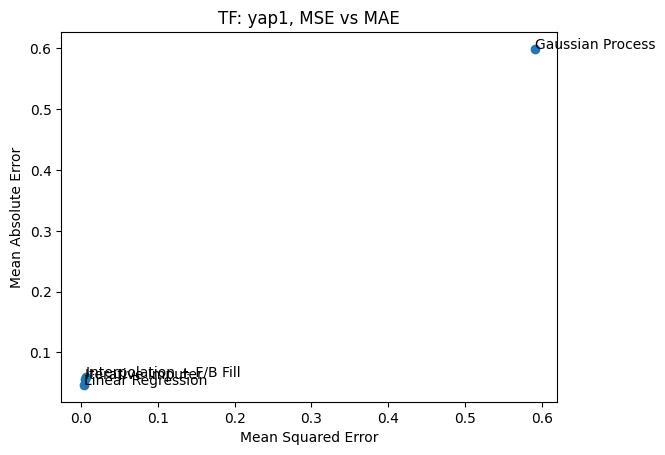

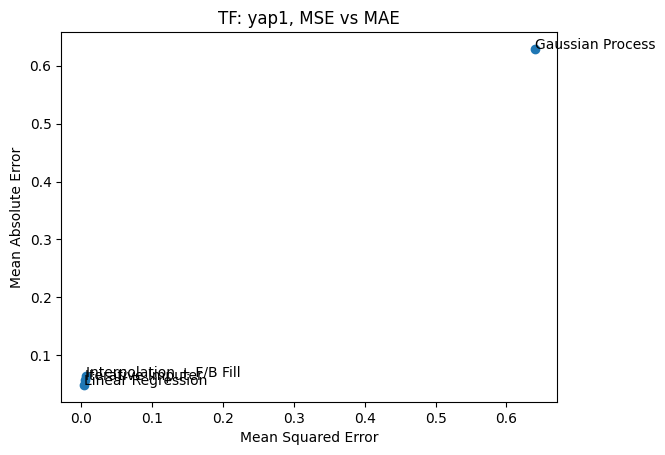

In [15]:
# Load data and define parameters
fname = "./DS_10283_2901/fig2_stress_type_expts.json"
transcription_factors = ["mig1", "mig2", "msn2", "msn4", "dot6", "sfp1", "maf1", "tod6", "hog1", "yap1"]
stress = "gluc"

# concatenate all the data so we can set ylim later 
b_data_all_w_nan = np.array([])
a_data_all_w_nan = np.array([])
with open(fname, "r") as f:
    expts = json.load(f)

for transcription_factor in transcription_factors:
    data = np.array(expts[transcription_factor][stress]["GFP"]["nucLoc"]).astype("float")
    t = np.array(expts[transcription_factor][stress]["general"]["times"]).astype("float")
    b_data = data[:, t[0, :] < 0]
    a_data = data[:, t[0, :] >= 0]
    minlen = np.min([b_data.shape[1], a_data.shape[1]])
    b_data = b_data[:, -minlen:]
    a_data = a_data[:, :minlen]
    # append data so that it can be used for setting ylim in the nan-containing data plot
    b_data_all_w_nan = np.concatenate((b_data_all_w_nan, b_data.flatten()))
    a_data_all_w_nan = np.concatenate((a_data_all_w_nan, a_data.flatten()))

# Simulate missing data and evaluate
try:
    with open(fname, "r") as f:
        expts = json.load(f)

    for transcription_factor in transcription_factors:
        data = np.array(expts[transcription_factor][stress]["GFP"]["nucLoc"]).astype("float")
        t = np.array(expts[transcription_factor][stress]["general"]["times"]).astype("float")
        b_data = data[:, t[0, :] < 0]
        a_data = data[:, t[0, :] >= 0]
        minlen = np.min([b_data.shape[1], a_data.shape[1]])
        b_data = b_data[:, -minlen:]
        a_data = a_data[:, :minlen]

        # Mask 20% of data as NaN for testing, discretely 
        a_data_with_nans, a_nan_mask = introduce_nans(a_data, mask_ratio=0.4, block_size_range=(1, 5))
        b_data_with_nans, b_nan_mask = introduce_nans(b_data, mask_ratio=0.4,
        block_size_range=(1, 5))

        print(f"Number of NaN for a_data is {np.sum(np.isnan(a_data_with_nans))}")
        print(f"Number of NaN for b_data is {np.sum(np.isnan(b_data_with_nans))}")

        # plot true data, because we can't plot the artificially NaN-containing data (the NaNs will make the average 0...)
        plt.figure()
        plt.plot(np.mean(a_data, axis=0), label="after")
        plt.plot(np.mean(b_data, axis=0), label="before")

        # create copies of a_data and b_data and dropna so we can set ylim without encountering errors
        a_data_all_w_nan_copy = a_data_all_w_nan.copy()
        b_data_all_w_nan_copy = b_data_all_w_nan.copy()
        a_data_all_w_nan_copy = a_data_all_w_nan_copy[~np.isnan(a_data_all_w_nan_copy)]
        b_data_all_w_nan_copy = b_data_all_w_nan_copy[~np.isnan(b_data_all_w_nan_copy)]
        # plt.ylim(min(np.min(a_data_all_w_nan_copy), np.min(b_data_all_w_nan_copy)), max(np.max(a_data_all_w_nan_copy), np.max(b_data_all_w_nan_copy)))
        plt.xlabel("number of time points")
        plt.ylabel("nuclear localisation")
        plt.title(f"TF: {transcription_factor} artificially NaN-containing data")
        plt.legend()

        print("Filling NaN...\n")
        # Evaluate each method on masked data
        results_df_a_data = impute_then_evaluate_methods(a_data_with_nans, a_data, a_nan_mask)
        results_df_b_data = impute_then_evaluate_methods(b_data_with_nans, b_data, b_nan_mask)

        # plot after imputation
        plt.figure()
        for index, row in results_df_a_data.iterrows():
            method_name = row["Method"]
            imputed_data = row["Imputed Data"]

            mean_imputed = np.mean(imputed_data, axis=0)
            plt.plot(mean_imputed, label=f"{method_name} (a_data)")

        for index, row in results_df_b_data.iterrows():
            method_name = row["Method"]
            imputed_data = row["Imputed Data"]

            mean_imputed = np.mean(imputed_data, axis=0)
            plt.plot(mean_imputed, label=f"{method_name} (b_data)")

        # plt.ylim(min(np.min(a_data_all_w_nan_copy), np.min(b_data_all_w_nan_copy)), max(np.max(a_data_all_w_nan_copy), np.max(b_data_all_w_nan_copy)))
        plt.xlabel("number of time points")
        plt.ylabel("nuclear localisation")
        plt.title(f"TF: {transcription_factor}, Comparison of Mean Imputed Data Across Methods")
        plt.legend()
        plt.tight_layout()
        plt.show(block=False)

        # Evaluate each method on masked data
        print(f"Results for {transcription_factor} a_data:")
        print(results_df_a_data[['Method', 'MSE', 'MAE']])
        print("\n")

        # Plotting MSE against MAE for each transcription factor
        plt.figure()
        plt.scatter(results_df_a_data['MSE'], results_df_a_data['MAE'], label=results_df_a_data["Method"])
        for i, method in enumerate(results_df_a_data["Method"]):
            plt.annotate(method, (results_df_a_data["MSE"][i], results_df_a_data["MAE"][i]))
        plt.xlabel("Mean Squared Error")
        plt.ylabel("Mean Absolute Error")
        plt.title(f"TF: {transcription_factor}, MSE vs MAE")

        print(f"Results for {transcription_factor} b_data:")
        print(results_df_b_data[['Method', 'MSE', 'MAE']])
        print("\n")

        # Plotting MSE against MAE for each transcription factor
        plt.figure()
        plt.scatter(results_df_b_data['MSE'], results_df_b_data['MAE'], label=results_df_b_data["Method"])
        for i, method in enumerate(results_df_b_data["Method"]):
            plt.annotate(method, (results_df_b_data["MSE"][i], results_df_b_data["MAE"][i]))
        plt.xlabel("Mean Squared Error")
        plt.ylabel("Mean Absolute Error")
        plt.title(f"TF: {transcription_factor}, MSE vs MAE")

except FileNotFoundError:
    print("You need to download test data")
    print(f"\t{fname}")
    print("from https://doi.org/10.1073/pnas.1716659115")

# Conclusion: IterativeImputer outcompetes others by a small margin
The final script to use is as below, using ``IterativeImputer``, pre-fixed, gridsearched C and gamma values within the range ``np.logspace(-2, 2, 5)`` for SVM before parsing into ``MIdecoding.py``.

In [ ]:
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from wela.MIdecoding import estimate_MI, plot_MI
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
import time

# Load data and define parameters
fname = "./DS_10283_2901/fig2_stress_type_expts.json"
transcription_factors = ["mig1", "mig2", "msn2", "msn4", "dot6", "sfp1", "maf1", "tod6", "hog1", "yap1"]
stress = "gluc"
param_grid = {
    'C': np.logspace(-2, 2, 5),
    'gamma': np.logspace(-2, 2, 5)
}

try:
    with open(fname, "r") as f:
        expts = json.load(f)

    plt.figure()

    # Loop through each transcription factor and find optimal SVM parameters
    for transcription_factor in transcription_factors:
        print(f"Processing transcription factor: {transcription_factor}")
        
        # Load data for the transcription factor
        data = np.array(expts[transcription_factor][stress]["GFP"]["nucLoc"]).astype("float")
        t = np.array(expts[transcription_factor][stress]["general"]["times"]).astype("float")
        b_data = data[:, t[0, :] < 0]
        a_data = data[:, t[0, :] >= 0]
        minlen = np.min([b_data.shape[1], a_data.shape[1]])
        b_data = b_data[:, -minlen:]
        a_data = a_data[:, :minlen]

        # Impute missing values using multivariate imputation
        imp_mean = IterativeImputer(random_state=0)
        a_data = imp_mean.fit_transform(a_data)
        b_data = imp_mean.fit_transform(b_data)

        # Prepare data for SVM tuning
        X = np.concatenate((b_data, a_data), axis=1).T  # Transpose for (samples, features) shape
        y = np.array([0] * b_data.shape[1] + [1] * a_data.shape[1])

        # Grid search for best SVM parameters
        svc = SVC()
        grid_search = GridSearchCV(svc, param_grid, cv=3, n_jobs=-1, scoring='accuracy')
        grid_search.fit(X, y)
        
        best_params = grid_search.best_params_
        print(f"Best parameters for {transcription_factor}: C={best_params['C']}, gamma={best_params['gamma']}")

        # Time the MI estimation
        start_time = time.time()
        res = estimate_MI([b_data, a_data], verbose=False, overtime=True,
                          Crange=[best_params['C']],
                          gammarange=[best_params['gamma']])
        end_time = time.time()
        estimation_time = end_time - start_time
        print(f"Time taken to estimate MI for {transcription_factor}: {estimation_time:.2f} seconds")
        
        # Plot MI result for each transcription factor
        plot_MI(res, label=transcription_factor, color=plt.cm.tab10(transcription_factors.index(transcription_factor) % 10))

    # Customize plot
    plt.xlabel("Response duration (min)")
    plt.ylabel("Mutual Information (bits)")
    plt.legend(loc="best")
    plt.show(block=False)

except FileNotFoundError:
    print("You need to download test data")
    print(f"\t{fname}")
    print("from https://doi.org/10.1073/pnas.1716659115")